# Comparative Analysis of Neural Networks and Genereal NLP Methods on An Academic Jounal Artical Database

### BSc Computer Science (Data Science) Final Project

the original codes


Author: (Freda) Xiaoyun Yu

UOL Student Number: 190178194

Time: Oct. 2022  ~ Mar. 2023

License: All Rights Reserved. You must not copy any code inside this file, especially if you are a University of London student. If you are a company and want to use my models, please contact with me by email shireenyu2@163.com. My conclusions for these models can be referenced in your paper. To avoid social moral issues, my models must not be used in real life weeding people process, for example filtering candidates in an interview, or filtering any candidate journal article. 

Notes: This file is only the codes. For the Final Report, please see another document. For the experiment records, please also see the corresponding document. 

# Table of Contents

Introduction

----Aims

----Commonsense Baseline

Data Processing

----Data Handling After Retrieving Data from EventRegistry.org

----Data Reading

----Data pre-processing

--------Remove unwanted characters

--------Lowercase and expand contractions

--------Remove stopwords & lemmatisation

--------Store X and Y Data Together

----Output Data Into Files

Train-Test Splitting

Neural Network Data Processing

----Feed Data to Keras (Chollet Step 4)

--------Original Data

--------Cleansed Data

Feed-Forward Neural Network (FNN) Models

----Test the Data on A Small Model (Chollet Step 5)

----Developing A Model that Overfits (Chollet Step 6)

----Controlled Experiments & Hyperparameter Discussions (Chollet Step 7)

--------Controlled experiment - batch size

--------Controlled experiment - number of layers

--------Controlled experiment - activation functions

--------Controlled experiment - neuron numbers

--------Controlled experiment - optimizers

--------Controlled experiment - regularisation

----Grid Search with GridsearchCV

----Repetition of the Best Performing Feed-Forward Neural Network Model(s)

--------1.

--------2.

--------3.

Classification Using Classical NLP Models

----Vectorizer: TF-IDF; Classifier: Support Vector Classifier

----Vectorizer: Count Vectorizer; Classifier: Support Vector Classifier

----Vectorizer: Bigram; Classifier: Support Vector Classifier

----Vectorizer: TF-IDF; Classifier: Multinomial Naive Bayes

----Vectorizer: Count Vectorizer; Classifier: Multinomial Naive Bayes

----Vectorizer: Bigram; Classifier: Multinomial Naive Bayes

----Vectorizer: TF-IDF; Classifier: Random Forest

----Vectorizer: Count Vectorizer; Classifier: Random Forest

----Vectorizer: Bigram; Classifier: Random Forest

----Vectorizer: TF-IDF; Classifier: K-Nearest Neighbors

----Vectorizer: Count Vectorizer; Classifier: K-Nearest Neighbors

----Vectorizer: Bigram; Classifier: K-Nearest Neighbors

Deep Neural Network (DNN) Models

----Convolutional Neural Network (CNN)

--------Pre-Trained Model Provided by Chollet

--------Pre-Trained Model Provided by Bilibili

--------Pre-Trained Model Provided by the Book 'Python Deep Learning'

--------Fine Tuning on the Best Performing CNN So Far

----Recurrent Neural Network (RNN)

--------Pre-Trained Model Provided by Chollet

--------Pre-Trained Model Provided by the Book 'TensorFlow Machine Learning Cookbook'

--------LSTM Layer Model Provided by Chollet

--------DropConnect Function and the Settings Provided by AWD-LSTM

--------Pre-Trained Model Provided by the Book 'TensorFlow Learning From Zero'

Topic Modelling Latent Dirchlet Allocation (LDA) - Unsupervised Learning

Summary of Models

References for This Code Report

# Introduction


## Aims

- Transform the data retrieved from the journal articles API so that they can be fed into any of my ML model; 

- Do correct and effective data cleansing to get a dataset in a higher quality; 

- Considering the later usage of the cleansed data, I should output my data into files to store; 

- Before running any model, try to fix all the random seeds, so that the experiment records can be repeated; 

- Build a small FNN (specifically, FCNN) that underfits the article data I have collected; 

- Build an overfitting FNN (specifically, FCNN) for the article data; 

- Conduct controlled experiments for each of the hyperparameter in a FNN, to observe any potential patterns, and to find the potential cadidates that can be used to construct a higher-quality model; 

- Use Grid Search method to find a better-performing model than any of my constructed FNN; 

- Construct an effective CNN which can win the commonsense baseline; 

- Construct an effective RNN which can win the commensense baseline; 

- Try to adopt any pre-existing DNN model mentioned either from books, online webpages, online videos, Github codes, or the settings mentioned by any famous paper, to improve the performance of models constructed by me; 

- Use Topic Modelling LDA unsupervised learning method to render groups of topics, and explore any findings; 

- Adopt reasonable evaluation methods to evaluate each model, including classification report, heatmap, ROC curves; 

- Summarise the best-performing models. 


## Commonsense Baseline

My collected data are from 6 categories, with 100 samples in each, so the sample is balanced. Therefore, the commonsense baseline for a classification model should be 1/6 = 0.167. 



# Data Processing
## Data Handling After Retrieving Data from EventRegistry.org

EventRegistry https://www.newsapi.ai/ provides us with JSON format output. Now, all the data are inside separated EXCEL files, which are what I have converted from the JSON format. What I need to do, is firstly to combine these EXCEL files into one file, and add the Y labels for each of the data entry. 

Installation of python packages: 

In [15]:
! pip install -i https://pypi.tuna.tsinghua.edu.cn/simple sklearn

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 7.5/7.5 MB 2.5 MB/s eta 0:00:00
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1310 sha256=d0483ae358167537703c469d4a95a95663354e32643bd3617c6c354aa6c0c49d
  Stored in directory: c:\users\administrator\appdata\local\pip\cache\wheels\68\b7\de\9d0947d82574c2a664942f4dd7f5b53b94267e50179e6a1360
Successfully built sklearn


In [3]:
! pip install seaborn

     ------------------------------------- 288.2/288.2 kB 72.9 kB/s eta 0:00:00


In [6]:
! pip install xlrd

     -------------------------------------- 96.5/96.5 kB 324.4 kB/s eta 0:00:00


In [8]:
! pip install openpyxl

     ------------------------------------ 242.1/242.1 kB 280.1 kB/s eta 0:00:00


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Firstly, we open one of the category files - biology, and see what's in there. 
file = r'biology.json.xlsx'
df0 = pd.read_excel(file)
df0.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7216495856,eng,False,2022-10-07,17:31:00,2022-10-07T17:31:00Z,2022-10-07T17:31:00Z,news,0.000000,...,NaN,0.011765,25,25,NaN,NaN,NaN,NaN,NaN,biology
1,NaN,7231285056,eng,False,2022-10-19,16:35:00,2022-10-19T16:35:00Z,2022-10-19T16:34:00Z,news,0.000000,...,NaN,0.223529,24,24,NaN,NaN,NaN,NaN,NaN,biology
2,NaN,7211002059,eng,False,2022-10-03,15:56:00,2022-10-03T15:56:00Z,2022-10-03T15:56:00Z,news,0.729412,...,eng-8068287,-0.027451,24,24,NaN,NaN,NaN,NaN,NaN,biology


In [3]:
df0.describe()

,record,uri,sim,source,sentiment,wgt,relevance,authors
count,0.0,1.000000e+02,100.000000,0.0,98.000000,100.000000,100.000000,0.0
mean,NaN,7.215844e+09,0.154431,NaN,0.044498,18.740000,18.740000,NaN
std,NaN,1.114325e+07,0.280407,NaN,0.171362,1.750152,1.750152,NaN
min,NaN,7.195387e+09,0.000000,NaN,-0.513725,17.000000,17.000000,NaN
25%,NaN,7.206717e+09,0.000000,NaN,-0.049020,17.000000,17.000000,NaN
50%,NaN,7.213720e+09,0.000000,NaN,0.047059,19.000000,19.000000,NaN
75%,NaN,7.225229e+09,0.000000,NaN,0.160784,19.250000,19.250000,NaN
max,NaN,7.233955e+09,0.917647,NaN,0.443137,25.000000,25.000000,NaN


In [59]:
df0.columns  # list all the column names

Index(['record', 'uri', 'lang', 'isDuplicate', 'date', 'time', 'dateTime',
       'dateTimePub', 'dataType', 'sim', 'url', 'title', 'body', 'source',
       'uri.1', 'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment',
       'wgt', 'relevance', 'authors', 'uri.2', 'name', 'type', 'isAgency',
       'category'],
      dtype='object')

In [60]:
df0.iloc[5]['body'] # examine one of the article body within the category of biology

'Here, in our study, we analyzed high-quality transcriptomes in more than 112,000 individual cells from sciatic nerve tissue, which enabled deciphering the cellular composition of naive nerve among five major cell groups including Schwann cells, fibroblasts, lymphoid cells, myeloid cells, and vascular cells. Further, we also investigated the molecular consequences after injury using the chronic constriction injury (CCI) model10,11,12 in which rats develop chronic neuropathic pain within days of injury. Our study reports on the identification of 45 different cell subtypes in naive tissue, and 23 transient or persistent cell subtypes that emerge after injury, and reveals the ligand-receptor interactions among them. This study provides a foundational resource for the exploration of cellular interactions that accompany nerve injury, and may inspire future studies exploring novel drug targets as well as the causality that underlie the emergence and persistence of nociception in painful cond

In [61]:
# Check duplicated data - No repeated data. 
df0.duplicated().sum()

0

In [62]:
# Double check, since there is a column named 'isDuplicate'
df0_dup = df0[df0['isDuplicate'] == 'True']
print(df0_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [63]:
# Check empty data, especially the 'body' column
df0['body'].isnull().sum()

0

In [64]:
len(df0['body']) # how many records

100

In [65]:
# Then, we check the chemistry file, and see what's in there. 
file = r'chemistry.json.xlsx'
df1 = pd.read_excel(file)
df1.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7213732540,eng,False,2022-10-05,17:00:00,2022-10-05T17:00:00Z,2022-10-05T17:00:00Z,news,0.670588,...,eng-8076924,0.513725,21,21,NaN,NaN,NaN,NaN,NaN,chemistry
1,NaN,7231239765,eng,False,2022-10-19,15:56:00,2022-10-19T15:56:00Z,2022-10-19T15:56:00Z,news,0.000000,...,NaN,0.168627,19,19,NaN,NaN,NaN,NaN,NaN,chemistry
2,NaN,7213560758,eng,False,2022-10-05,14:32:00,2022-10-05T14:32:00Z,2022-10-05T14:31:00Z,news,0.682353,...,eng-8076924,0.207843,17,17,NaN,laura_baisas@popsci.com,Laura Baisas,author,False,chemistry


In [66]:
df1.columns  # list all the column names

Index(['record', 'uri', 'lang', 'isDuplicate', 'date', 'time', 'dateTime',
       'dateTimePub', 'dataType', 'sim', 'url', 'title', 'body', 'source',
       'uri.1', 'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment',
       'wgt', 'relevance', 'authors', 'uri.2', 'name', 'type', 'isAgency',
       'category'],
      dtype='object')

In [67]:
# Check duplicated data - No repeated data. 
df1.duplicated().sum()

0

In [68]:
df1_dup = df1[df1['isDuplicate'] == 'True']
print(df1_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [69]:
# Check empty data, especially the 'body' column
df1['body'].isnull().sum()

0

In [70]:
# Double check, since there is a column named 'isDuplicate'
df1_dup = df1[df1['isDuplicate'] == 'True']
print(df1_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [71]:
# Check empty data, especially the 'body' column
df1['body'].isnull().sum()

0

In [72]:
len(df1['body']) # how many records

100

In [73]:
# Then, we check the chemistry file, and see what's in there. 
file = r'earth_sciences.json.xlsx'
df2 = pd.read_excel(file)
df2.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7.231221e+09,eng,False,2022-10-19,15:40:00,2022-10-19T15:40:00Z,2022-10-19T15:17:00Z,news,0.686275,...,fra-898753,-0.105882,22.0,22.0,NaN,NaN,NaN,NaN,NaN,earth_sciences
1,NaN,7.226882e+09,eng,False,2022-10-16,08:30:00,2022-10-16T08:30:00Z,2022-10-16T07:58:00Z,news,0.000000,...,NaN,-0.145098,22.0,22.0,NaN,NaN,NaN,NaN,NaN,earth_sciences
2,NaN,7.223001e+09,eng,False,2022-10-13,04:25:00,2022-10-13T04:25:00Z,2022-10-13T03:48:00Z,news,0.458824,...,eng-8091183,-0.019608,22.0,22.0,NaN,NaN,NaN,NaN,NaN,earth_sciences


In [74]:
# Check duplicated data - No repeated data. 
df2.duplicated().sum()

0

In [75]:
# Double check, since there is a column named 'isDuplicate'
df2_dup = df2[df2['isDuplicate'] == 'True']
print(df2_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [76]:
# Check empty data, especially the 'body' column - There is indeed one line which is empty. 
df2['body'].isnull().sum()

1

In [77]:
# We just delete this line, and then update our dataframe
df2 = df2[df2['body'].notnull()]          

In [78]:
# Check empty data after deleted the empty row
df2['body'].isnull().sum()

0

In [79]:
len(df2['body'])  # how many records

100

In [80]:
# Then, we check the math file, and see what's in there. 
file = r'math.json.xlsx'
df3 = pd.read_excel(file)
df3.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7.231245e+09,eng,False,2022-10-19,16:00:00,2022-10-19T16:00:00Z,2022-10-19T16:00:00Z,news,0.000000,...,NaN,0.152941,19.0,19.0,NaN,NaN,NaN,NaN,NaN,math
1,NaN,7.225629e+09,eng,False,2022-10-15,00:45:00,2022-10-15T00:45:00Z,2022-10-15T00:45:00Z,news,0.000000,...,NaN,-0.011765,18.0,18.0,NaN,NaN,NaN,NaN,NaN,math
2,NaN,7.199811e+09,eng,False,2022-09-23,21:52:00,2022-09-23T21:52:00Z,2022-09-23T21:51:00Z,news,0.494118,...,eng-8042910,0.286275,17.0,17.0,NaN,NaN,NaN,NaN,NaN,math


In [81]:
# Check duplicated data - No repeated data. 
df3.duplicated().sum()

0

In [83]:
# Double check, since there is a column named 'isDuplicate'
df3_dup = df3[df3['isDuplicate'] == 'True']
print(df3_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [84]:
# Check empty data, especially the 'body' column - There is one empty line
df3['body'].isnull().sum()

1

In [85]:
# We just delete this line, and then update our dataframe
df3 = df3[df3['body'].notnull()]  

In [86]:
# Check empty data after deleted the empty row
df3['body'].isnull().sum()

0

In [87]:
# Then, we check the physics file, and see what's in there. 
file = r'physics.json.xlsx'
df4 = pd.read_excel(file)
df4.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,uri.2,name,type,isAgency,image,eventUri,sentiment,wgt,relevance,category
0,NaN,7197964128,eng,False,2022-09-22,13:04:00,2022-09-22T13:04:00Z,2022-09-22T13:04:00Z,news,0.658824,...,daniel_garisto@scientificamerican.com,Daniel Garisto,author,False,https://static.scientificamerican.com/sciam/ca...,eng-8040541,0.411765,15,15,physics
1,NaN,7215541720,eng,False,2022-10-07,02:05:00,2022-10-07T02:05:00Z,2022-10-07T01:46:00Z,news,0.635294,...,NaN,NaN,NaN,NaN,https://images.theconversation.com/files/48867...,eng-8077009,0.129412,14,14,physics
2,NaN,7215026857,eng,False,2022-10-06,15:52:00,2022-10-06T15:52:00Z,2022-10-06T15:52:00Z,news,0.000000,...,NaN,NaN,NaN,NaN,https://media.springernature.com/m685/springer...,NaN,0.333333,14,14,physics


In [88]:
# Check duplicated data - No repeated data. 
df4.duplicated().sum()

0

In [89]:
# Double check, since there is a column named 'isDuplicate'
df4_dup = df4[df4['isDuplicate'] == 'True']
print(df4_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, authors, uri.2, name, type, isAgency, image, eventUri, sentiment, wgt, relevance, category]
Index: []

[0 rows x 28 columns]


In [90]:
# Check empty data, especially the 'body' column
df4['body'].isnull().sum()

0

In [91]:
# Then, we check the social_sciences file, and see what's in there. 
file = r'social_sciences.json.xlsx'
df5 = pd.read_excel(file)
df5.head(3)

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7225253201,eng,False,2022-10-14,16:42:00,2022-10-14T16:42:00Z,2022-10-14T16:42:00Z,news,0.678431,...,eng-8101049,-0.129412,21,21,NaN,NaN,NaN,NaN,NaN,social_sciences
1,NaN,7216249944,eng,False,2022-10-07,13:51:00,2022-10-07T13:51:00Z,2022-10-07T13:19:00Z,news,0.000000,...,NaN,-0.176471,19,19,NaN,NaN,NaN,NaN,NaN,social_sciences
2,NaN,7231105588,eng,True,2022-10-19,14:07:00,2022-10-19T14:07:00Z,2022-10-19T13:54:00Z,news,0.000000,...,NaN,0.121569,17,17,NaN,NaN,NaN,NaN,NaN,social_sciences


In [92]:
# Check duplicated data - No repeated data. 
df5.duplicated().sum()

0

In [93]:
# Double check, since there is a column named 'isDuplicate'
df5_dup = df5[df5['isDuplicate'] == 'True']
print(df5_dup)

Empty DataFrame
Columns: [record, uri, lang, isDuplicate, date, time, dateTime, dateTimePub, dataType, sim, url, title, body, source, uri.1, dataType.1, title.1, image, eventUri, sentiment, wgt, relevance, authors, uri.2, name, type, isAgency, category]
Index: []

[0 rows x 28 columns]


In [94]:
# Check empty data, especially the 'body' column
df5['body'].isnull().sum()

0

Then, we need to merge all these files into one big dataframe. 

In [98]:
df = df0.merge(df1, how='outer', on=['record', 'uri', 'lang', 'isDuplicate', 'date', 
               'time', 'dateTime', 'dateTimePub', 'dataType', 'sim', 
               'url', 'title', 'body', 'source', 'uri.1', 
               'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment', 
               'wgt', 'relevance', 'authors', 'uri.2', 'name', 
               'type', 'isAgency', 'category'])   # merge based on all 28 columns

In [100]:
df = df.merge(df2, how='outer', on=['record', 'uri', 'lang', 'isDuplicate', 'date', 
               'time', 'dateTime', 'dateTimePub', 'dataType', 'sim', 
               'url', 'title', 'body', 'source', 'uri.1', 
               'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment', 
               'wgt', 'relevance', 'authors', 'uri.2', 'name', 
               'type', 'isAgency', 'category'])   # merge based on all 28 columns

In [102]:
df = df.merge(df3, how='outer', on=['record', 'uri', 'lang', 'isDuplicate', 'date', 
               'time', 'dateTime', 'dateTimePub', 'dataType', 'sim', 
               'url', 'title', 'body', 'source', 'uri.1', 
               'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment', 
               'wgt', 'relevance', 'authors', 'uri.2', 'name', 
               'type', 'isAgency', 'category'])   # merge based on all 28 columns

In [104]:
df = df.merge(df4, how='outer', on=['record', 'uri', 'lang', 'isDuplicate', 'date', 
               'time', 'dateTime', 'dateTimePub', 'dataType', 'sim', 
               'url', 'title', 'body', 'source', 'uri.1', 
               'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment', 
               'wgt', 'relevance', 'authors', 'uri.2', 'name', 
               'type', 'isAgency', 'category'])   # merge based on all 28 columns

In [106]:
df = df.merge(df5, how='outer', on=['record', 'uri', 'lang', 'isDuplicate', 'date', 
               'time', 'dateTime', 'dateTimePub', 'dataType', 'sim', 
               'url', 'title', 'body', 'source', 'uri.1', 
               'dataType.1', 'title.1', 'image', 'eventUri', 'sentiment', 
               'wgt', 'relevance', 'authors', 'uri.2', 'name', 
               'type', 'isAgency', 'category'])   # merge based on all 28 columns

In [107]:
df

,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,NaN,7216495856,eng,False,2022-10-07,17:31:00,2022-10-07T17:31:00Z,2022-10-07T17:31:00Z,news,0.000000,...,NaN,0.011765,25,25,NaN,NaN,NaN,NaN,NaN,biology
1,NaN,7231285056,eng,False,2022-10-19,16:35:00,2022-10-19T16:35:00Z,2022-10-19T16:34:00Z,news,0.000000,...,NaN,0.223529,24,24,NaN,NaN,NaN,NaN,NaN,biology
2,NaN,7211002059,eng,False,2022-10-03,15:56:00,2022-10-03T15:56:00Z,2022-10-03T15:56:00Z,news,0.729412,...,eng-8068287,-0.027451,24,24,NaN,NaN,NaN,NaN,NaN,biology
3,NaN,7223685172,eng,False,2022-10-13,14:17:00,2022-10-13T14:17:00Z,2022-10-13T14:16:00Z,news,0.619608,...,eng-8099487,0.137255,23,23,NaN,NaN,NaN,NaN,NaN,biology
4,NaN,7206333164,eng,False,2022-09-29,10:31:00,2022-09-29T10:31:00Z,2022-09-29T10:30:00Z,news,0.549020,...,eng-8057032,-0.050980,23,23,NaN,NaN,NaN,NaN,NaN,biology
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,NaN,7222207535,eng,False,2022-10-12,13:28:00,2022-10-12T13:28:00Z,2022-10-12T13:28:00Z,news,0.000000,...,NaN,-0.317647,9,9,NaN,NaN,NaN,NaN,NaN,social_sciences
596,NaN,7222108727,eng,False,2022-10-12,12:09:00,2022-10-12T12:09:00Z,2022-10-12T12:09:00Z,news,0.000000,...,NaN,0.223529,9,9,NaN,NaN,NaN,NaN,NaN,social_sciences
597,NaN,7219754020,eng,False,2022-10-10,17:54:00,2022-10-10T17:54:00Z,2022-10-10T17:53:00Z,news,0.000000,...,NaN,-0.027451,9,9,NaN,NaN,NaN,NaN,NaN,social_sciences
598,NaN,7219637614,eng,False,2022-10-10,16:02:00,2022-10-10T16:02:00Z,2022-10-10T16:02:00Z,news,0.000000,...,NaN,-0.098039,9,9,NaN,NaN,NaN,NaN,NaN,social_sciences


In [110]:
# We output this dataframe to a file
! pip install openpyxl

     |████████████████████████████████| 242 kB 6.2 MB/s eta 0:00:01


In [112]:
df.to_excel('combined.xlsx')

This excel file now contains all of the records from all the 6 categories, with annotated category, and is added indices. It looks comfortable now. 
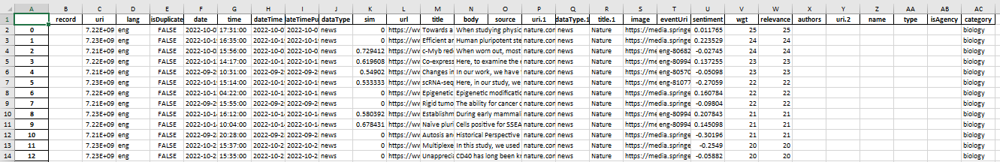

Now, the <b>X feature</b> is the column named 'body' which contains the full article body and is very long; the <b>Y target</b> is the column named 'category' which contains the name of the subject. 

---------------------------------

(Execute the cell below for each time operation. )

## Data Reading

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
file = r'combined.xlsx'
df = pd.read_excel(file)
df.head(3)

,Unnamed: 0,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,...,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency,category
0,0,NaN,7216495856,eng,False,2022-10-07,17:31:00,2022-10-07T17:31:00Z,2022-10-07T17:31:00Z,news,...,NaN,0.011765,25,25,NaN,NaN,NaN,NaN,NaN,biology
1,1,NaN,7231285056,eng,False,2022-10-19,16:35:00,2022-10-19T16:35:00Z,2022-10-19T16:34:00Z,news,...,NaN,0.223529,24,24,NaN,NaN,NaN,NaN,NaN,biology
2,2,NaN,7211002059,eng,False,2022-10-03,15:56:00,2022-10-03T15:56:00Z,2022-10-03T15:56:00Z,news,...,eng-8068287,-0.027451,24,24,NaN,NaN,NaN,NaN,NaN,biology


In [3]:
df.shape

(600, 29)

In [4]:
col_list = df.columns.values.tolist()
col_list  # Let's see these columns

['Unnamed: 0',
 'record',
 'uri',
 'lang',
 'isDuplicate',
 'date',
 'time',
 'dateTime',
 'dateTimePub',
 'dataType',
 'sim',
 'url',
 'title',
 'body',
 'source',
 'uri.1',
 'dataType.1',
 'title.1',
 'image',
 'eventUri',
 'sentiment',
 'wgt',
 'relevance',
 'authors',
 'uri.2',
 'name',
 'type',
 'isAgency',
 'category']

In [5]:
df['uri.1'].describe()  # let's see what sources are these articles from

count            600
unique             8
top       nature.com
freq             418
Name: uri.1, dtype: object

In [6]:
df['uri.1'].unique()  # the news sources

array(['nature.com', 'arstechnica.com', 'popsci.com',
       'theconversation.com', 'livescience.com', 'scientificamerican.com',
       'newscientist.com', 'seeddaily.com'], dtype=object)

Then, we should convert the categories into the data form which the machine can recognise. We can give a number for each category to represent it. 

In [7]:
tags = list(df.category.unique()) # have a look at the categories
print(tags)

['biology', 'chemistry', 'earth_sciences', 'math', 'physics', 'social_sciences']


In [8]:
index_to_tags_dict = {i:tag for i,tag in enumerate(tags)}
tags_to_index_dict = {tag:i for i,tag in enumerate(tags)}
print(index_to_tags_dict)
print(tags_to_index_dict)
# This cell of codes comes from https://www.kaggle.com/code/sanskar27jain/kernelb49fc09b70 [9]

{0: 'biology', 1: 'chemistry', 2: 'earth_sciences', 3: 'math', 4: 'physics', 5: 'social_sciences'}
{'biology': 0, 'chemistry': 1, 'earth_sciences': 2, 'math': 3, 'physics': 4, 'social_sciences': 5}


In [9]:
sci_categories_target_Y = [tags_to_index_dict[category] for category in df.category]
print(sci_categories_target_Y)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 

In [10]:
df.groupby('category').count()

,Unnamed: 0,record,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,...,image,eventUri,sentiment,wgt,relevance,authors,uri.2,name,type,isAgency
category,,,,,,,,,,,,,,,,,,,,,
biology,100,0,100,100,100,100,100,100,100,100,...,93,24,98,100,100,0,1,1,1,1
chemistry,100,0,100,100,100,100,100,100,100,100,...,95,24,100,100,100,0,8,8,8,8
earth_sciences,100,0,100,100,100,100,100,100,100,100,...,92,54,99,100,100,0,20,20,20,20
math,100,0,100,100,100,100,100,100,100,100,...,97,19,99,100,100,0,2,2,2,2
physics,100,0,100,100,100,100,100,100,100,100,...,97,45,100,100,100,0,9,9,9,9
social_sciences,100,0,100,100,100,100,100,100,100,100,...,88,28,98,100,100,0,3,3,3,3


In [11]:
sci_full_texts_X = []   # this variable is to store the full article content

In [12]:
def read_to_X(data_frame, col_name): 
    '''  To read the article body content into a variable to store. 
    Parameters: 
        data_frame - the 'df' here. 
        col_name - the name of the column for which I want to extract. 
    
    Returns: a list of strings. Each string is a long text which is just the specific article. 
    '''
    for each in data_frame.loc[:, col_name]: 
        sci_full_texts_X.append(each)
    return sci_full_texts_X


In [13]:
read_to_X(df, 'body')   # read the 'body' column

['When studying physical cellular response observed by light microscopy, variations in cell behavior are difficult to quantitatively measure and are often only discussed on a subjective level. Hence, cell properties are described qualitatively based on a researcher\'s impressions. In this study, we aim to define a comprehensive approach to estimate the physical cell activity based on migration and morphology based on statistical analysis of a cell population within a predefined field of view and timespan. We present quantitative measurements of the influence of drugs such as cytochalasin D and taxol on human neuroblastoma, SH-SY5Y cell populations. Both chemicals are well known to interact with the cytoskeleton and affect the cell morphology and motility. Being able to compute the physical properties of each cell for a given observation time, requires precise localization of each cell even when in an adhesive state, where cells are not visually differentiable. Also, the risk of confusi

In [14]:
sci_full_texts_X[4]  # check one of the texts

"In our work, we have focused on the undifferentiated SH-SY5Y cells because they are characterized by neuroblast-like, non-polarized cell morphology with few truncated neurite-like structures. Thus, we analyzed the nanomechanical properties of SH-SY5Y neuroblastoma cells exposed to oxygen and glucose deprivation, mimicking ischemic conditions. Following our previous studies on the effect of anti-tumor drugs on prostate cancer cells32, two indentations were applied, i.e., shallow (400 nm) and deep (1200 nm) ones. The shallow indentation reveals mechanical properties linked with actin filament organization, while the deep indentation may contain the additional contribution from deeper parts of the cells like the microtubular network and cell nucleus32,33. The studies were accompanied by evaluating the cofilin and phosphorylated cofilin expression levels, visualization of actin filaments organization quantified using morphometric parameters, and metabolic activity of SH-SY5Y cells subject

In [15]:
sci_string_X = [each for each in df.body] # the original text in string version stored in a list

In [16]:
sci_string_X[4]  # check the original text 

"In our work, we have focused on the undifferentiated SH-SY5Y cells because they are characterized by neuroblast-like, non-polarized cell morphology with few truncated neurite-like structures. Thus, we analyzed the nanomechanical properties of SH-SY5Y neuroblastoma cells exposed to oxygen and glucose deprivation, mimicking ischemic conditions. Following our previous studies on the effect of anti-tumor drugs on prostate cancer cells32, two indentations were applied, i.e., shallow (400 nm) and deep (1200 nm) ones. The shallow indentation reveals mechanical properties linked with actin filament organization, while the deep indentation may contain the additional contribution from deeper parts of the cells like the microtubular network and cell nucleus32,33. The studies were accompanied by evaluating the cofilin and phosphorylated cofilin expression levels, visualization of actin filaments organization quantified using morphometric parameters, and metabolic activity of SH-SY5Y cells subject

## Data pre-processing

Here, we will cleanse the text data. Because the data are from authoritative sources which are academic journal platforms, it is rather unlikely to find any mis-spelling in the text. Therefore, we can omit a huge process which is to correct the spellings. This is one of the advantages of my chosen field of data. 

During this stage, I also need to consider how to store my data in meaningful and handy data structures and data types, so that later when different models are requiring for different forms, I can feed them immediately. For example, the feature X can be arranged in one big list which contains 600 text strings; the feature X can also be arranged in one big list which contains 600 lists (each list is an article), in each there are word strings. Or, I can combine the feature X and the corresponding target Y together for an easier usage. 

### Remove unwanted characters

It should be very careful not to change the form of any important combinations, such as the abbreviations (e.g. I'm will still be I'm), and the plural forms, etc., since later on we will do lemmatisation and expand contractions which all depend on the original text. Now, we want to remove some unimportant characters, such as the '\r', the URL links, HTML tags, etc. 

In [17]:
sci_string_char_free_X = []  # create an empty list to store another version of the whole data

In [18]:
def remove_characters(text): 
    '''  Remove Unwanted Characters and Keep Punctuations that Indicate Stop of A Sentence
    
    Parameters: 
        A text string. 
    
    Returns: 
        The characters-removed version of this string. 
    '''
    import re
    text = re.sub(r'[\r\n]', ' ', text, flags=re.MULTILINE)  # delete \r and \n
    text = re.sub(r'https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    text = re.sub(r'\<a href', '', text)
    text = re.sub(r'&amp;', '', text) 
    text = re.sub(r'[_"\-;%()|+&=*%#$@\[\]/]', '', text)
    # I keep the commas and periods and all the other punctuations that may indicate a stop of sentence
    text = re.sub(r'<br />', '', text)
    text = re.sub(r'\\', '', text)  #delete \
    text = re.sub(r'``', '', text)  

    return text  

In [19]:
# remove unwanted characters in BBC_full_contraction_X and store the result into BBC_string_char_free_X
for each_string in sci_full_texts_X:   # this operation is fast
    a = remove_characters(each_string)
    sci_string_char_free_X.append(a)

In [20]:
sci_string_char_free_X[4]

"In our work, we have focused on the undifferentiated SHSY5Y cells because they are characterized by neuroblastlike, nonpolarized cell morphology with few truncated neuritelike structures. Thus, we analyzed the nanomechanical properties of SHSY5Y neuroblastoma cells exposed to oxygen and glucose deprivation, mimicking ischemic conditions. Following our previous studies on the effect of antitumor drugs on prostate cancer cells32, two indentations were applied, i.e., shallow 400 nm and deep 1200 nm ones. The shallow indentation reveals mechanical properties linked with actin filament organization, while the deep indentation may contain the additional contribution from deeper parts of the cells like the microtubular network and cell nucleus32,33. The studies were accompanied by evaluating the cofilin and phosphorylated cofilin expression levels, visualization of actin filaments organization quantified using morphometric parameters, and metabolic activity of SHSY5Y cells subjected to OGD. 

### Lowercase and expand contractions

Here, I have written a list of contractions and each of their full form in a dictionary. Later we will filter each word (continuous characters without any space inside), and replace any found contractions from my dictionary. The contractions are all in lowercase form, so we need to firstly convert all the uppercase letters into their lowercase form. During the lowercase process, the drawback is, it may lose some of the proper nouns which have different meanings from their lowercase forms. Luckily, we do not have many proper nouns which have this situation, and many jargons can be discerned just by their lowercase form. 

I have tried to expand contractions in my NLP midterm work, but that process failed to function. This time, I have ensured that the processes are all effective. The list of contractions are also updated. 

In [21]:
sci_full_contraction_X = [] # create an empty list to store the contraction-expanded version

In [22]:
# create a dictionary to store the contractions and their full versions. 
contractions = { 
"ain't": "am not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "iit will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}
# adapted from https://stackoverflow.com/questions/19790188/expanding-english-language-contractions-in-python

In [23]:
def expand_contractions(text_string): 
    '''  Expand the Contractions
    
    Parameters: 
        a word string
    
    Returns: 
        a long string of the expanded words
    '''
    new_text = []  # store the list of word strings
    char_list_single_word = []  # temporarily store each characters for one single word, in a list of strings
    single_word = ""
    for char in text_string:  # for each character in the input list      
        if not char.isspace():   # within this single_word, then read this word till the end
            char_list_single_word.append(char)
           
        else:     # the character is space, then processing, and begin the next single_word
            single_word = "".join(char_list_single_word).strip()  # join each character to form this word
            single_word_lower = single_word.lower()     # lowercase
            if single_word_lower in contractions:  # if it is one of the contractions
                new_text.append(contractions[single_word_lower]) # then just append the full version
            else:   # for other words
                new_text.append(single_word_lower)  # just append this word

            single_word = ""  # re-initialise
            char_list_single_word = []   # re-initialise
          
    # use space to join these words, and then delete spaces at beginning and the end: 
    text = " ".join(new_text).strip()  
    return text

In [24]:
for list_ele in sci_string_char_free_X: # iterate the 600 sublists
#     for word_string in list_ele: 
    new_txt = []  # empty this for each iteration
    new_txt = expand_contractions(list_ele) # expand contractions for each of the 600 news
    sci_full_contraction_X.append(new_txt) # store it into this new variable
# finally each sci_full_contraction_X contains just a long string. 

Let's check one of our data. It should not contain any contractions now. 

In [25]:
sci_full_contraction_X[4]

"in our work, we have focused on the undifferentiated shsy5y cells because they are characterized by neuroblastlike, nonpolarized cell morphology with few truncated neuritelike structures. thus, we analyzed the nanomechanical properties of shsy5y neuroblastoma cells exposed to oxygen and glucose deprivation, mimicking ischemic conditions. following our previous studies on the effect of antitumor drugs on prostate cancer cells32, two indentations were applied, i.e., shallow 400 nm and deep 1200 nm ones. the shallow indentation reveals mechanical properties linked with actin filament organization, while the deep indentation may contain the additional contribution from deeper parts of the cells like the microtubular network and cell nucleus32,33. the studies were accompanied by evaluating the cofilin and phosphorylated cofilin expression levels, visualization of actin filaments organization quantified using morphometric parameters, and metabolic activity of shsy5y cells subjected to ogd. 

### Remove stopwords & lemmatisation

Stopwords are the words with no meaning or only very limited meaning which are used pervasively, such as 'a', 'the', 'I', etc. These words in our sample are a distraction from the real meaningful core words, and they are a source of bias which should be cleaned. 

In English, there are many forms for one word, for which we need stemming or lemmatisation to recover their original form. Stemming is not as useful as lemmatisation, in that stemming is a mechanical process that perhaps will get some unexisting words, such as 'computing -> comput', but lemmatisation is based on a large dictionary edited by human. 

Here, I use PorterStemmer and WordNetLemmatizer. 

In [26]:
import nltk
from nltk.corpus import stopwords
from nltk import wordnet

In [27]:
import string

from nltk.stem import PorterStemmer, WordNetLemmatizer # the stemming and lemmatizing libraries
from nltk import wordnet  # wordnet is a must when using stemmers and lemmatizers


In [28]:
stop_words = set(stopwords.words('english')) # set the stopwords we use as English
stemmer = PorterStemmer()  # we do not use stemmers for now
wnl = WordNetLemmatizer()  # we use lemmatizer since it's very useful

In [29]:
def stopword_lemmatizing(word_list): 
    ''' Remove Stopwords, Punctuations, and also Lemmatize the Original Input
        I will do two steps of lemmatization - the verb version, and the noun version. 
        
    Parameters: 
        A list which contains many word strings. 
    
    Returns: 
        The stopwords-removed and lemmatized version of this list, also containing word strings. 
    '''
    result = []
    # Below order is important! We should always firstly remove stopwords. 
    # Otherwise, stopwords would change their form! 
    
    for word in word_list:  # for each string in the list
        word = word.lower()  # to get the lower form of each word
        if not word in stop_words:   # to remove stop words. 
            if not word in string.punctuation:  # Notice: here we remove punctuations!!!
                word_n = wnl.lemmatize(word, pos='n')  # to lemmatize all nouns
                word_v = wnl.lemmatize(word_n, pos='v')  # to lemmatize all verbs
        
                result.append(word_v)

    return result

In [30]:
sci_X_regularised = []  # A list of 600 lists of word strings that have done these processes: 
# cleaning redundant characters, removing stopwords, removing punctuations, lemmatization.

Since I have run these codes in my local computer, I have to manually import https://github.com/nltk/nltk_data/tree/gh-pages/packages these packages into the folder C:\Python\Python38\Lib\nltk_data. I have unzip the zip files which I have downloaded, and put them in that folder. Then, I can use them. 

In [31]:
# take a while
# still a conversion of data type
for each_string in sci_full_contraction_X: # we process the regularisation
    storage = nltk.word_tokenize(each_string) # tokenize each file
    x = stopword_lemmatizing(storage)  # call the function to remove stopwords and to lemmatize
    sci_X_regularised.append(x)

In [32]:
sci_X_regularised[4]   # have a check

['work',
 'focus',
 'undifferentiated',
 'shsy5y',
 'cell',
 'characterize',
 'neuroblastlike',
 'nonpolarized',
 'cell',
 'morphology',
 'truncate',
 'neuritelike',
 'structure',
 'thus',
 'analyze',
 'nanomechanical',
 'property',
 'shsy5y',
 'neuroblastoma',
 'cell',
 'expose',
 'oxygen',
 'glucose',
 'deprivation',
 'mimic',
 'ischemic',
 'condition',
 'follow',
 'previous',
 'study',
 'effect',
 'antitumor',
 'drug',
 'prostate',
 'cancer',
 'cells32',
 'two',
 'indentation',
 'apply',
 'i.e.',
 'shallow',
 '400',
 'nm',
 'deep',
 '1200',
 'nm',
 'one',
 'shallow',
 'indentation',
 'reveal',
 'mechanical',
 'property',
 'link',
 'actin',
 'filament',
 'organization',
 'deep',
 'indentation',
 'may',
 'contain',
 'additional',
 'contribution',
 'deeper',
 'part',
 'cell',
 'like',
 'microtubular',
 'network',
 'cell',
 'nucleus32,33',
 'study',
 'accompany',
 'evaluate',
 'cofilin',
 'phosphorylated',
 'cofilin',
 'expression',
 'level',
 'visualization',
 'actin',
 'filament',
 'o

In [33]:
# create a new empty list to store the concatenated big strings
sci_X_regularised_united = []

In [34]:
# still a conversion of data type
# Use join() method to concatenate small strings into one string: 
for item in sci_X_regularised: # each item is a list of strings
    result = ''  # start from empty
    for word in item:   # for each word string
        result = ' '.join([result, word]) # use space to join each
    concat = ''.join(result).strip()  # delete spaces at beginning and end of this slice
    sci_X_regularised_united.append(concat)

In [35]:
sci_X_regularised_united[4]

"work focus undifferentiated shsy5y cell characterize neuroblastlike nonpolarized cell morphology truncate neuritelike structure thus analyze nanomechanical property shsy5y neuroblastoma cell expose oxygen glucose deprivation mimic ischemic condition follow previous study effect antitumor drug prostate cancer cells32 two indentation apply i.e. shallow 400 nm deep 1200 nm one shallow indentation reveal mechanical property link actin filament organization deep indentation may contain additional contribution deeper part cell like microtubular network cell nucleus32,33 study accompany evaluate cofilin phosphorylated cofilin expression level visualization actin filament organization quantify use morphometric parameter metabolic activity shsy5y cell subject ogd measurement conduct directly ogd study magnitude induce change 24 h reoxygenation model reperfusion evaluate reversibility change ass effect ogd exposure 5 co 0.1 neuroblastoma shsy5y cell expose cell ogd 1 3 12 h follow 24 hro fig 1.

From the data above, we see that after deleting stopwords and lemmatisation, the text sample looks more meaningful, more dense, and each word is in its basic form. 

### Store X and Y Data Together

Since later we might retrieve the corresponding target Y from any feature X, it is necessary to build a data structure to store each X and Y binded together. 

In [36]:
sci_cleaned_combine = [] # use a list to store all the X and all the corresponding Y

In [37]:
for i in range(len(sci_X_regularised_united)):    # for each long text string
    temp = []
    temp.append(sci_X_regularised_united[i])
    temp.append(sci_categories_target_Y[i])
    sci_cleaned_combine.append(temp)
        

In [38]:
sci_cleaned_combine[8][0]   # check

'early mammalian embryonic development trophoblast cell play essential role establish cellcell interaction maternalfetal interface ensure successful pregnancy recent study show human fibroblast reprogrammed induce trophoblast stem cell transcription factormediated nuclear reprogramming use yamanaka factor oct4 klf4 sox2 cmyc oksm selection t cell culture condition derivation t cell human blastocyst firsttrimester placenta limit difficulty obtain adequate material well ethical implication contrast describe approach allow generation cell adult cell individual diverse genetic background readily accessible many laboratory around world describe stepbystep protocol generation establishment human cell directly dermal fibroblast use nonintegrative reprogramming method protocol consist four main section 1 recovery cryopreserved human dermal fibroblast 2 somatic cell reprogramming 3 passaging reprogramming intermediate 4 derivation cell culture follow routine maintenance cell cell line establish

Now, sci_cleaned_combine[0] to sci_cleaned_combine[99] are with y label of 0; 

sci_cleaned_combine[100] to sci_cleaned_combine[199] are with y label of 1; ... 

A summary for all the variables till now: 

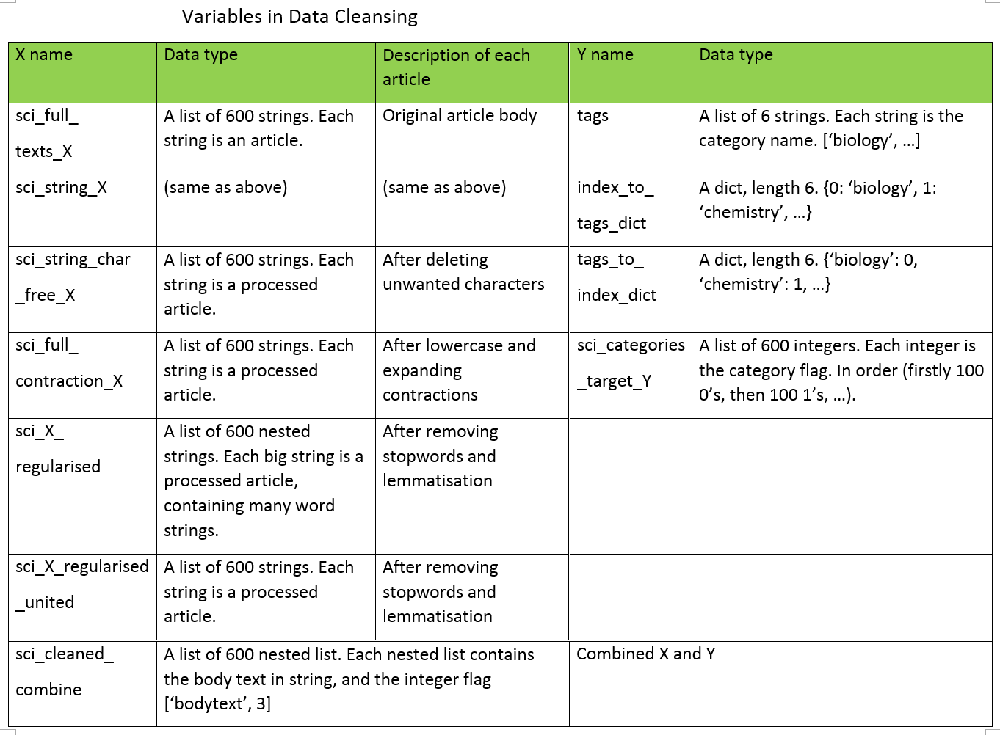


(Stop executing repeatedly now. )

## Output Data Into Files

Now that we have cleansed our original data, it is better to save the cleansed data into files, just to keep a record, in case later we want to retrieve these data.  

In [39]:
import os
my_roots = "C:/Users/Administrator/.fastai/data/journal_articles"     # you may change this root if you want to re-run the codes
# my_roots = "D:/journal_articles"

def create_text(roots): 
    ''' Create Empty Files and Output Data into Files
    
    Parameters: -
    Returns: -    
    '''
    
    for m in range(len(sci_cleaned_combine)):    # from 0 to 599
        m_str = str(m)   # the string version of the x id
        x_id = m_str.zfill(3)  # the 3-digits version of the string m, still a string
        sci_cleaned_combine[m][0]
        
        if m>=0 and m<100:      # the first category, y = 0
            with open(roots + "/0/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x
        elif m>=100 and m<200:  # y = 1
            with open(roots + "/1/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x
        elif m>=200 and m<300: 
            with open(roots + "/2/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x
        elif m>=300 and m<400: 
            with open(roots + "/3/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x
        elif m>=400 and m<500: 
            with open(roots + "/4/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x
        elif m>=500 and m<600: 
            with open(roots + "/5/" + "%s.txt"%(str(x_id)), "w", encoding='gb18030', errors='ignore') as file: 
                file.write(sci_cleaned_combine[m][0])     # write in the x


In [47]:
create_text(my_roots)

Now I have saved my data into files listed in folders with name from '0' to '5': 
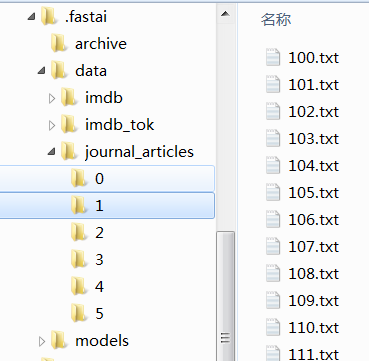

--------------------

# Train-Test Splitting

To utilise any of the collected dataset fully, we split the whole dataset into sections, to prevent from information leakage, and overfitting. 

We use the test set to train our models; use the validation set to tune hyperparameters; and use the test set to get the performance outcome for our final model. The validation set can be used for many times; usually we only use the test set for once. The test set functions as the unknown data - remind that, the goal for the entire machine learning is to get a generalisation for any of our models on the unseen data. 

First, we need to settle down the random seeds. 

In [39]:
import tensorflow as tf

In [40]:
# Set the random seeds, to prevent from different results when each time running, and to control one 
# of the variables. 
import random
random.seed(15)
np.random.seed(15)
tf.random.set_seed(15)

Then, use the Sci-Kit Learn train_test_split function to split our dataset. First, we separate the rest of the set, and the test set; then, for the rest of the set, we separate training set and validation set. 

We need to do these steps on both the original data, and the cleansed data. 

In [41]:
from sklearn.model_selection import train_test_split

In [42]:
# train:test ratio = 8:2. 
# Original string version sci_string_X, which is not lemmatized or removed stopwords
# sci_string_X data type: A list of 600 long strings
X_train_pre, X_test_pre, Y_train_pre, Y_test_pre = train_test_split(
    sci_string_X, sci_categories_target_Y, test_size=0.20, random_state=15)
# We set the random state in order to repeat the experiment later. 

In [43]:
len(X_train_pre)

480

In [44]:
# Regularised version of X, which is lemmatized and removed stopwords and characters
# sci_X_regularised_united data type: A list of 600 long strings
X_train_pre2, X_test_pre2, Y_train_pre2, Y_test_pre2 = train_test_split(
    sci_X_regularised_united, sci_categories_target_Y, test_size=0.20, random_state=15)

In [45]:
Y_train_pre2[70:80] # we see now the Y targets are represented by numerical flags. 

[0, 4, 0, 1, 0, 2, 1, 3, 2, 4]

# Neural Network Data Processing

## Feed Data to Keras (Chollet Step 4)

Now, we have our cleansed text data. However, Keras the library to build neural networks only accept numerical data, and this feature is determined by the tensors it uses. Hence, we should transform our text data into its numerical form. 

Besides, for the target Y, Keras asks for its one-hot form, which means that, the Y with value 2 will look like [0, 0, 1, 0, 0, 0], with only the 2'th place of number 1, and the other five category places of number 0. 

### Original Data

In [46]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import LabelBinarizer, LabelEncoder

In [47]:
# Below codes are from https://github.com/codehax41/BBC-Text-Classification/blob/master/BBC%20using%20Keras.ipynb [7]
num_words_input = 600 # We should set the max number of crucial words to be identified. 
# Notice that Keras does not input all of the texts. It only uses important words. 
tok = keras.preprocessing.text.Tokenizer(num_words=num_words_input, 
                                              lower=True,   # convert to lowercase
                                              char_level=False)
# The above process will filter default punctuations. 

tok.fit_on_texts(X_train_pre) # fit tokenizer to our training text data

X_train = tok.texts_to_matrix(X_train_pre)
X_test = tok.texts_to_matrix(X_test_pre)

In [48]:
np.shape(X_train[78])

(600,)

In [49]:
tok.word_index

{'the': 1,
 'of': 2,
 'and': 3,
 'in': 4,
 'to': 5,
 'a': 6,
 'for': 7,
 'is': 8,
 'with': 9,
 'that': 10,
 'as': 11,
 'by': 12,
 'were': 13,
 'cells': 14,
 'was': 15,
 'we': 16,
 'are': 17,
 'on': 18,
 'this': 19,
 'from': 20,
 'at': 21,
 'cell': 22,
 'be': 23,
 'fig': 24,
 'or': 25,
 'which': 26,
 'an': 27,
 '1': 28,
 'it': 29,
 'data': 30,
 'have': 31,
 'can': 32,
 'these': 33,
 'using': 34,
 'not': 35,
 't': 36,
 '2': 37,
 'also': 38,
 'more': 39,
 'has': 40,
 'between': 41,
 'used': 42,
 'their': 43,
 'time': 44,
 'all': 45,
 'two': 46,
 '0': 47,
 'study': 48,
 'our': 49,
 'but': 50,
 'such': 51,
 'one': 52,
 'i': 53,
 'been': 54,
 'each': 55,
 'into': 56,
 '3': 57,
 'other': 58,
 'model': 59,
 'than': 60,
 'different': 61,
 '5': 62,
 'they': 63,
 'analysis': 64,
 'quantum': 65,
 'after': 66,
 'based': 67,
 'expression': 68,
 'number': 69,
 'then': 70,
 'results': 71,
 'its': 72,
 '4': 73,
 'when': 74,
 'supplementary': 75,
 'high': 76,
 'only': 77,
 'well': 78,
 'both': 79,
 'fir

In [50]:
# This cell of codes is from: https://github.com/codehax41/BBC-Text-Classification/blob/master/BBC%20using%20Keras.ipynb [7]
#Use sklearn utility to convert label strings to numbered index
encoder = LabelEncoder()
encoder.fit(Y_train_pre)
Y_train = encoder.transform(Y_train_pre)
Y_test = encoder.transform(Y_test_pre)
# Converts the labels to a one-hot representation
num_classes = np.max(Y_train) + 1
Y_train = keras.utils.to_categorical(Y_train, num_classes)
Y_test = keras.utils.to_categorical(Y_test, num_classes)

In [51]:
Y_train[300]  # check. It should be a one-hot encoding array

array([0., 0., 0., 1., 0., 0.], dtype=float32)

In [52]:
train_num = len(Y_train)
train_num

480

In [53]:
np.shape(X_train)  # the shape of X_train, is 480 samples, each containing 600 keywords

(480, 600)

In [54]:
np.shape(Y_train) # the shape of Y_train, is 480 target flags, each is a one-hot array

(480, 6)

### Cleansed Data

In [55]:
# Below codes are from https://github.com/codehax41/BBC-Text-Classification/blob/master/BBC%20using%20Keras.ipynb [7]

# Notice that Keras does not input all of the texts. It only uses important words. 
tok2 = keras.preprocessing.text.Tokenizer(num_words=num_words_input, 
                                              lower=True,   # convert to lowercase
                                              char_level=False)
# The above process will filter default punctuations. 

tok2.fit_on_texts(X_train_pre2) # fit tokenizer to our training text data

X_train2 = tok2.texts_to_matrix(X_train_pre2)
X_test2 = tok2.texts_to_matrix(X_test_pre2)

In [56]:
tok2.word_index

{'cell': 1,
 'use': 2,
 'fig': 3,
 '1': 4,
 'study': 5,
 'data': 6,
 'model': 7,
 '0': 8,
 'also': 9,
 'show': 10,
 "'s": 11,
 'result': 12,
 'time': 13,
 '2': 14,
 'state': 15,
 'one': 16,
 'find': 17,
 '5': 18,
 'two': 19,
 'group': 20,
 'system': 21,
 'sample': 22,
 'number': 23,
 'method': 24,
 'increase': 25,
 'include': 26,
 'different': 27,
 '3': 28,
 'quantum': 29,
 'analysis': 30,
 'process': 31,
 'change': 32,
 'structure': 33,
 '10': 34,
 '4': 35,
 'level': 36,
 'expression': 37,
 'effect': 38,
 'supplementary': 39,
 'population': 40,
 'gene': 41,
 'work': 42,
 'research': 43,
 'however': 44,
 'human': 45,
 'could': 46,
 'provide': 47,
 'first': 48,
 'may': 49,
 'al': 50,
 'function': 51,
 'set': 52,
 'follow': 53,
 'year': 54,
 'new': 55,
 'perform': 56,
 'protein': 57,
 'make': 58,
 'compare': 59,
 'phase': 60,
 'control': 61,
 'signal': 62,
 'value': 63,
 'type': 64,
 'flow': 65,
 'see': 66,
 'e': 67,
 'observe': 68,
 'test': 69,
 'base': 70,
 'et': 71,
 'b': 72,
 'sugges

In [57]:
# This cell of codes is from: https://github.com/codehax41/BBC-Text-Classification/blob/master/BBC%20using%20Keras.ipynb [7] 
#Use sklearn utility to convert label strings to numbered index
encoder = LabelEncoder()
encoder.fit(Y_train_pre2)
Y_train2 = encoder.transform(Y_train_pre2)
Y_test2 = encoder.transform(Y_test_pre2)
# Converts the labels to a one-hot representation
num_classes2 = np.max(Y_train2) + 1
Y_train2 = keras.utils.to_categorical(Y_train2, num_classes)
Y_test2 = keras.utils.to_categorical(Y_test2, num_classes)

In [58]:
len(Y_test2)

120

In [59]:
type(X_train2)

numpy.ndarray

In [60]:
X_train2[56]  # check one, it should have 600 one-hot flags representing 600 keywords for that article

array([0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 1., 1., 1., 1.,
       0., 1., 1., 1., 0., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 0.,
       0., 1., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 1., 1., 1., 1., 0.,
       0., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 1., 0.,
       1., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 1., 1.,
       1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1.,
       1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 1.,
       0., 1., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0., 1., 1.,
       1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 1., 1., 0., 0.

In [61]:
type(Y_train2)

numpy.ndarray

In [62]:
Y_train2[56] # check one

array([1., 0., 0., 0., 0., 0.], dtype=float32)

In [63]:
from tensorflow.keras import models
from tensorflow.keras import layers

In [64]:
import matplotlib.pyplot as plt

A summary for the variables till now: 

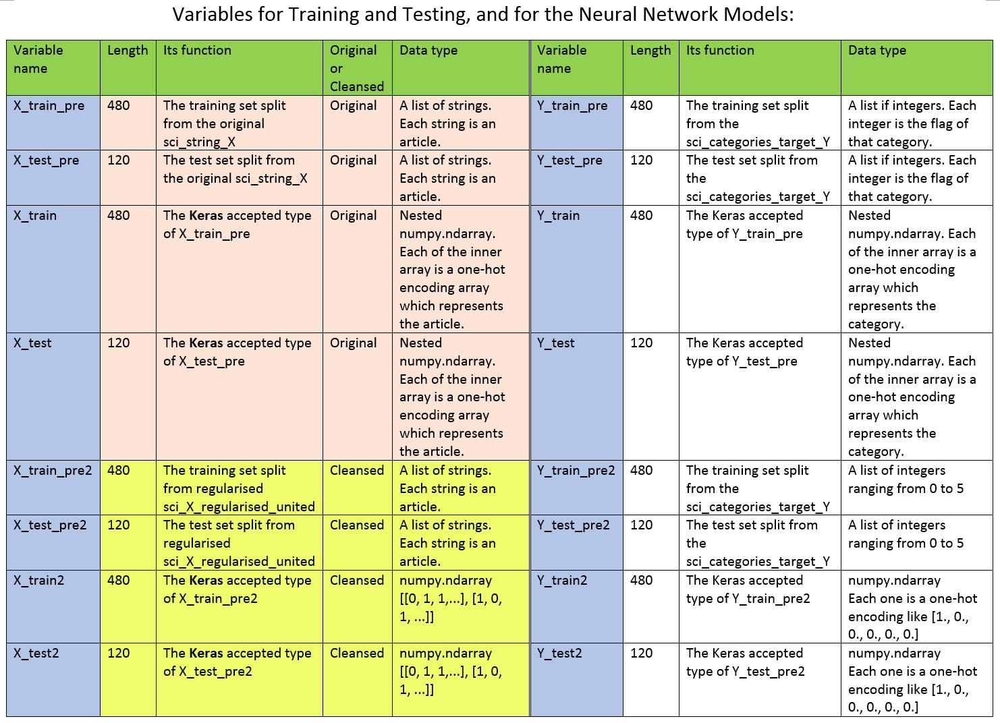

### Helper Function: ROC

In [65]:
# Helper function: 

# ROC Curve on multi-class classification: 
# Source: https://blog.csdn.net/xyz1584172808/article/details/81839230  by 闰土不用叉 [1]

import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

def draw_ROC(n_classes, Y_test2, Y_pred2): 
    '''   Draw the ROC and AUC for multi-class classification
    
    Parameters: 
      n_classes - an integer, how many categories in your classification
      Y_test2 - one-hot encoding for each entry, the test data of the target Y
      Y_pred2 - one-hot encoding for each entry, the predicted data for the target Y based on X_test2 and the model
    
    Returns: 
      None. Will display a plot containing the ROC curves for each of the category, and the avg ROC curves, and show AUC 
    '''
    
    if not n_classes==Y_test2.shape[1]: 
        print("Error in number of classes! ")
    else: 

        # Calculate the ROC for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(Y_test2[:, i], Y_pred2[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Compute micro-average ROC curve and ROC area (Method 2)
        fpr["micro"], tpr["micro"], _ = roc_curve(Y_test2.ravel(), Y_pred2.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        # Compute macro-average ROC curve and ROC area (Method 1)
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        # Plot all ROC curves
        lw=2
        plt.figure()
        plt.plot(fpr["micro"], tpr["micro"],
                 label='micro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["micro"]),
                 color='deeppink', linestyle=':', linewidth=4)

        plt.plot(fpr["macro"], tpr["macro"],
                 label='macro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["macro"]),
                 color='navy', linestyle=':', linewidth=4)

        colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                     label='ROC curve of class {0} (area = {1:0.2f})'
                     ''.format(i, roc_auc[i]))

        plt.plot([0, 1], [0, 1], 'k--', lw=lw)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Some extension of Receiver operating characteristic to multi-class')
        plt.legend(loc="lower right")
        plt.show()


# Feed-Forward Neural Network (FNN) Models

## Test the Data on A Small Model (Chollet Step 5)

In [82]:

from tensorflow.keras import models
from tensorflow.keras import layers

model_small = models.Sequential()
model_small.add(layers.Dense(16, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_small.add(layers.Dense(16, activation = 'relu'))
model_small.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_small.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

In [83]:
# train-validation splitting
# now the X_train_partial2 is the actual traning set, because our previous X_train2 is the combination of train and validation
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_small = model_small.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=64,
                    epochs=8,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))

Epoch 1/8
6/6 [==============================] - 1s 68ms/step - loss: 1.7867 - accuracy: 0.1875 - val_loss: 1.7098 - val_accuracy: 0.2708
Epoch 2/8
6/6 [==============================] - 0s 10ms/step - loss: 1.6607 - accuracy: 0.3151 - val_loss: 1.6419 - val_accuracy: 0.3333
Epoch 3/8
6/6 [==============================] - 0s 11ms/step - loss: 1.5810 - accuracy: 0.3984 - val_loss: 1.5702 - val_accuracy: 0.4167
Epoch 4/8
6/6 [==============================] - 0s 10ms/step - loss: 1.4939 - accuracy: 0.4870 - val_loss: 1.4933 - val_accuracy: 0.4583
Epoch 5/8
6/6 [==============================] - 0s 10ms/step - loss: 1.4084 - accuracy: 0.5286 - val_loss: 1.4451 - val_accuracy: 0.5000
Epoch 6/8
6/6 [==============================] - 0s 10ms/step - loss: 1.3210 - accuracy: 0.5911 - val_loss: 1.3912 - val_accuracy: 0.5208
Epoch 7/8
6/6 [==============================] - 0s 11ms/step - loss: 1.2426 - accuracy: 0.6432 - val_loss: 1.3319 - val_accuracy: 0.5208
Epoch 8/8
6/6 [===================

In [84]:
history_dict = history_small.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [154]:
import matplotlib.pyplot as plt

def draw_train_val_loss_plot(history):
    '''  Draw the train-validation loss curves
    
    Parameters: 
      history - the 'history' variable to fit the model. 
    
    Returns: 
      A plot. 
      
    '''
    history_dict = history.history
    
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']

    epochs = range(1, len(loss) + 1)

    blue_dots = 'bo'
    solid_blue_line = 'b'

    plt.plot(epochs, loss, blue_dots, label = 'Training loss')
    plt.plot(epochs, val_loss, solid_blue_line, label = 'Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()


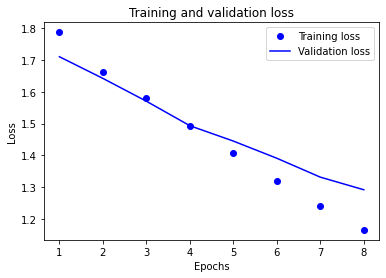

In [86]:
draw_train_val_loss_plot(history_small)

It is obviously an underfitting model, because the validation loss is going down forever, not yet meeting any fluctuations. 

In [155]:
def draw_train_val_acc(history): 
    '''  Draw the train-validation accuracies curves
    
    Parameters: 
      history - the 'history' variable to fit the model. 
    
    Returns: 
      A plot. 
       
    '''
    plt.clf() # clear the previous plot
    
    history_dict = history.history

    acc = history_dict['accuracy']
    val_acc = history_dict['val_accuracy']

    epochs = range(1, len(acc) + 1)

    blue_dots = 'bo'
    solid_blue_line = 'b'

    plt.plot(epochs, acc, blue_dots, label = 'Training acc')
    plt.plot(epochs, val_acc, solid_blue_line, label = 'Validation acc')
    plt.title('Training and validation acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

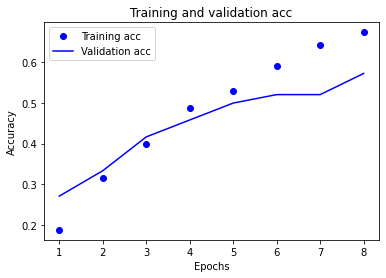

In [88]:
draw_train_val_acc(history_small)

We see the validation accuracy through epochs is still going up, and it seems that at the next epochs, it can still go higher. Thus, it still has space to improve, and we must give it a bigger epoch number to train it enough. 

In [89]:
# see the performance in the test set: 
results_small = model_small.evaluate(X_test2, Y_test2)
results_small

4/4 [==============================] - 0s 2ms/step - loss: 1.3714 - accuracy: 0.5000


[1.3714357614517212, 0.5]

In [90]:
pred = model_small.predict(X_test2)  # Let's get the predicted labels. 

4/4 [==============================] - 0s 2ms/step


In [91]:
pred_labels = np.argmax(pred, axis = 1)  # these are the predicted labels for the test set. 

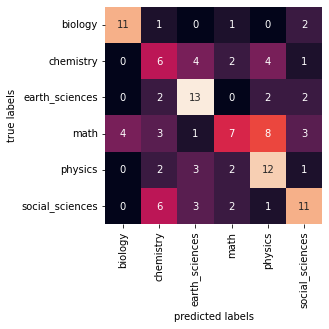

In [92]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_small = confusion_matrix(Y_test2.argmax(axis=1), pred_labels)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_small, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

Intuitively, this heatmap contains scattered colours, instead of gathered colours at the diagnal line. Thus, we deem it as a not-good model at our first glance. Then, we find that although there are mistakes, the mistake in each category is not big. Biology category performs the best, no matter from the column or from the row. 

In [93]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.73      0.73      0.73        15
      chemistry       0.30      0.35      0.32        17
 earth_sciences       0.54      0.68      0.60        19
           math       0.50      0.27      0.35        26
        physics       0.44      0.60      0.51        20
social_sciences       0.55      0.48      0.51        23

       accuracy                           0.50       120
      macro avg       0.51      0.52      0.51       120
   weighted avg       0.51      0.50      0.49       120



(Oct 25) 
- We have already beaten the very basic baseline which should be 1/6 = 0.16667 with the precision/recall/F1 score of 0.5 of this small neural network. 

- We see that the recall scores for earth_sciences and social_sciences are really high, with over 0.8, which means that from all of our dataset, our previously written classifier can collect as complete as possible for these two categories. 

- For chemistry, as what I have predicted, it should be difficult to be discerned from biology. Thus, it has a low recall score, which means that from all of our dataset, our classifier can hardly collect all of the chemistry data. 

- It is a surprise for me that math also gets a low recall score, which means it cannot be fully collected. 

## Developing A Model that Overfits (Chollet Step 6)

In [67]:

from tensorflow.keras import models
from tensorflow.keras import layers

model_overfit = models.Sequential()
model_overfit.add(layers.Dense(16, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_overfit.add(layers.Dense(128, activation = 'relu'))
model_overfit.add(layers.Dense(256, activation = 'relu'))
model_overfit.add(layers.Dense(256, activation = 'relu'))
model_overfit.add(layers.Dense(16, activation = 'relu'))
model_overfit.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_overfit.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

In [72]:
# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_overfit = model_overfit.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=64,
                    epochs=200,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))

Epoch 1/200
6/6 [==============================] - 0s 20ms/step - loss: 0.0390 - accuracy: 0.9740 - val_loss: 3.8653 - val_accuracy: 0.5729
Epoch 2/200
6/6 [==============================] - 0s 12ms/step - loss: 0.0389 - accuracy: 0.9661 - val_loss: 3.9605 - val_accuracy: 0.5729
Epoch 3/200
6/6 [==============================] - 0s 12ms/step - loss: 0.0396 - accuracy: 0.9688 - val_loss: 4.0371 - val_accuracy: 0.5833
Epoch 4/200
6/6 [==============================] - 0s 11ms/step - loss: 0.0398 - accuracy: 0.9609 - val_loss: 4.1201 - val_accuracy: 0.5833
Epoch 5/200
6/6 [==============================] - 0s 11ms/step - loss: 0.0389 - accuracy: 0.9635 - val_loss: 4.1309 - val_accuracy: 0.5729
Epoch 6/200
6/6 [==============================] - 0s 13ms/step - loss: 0.0407 - accuracy: 0.9557 - val_loss: 4.2780 - val_accuracy: 0.5729
Epoch 7/200
6/6 [==============================] - 0s 13ms/step - loss: 0.0399 - accuracy: 0.9688 - val_loss: 4.1966 - val_accuracy: 0.5625
Epoch 8/200
6/6 [===

6/6 [==============================] - 0s 17ms/step - loss: 0.0392 - accuracy: 0.9714 - val_loss: 6.6982 - val_accuracy: 0.5729
Epoch 118/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0386 - accuracy: 0.9635 - val_loss: 6.7967 - val_accuracy: 0.5625
Epoch 119/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0388 - accuracy: 0.9714 - val_loss: 6.7655 - val_accuracy: 0.5729
Epoch 120/200
6/6 [==============================] - 0s 11ms/step - loss: 0.0389 - accuracy: 0.9635 - val_loss: 6.6478 - val_accuracy: 0.5729
Epoch 121/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0390 - accuracy: 0.9661 - val_loss: 6.9451 - val_accuracy: 0.5729
Epoch 122/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0386 - accuracy: 0.9635 - val_loss: 7.3931 - val_accuracy: 0.5833
Epoch 123/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0406 - accuracy: 0.9661 - val_loss: 6.4873 - val_accuracy: 0.5625
Epoch 124/200
6/6 [=

Epoch 175/200
6/6 [==============================] - 0s 11ms/step - loss: 0.0558 - accuracy: 0.9661 - val_loss: 8.4904 - val_accuracy: 0.5729
Epoch 176/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0387 - accuracy: 0.9635 - val_loss: 9.4364 - val_accuracy: 0.5729
Epoch 177/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0389 - accuracy: 0.9661 - val_loss: 8.5215 - val_accuracy: 0.5938
Epoch 178/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0416 - accuracy: 0.9661 - val_loss: 10.2776 - val_accuracy: 0.5521
Epoch 179/200
6/6 [==============================] - 0s 10ms/step - loss: 0.0687 - accuracy: 0.9609 - val_loss: 10.1772 - val_accuracy: 0.5938
Epoch 180/200
6/6 [==============================] - 0s 9ms/step - loss: 0.0399 - accuracy: 0.9688 - val_loss: 10.1698 - val_accuracy: 0.5312
Epoch 181/200
6/6 [==============================] - 0s 11ms/step - loss: 0.0385 - accuracy: 0.9714 - val_loss: 8.0056 - val_accuracy: 0.6250
Epoc

In [73]:
history_dict = history_overfit.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

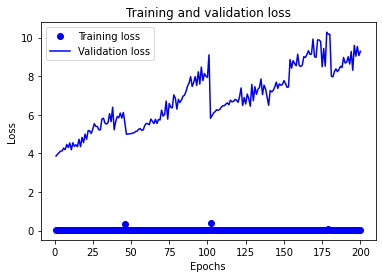

In [74]:
draw_train_val_loss_plot(history_overfit)

This plot represents a very typical overfitting model. The loss are supposed to decrease as training, but it goes higher and higher in the big trend, though with some sudden drops-down. To deal with overfitting, we must zoom it and just choose one small part of it, when it just goes down. We must take a smaller epoch number. 

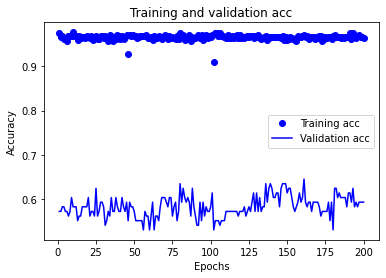

In [76]:
draw_train_val_acc(history_overfit)

The validation accuracy is shifting and fluctuating, never with a trend. To prevent from overfitting, we must choose the epoch where the accuracy is rather high and on the next epoch number, it will drop down. Also notice that the traning accuracy is always higher than the validation accuracy. 

In [77]:
# see the performance in the test set: 
results_overfit = model_overfit.evaluate(X_test2, Y_test2)
results_overfit

4/4 [==============================] - 0s 2ms/step - loss: 7.7050 - accuracy: 0.6083


[7.705035209655762, 0.6083333492279053]

In [79]:
pred_overfit = model_overfit.predict(X_test2)  # Let's get the predicted labels. 
pred_labels_overfit = np.argmax(pred_overfit, axis = 1)  # these are the predicted labels for the test set. 

4/4 [==============================] - 0s 2ms/step


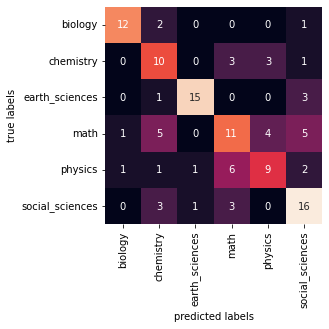

In [80]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_overfit = confusion_matrix(Y_test2.argmax(axis=1), pred_labels_overfit)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_overfit, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

This heatmap shows a rather acceptable result - the colours are gathered at the diagnal line. Biology category and Earth sciences category are classified the most correctly. We still have cases where they are mis-classified as math. 

In [81]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels_overfit, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.86      0.80      0.83        15
      chemistry       0.45      0.59      0.51        17
 earth_sciences       0.88      0.79      0.83        19
           math       0.48      0.42      0.45        26
        physics       0.56      0.45      0.50        20
social_sciences       0.57      0.70      0.63        23

       accuracy                           0.61       120
      macro avg       0.63      0.62      0.63       120
   weighted avg       0.62      0.61      0.61       120



Although this is just a simple overfitting model, we have already got the accuracy of 0.61 which is much higher than the commonsense baseline 0.167. It is a good start for later tuning hyperparameters. 

## Controlled Experiments & Hyperparameter Discussions (Chollet Step 7)

### Controlled experiment - batch size

Batch size is the number of samples that will be sent to the neural network model for training each time. We usually take the powers of 2 for the batch size, such as 64, 128, etc. 

Someone in CSDN Forum says that with a larger batch size, it can improve memory utilization and parallelization efficiency of large matrix multiplication; the number of iterations required to run an epoch (full data set) is reduced, and the processing speed is faster than a small Batch_size for the same amount of data; within a certain range, generally speaking, the larger the Batch_size, the more accurate the direction of descent determined, and the smaller the training shock caused [13]. However, a large batch size improves memory utilization, but the memory capacity may not hold up; the number of iterations required to run an epoch becomes smaller, but to achieve the same accuracy, the time it takes is greatly increased, thus affecting the parameters, and the correction also appears to be slower; the batch size increases to a certain extent, and its determined downward direction has basically no longer changed [13]. 



In [83]:
# control experiment for the batch size 
def exp_batch_size(input_batch_size, words, neuron, activation, random_state): 
    '''  Controlled Experiment - Batch size
    
    Parameters: 
      input_batch_size - the batch size we want to set and want to see the results. 
      words - the number of words for the input_shape. 
      neuron - the number of neurons in each layer, in integer type. 
      activation - the activation function in string type. 
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    # train the model: 
    model = models.Sequential()
    # just pick any parameters here to control the other variables: 
    model.add(layers.Dense(neuron, activation = activation, input_shape = (words,)))
    model.add(layers.Dense(neuron, activation = activation))
    model.add(layers.Dense(6, activation = 'softmax'))
    model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    # train-validation splitting: 
    # this time I use the cleansed dataset
    X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=random_state)  
    # we set a random state in order to repeat the experiment later

    history = model.fit(X_train_partial2, 
                        Y_train_partial2,
                        batch_size=input_batch_size, # input the batch size we want to set
                        epochs=20,  # we just set any fixed number for control
                        validation_data=(X_val2, Y_val2))

    # use this model to evaluate the test set and show the results [loss, accuracy]: 
    results = model.evaluate(X_test2, Y_test2)
    combine = [results, history]
    
    # return the results list, and the useful 'history' variable to later draw plots: 
    return combine

In [89]:
[return1, return2] = exp_batch_size(1024, 600, 64, 'relu', 15)
return1

Epoch 1/20
1/1 [==============================] - 1s 672ms/step - loss: 1.8911 - accuracy: 0.1667 - val_loss: 1.7172 - val_accuracy: 0.3333
Epoch 2/20
1/1 [==============================] - 0s 49ms/step - loss: 1.7119 - accuracy: 0.2865 - val_loss: 1.6249 - val_accuracy: 0.3750
Epoch 3/20
1/1 [==============================] - 0s 47ms/step - loss: 1.5799 - accuracy: 0.4219 - val_loss: 1.5508 - val_accuracy: 0.4896
Epoch 4/20
1/1 [==============================] - 0s 46ms/step - loss: 1.4581 - accuracy: 0.5547 - val_loss: 1.4740 - val_accuracy: 0.4896
Epoch 5/20
1/1 [==============================] - 0s 45ms/step - loss: 1.3488 - accuracy: 0.6120 - val_loss: 1.4471 - val_accuracy: 0.5417
Epoch 6/20
1/1 [==============================] - 0s 43ms/step - loss: 1.2586 - accuracy: 0.6927 - val_loss: 1.3561 - val_accuracy: 0.5208
Epoch 7/20
1/1 [==============================] - 0s 49ms/step - loss: 1.1945 - accuracy: 0.6589 - val_loss: 1.4244 - val_accuracy: 0.4896
Epoch 8/20
1/1 [==========

[1.1341681480407715, 0.5666666626930237]

In [84]:
[return1, return2] = exp_batch_size(512, 600, 64, 'relu', 15)
return1

Epoch 1/20
1/1 [==============================] - 1s 888ms/step - loss: 1.8395 - accuracy: 0.1484 - val_loss: 1.7182 - val_accuracy: 0.3125
Epoch 2/20
1/1 [==============================] - 0s 44ms/step - loss: 1.6756 - accuracy: 0.3438 - val_loss: 1.6549 - val_accuracy: 0.3750
Epoch 3/20
1/1 [==============================] - 0s 43ms/step - loss: 1.5566 - accuracy: 0.5182 - val_loss: 1.5787 - val_accuracy: 0.3958
Epoch 4/20
1/1 [==============================] - 0s 46ms/step - loss: 1.4456 - accuracy: 0.5495 - val_loss: 1.5236 - val_accuracy: 0.4479
Epoch 5/20
1/1 [==============================] - 0s 43ms/step - loss: 1.3529 - accuracy: 0.6068 - val_loss: 1.4739 - val_accuracy: 0.5104
Epoch 6/20
1/1 [==============================] - 0s 43ms/step - loss: 1.2819 - accuracy: 0.6328 - val_loss: 1.4399 - val_accuracy: 0.4479
Epoch 7/20
1/1 [==============================] - 0s 53ms/step - loss: 1.2113 - accuracy: 0.6432 - val_loss: 1.3777 - val_accuracy: 0.5312
Epoch 8/20
1/1 [==========

[1.1667447090148926, 0.574999988079071]

In [85]:
[return1, return2] = exp_batch_size(256, 600, 64, 'relu', 15)
return1

Epoch 1/20
2/2 [==============================] - 1s 213ms/step - loss: 1.8729 - accuracy: 0.1771 - val_loss: 1.7548 - val_accuracy: 0.3021
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 1.6004 - accuracy: 0.4375 - val_loss: 1.6214 - val_accuracy: 0.3958
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 1.4579 - accuracy: 0.5182 - val_loss: 1.5045 - val_accuracy: 0.4375
Epoch 4/20
2/2 [==============================] - 0s 31ms/step - loss: 1.3039 - accuracy: 0.5833 - val_loss: 1.4011 - val_accuracy: 0.4792
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 1.1700 - accuracy: 0.6849 - val_loss: 1.3697 - val_accuracy: 0.4583
Epoch 6/20
2/2 [==============================] - 0s 33ms/step - loss: 1.0738 - accuracy: 0.6771 - val_loss: 1.2958 - val_accuracy: 0.5000
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.9602 - accuracy: 0.7292 - val_loss: 1.2587 - val_accuracy: 0.5208
Epoch 8/20
2/2 [==========

[1.083611011505127, 0.625]

In [86]:
[return1, return2] = exp_batch_size(128, 600, 64, 'relu', 15)
return1

Epoch 1/20
3/3 [==============================] - 1s 101ms/step - loss: 1.7245 - accuracy: 0.2708 - val_loss: 1.6082 - val_accuracy: 0.3542
Epoch 2/20
3/3 [==============================] - 0s 21ms/step - loss: 1.4006 - accuracy: 0.5312 - val_loss: 1.4491 - val_accuracy: 0.3854
Epoch 3/20
3/3 [==============================] - 0s 23ms/step - loss: 1.2194 - accuracy: 0.6458 - val_loss: 1.2782 - val_accuracy: 0.4583
Epoch 4/20
3/3 [==============================] - 0s 21ms/step - loss: 1.0601 - accuracy: 0.7083 - val_loss: 1.2278 - val_accuracy: 0.5521
Epoch 5/20
3/3 [==============================] - 0s 23ms/step - loss: 0.9509 - accuracy: 0.7500 - val_loss: 1.2106 - val_accuracy: 0.5625
Epoch 6/20
3/3 [==============================] - 0s 23ms/step - loss: 0.8528 - accuracy: 0.7734 - val_loss: 1.1360 - val_accuracy: 0.5833
Epoch 7/20
3/3 [==============================] - 0s 21ms/step - loss: 0.7470 - accuracy: 0.8229 - val_loss: 1.1686 - val_accuracy: 0.5938
Epoch 8/20
3/3 [==========

[1.0604711771011353, 0.6333333253860474]

In [87]:
[return1, return2] = exp_batch_size(64, 600, 64, 'relu', 15)
return1

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 1.6607 - accuracy: 0.3203 - val_loss: 1.4466 - val_accuracy: 0.5104
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 1.2890 - accuracy: 0.5547 - val_loss: 1.2530 - val_accuracy: 0.6042
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 1.0789 - accuracy: 0.6901 - val_loss: 1.1262 - val_accuracy: 0.6146
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 0.9092 - accuracy: 0.7266 - val_loss: 1.0665 - val_accuracy: 0.6458
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 0.7845 - accuracy: 0.8073 - val_loss: 1.0214 - val_accuracy: 0.6667
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 0.6642 - accuracy: 0.8229 - val_loss: 0.9928 - val_accuracy: 0.6458
Epoch 7/20
6/6 [==============================] - 0s 9ms/step - loss: 0.5665 - accuracy: 0.8802 - val_loss: 1.0430 - val_accuracy: 0.6042
Epoch 8/20
6/6 [============

[1.1273462772369385, 0.675000011920929]

In [88]:
[return1, return2] = exp_batch_size(32, 600, 64, 'relu', 15)
return1

Epoch 1/20
12/12 [==============================] - 1s 20ms/step - loss: 1.6864 - accuracy: 0.2917 - val_loss: 1.5128 - val_accuracy: 0.4271
Epoch 2/20
12/12 [==============================] - 0s 5ms/step - loss: 1.3035 - accuracy: 0.5964 - val_loss: 1.2722 - val_accuracy: 0.5417
Epoch 3/20
12/12 [==============================] - 0s 5ms/step - loss: 1.0413 - accuracy: 0.6953 - val_loss: 1.1428 - val_accuracy: 0.5312
Epoch 4/20
12/12 [==============================] - 0s 6ms/step - loss: 0.8653 - accuracy: 0.7708 - val_loss: 1.0893 - val_accuracy: 0.5729
Epoch 5/20
12/12 [==============================] - 0s 5ms/step - loss: 0.7081 - accuracy: 0.8151 - val_loss: 1.0218 - val_accuracy: 0.5938
Epoch 6/20
12/12 [==============================] - 0s 7ms/step - loss: 0.5723 - accuracy: 0.8802 - val_loss: 1.0435 - val_accuracy: 0.6042
Epoch 7/20
12/12 [==============================] - 0s 6ms/step - loss: 0.4698 - accuracy: 0.9141 - val_loss: 1.0222 - val_accuracy: 0.6562
Epoch 8/20
12/12 [=

[1.245298981666565, 0.625]

In [90]:
[return1, return2] = exp_batch_size(512, 600, 16, 'relu', 15)
return1

Epoch 1/20
1/1 [==============================] - 1s 678ms/step - loss: 1.8517 - accuracy: 0.1745 - val_loss: 1.8120 - val_accuracy: 0.1250
Epoch 2/20
1/1 [==============================] - 0s 41ms/step - loss: 1.7717 - accuracy: 0.1953 - val_loss: 1.7931 - val_accuracy: 0.1354
Epoch 3/20
1/1 [==============================] - 0s 44ms/step - loss: 1.7279 - accuracy: 0.2370 - val_loss: 1.7673 - val_accuracy: 0.1771
Epoch 4/20
1/1 [==============================] - 0s 42ms/step - loss: 1.6906 - accuracy: 0.2786 - val_loss: 1.7473 - val_accuracy: 0.1875
Epoch 5/20
1/1 [==============================] - 0s 43ms/step - loss: 1.6575 - accuracy: 0.3229 - val_loss: 1.7073 - val_accuracy: 0.2188
Epoch 6/20
1/1 [==============================] - 0s 45ms/step - loss: 1.6237 - accuracy: 0.3776 - val_loss: 1.6948 - val_accuracy: 0.2188
Epoch 7/20
1/1 [==============================] - 0s 48ms/step - loss: 1.5891 - accuracy: 0.3776 - val_loss: 1.6460 - val_accuracy: 0.2917
Epoch 8/20
1/1 [==========

[1.3784019947052002, 0.550000011920929]

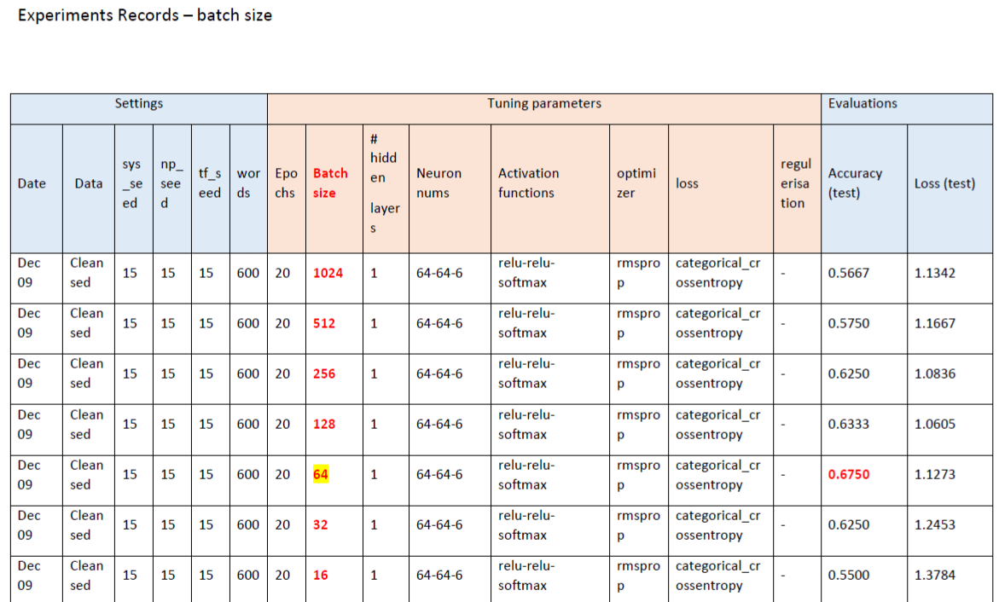

Based on my controlled settings, the best performing batch size is 64 when operated on Dec 09, with accuracy=0.675. I have found an increasing-then-decreasing pattern of the accuracies when the batch size goes down. 

### Controlled experiment - number of layers

No hidden layers: Only able to represent linearly separable functions or decisions. 

Number of hidden layers = 1: Any function that 'contains a continuous mapping from one finite space to another finite space' can be fitted. 

Number of hidden layers = 2: With an appropriate activation function, any decision boundary of any precision can be represented, and any smooth map of any precision can be fitted. 

Number of hidden layers > 2: Extra hidden layers can learn complex descriptions (some kind of automatic feature engineering). [12]



In [74]:
# control experiment for the number of layers
def exp_num_layers(num_layers_inner, batch_size, words, neuron, activation, random_state): 
    '''  Controlled Experiment - Number of Layers
    
    Parameters: 
      num_layers_inner - the number of inner layers. 
      batch_size - the batch size we want to set. 
      words - the number of words for the input_shape. 
      neuron - the number of neurons in each layer, in integer type. 
      activation - the activation function in string type. 
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    # train the model: 
    model = models.Sequential()
    # just pick any parameters here to control the other variables: 
    model.add(layers.Dense(neuron, activation = 'relu', input_shape = (words,)))
    
    # the inner layers we need to control and test: 
    i = 0
    while i < num_layers_inner: 
        model.add(layers.Dense(neuron, activation = activation))  # note we can change the settings
        i+=1
        
    # the last layer: 
    model.add(layers.Dense(6, activation = 'softmax'))
    model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    # train-validation splitting: 
    # this time I use the cleansed dataset
    X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=random_state)  
    # we set a random state in order to repeat the experiment later

    history = model.fit(X_train_partial2, 
                        Y_train_partial2,
                        batch_size=batch_size, # input the batch size we want to set
                        epochs=20,  # we just set any fixed number for control
                        validation_data=(X_val2, Y_val2))

    # use this model to evaluate the test set and show the results [loss, accuracy]: 
    results = model.evaluate(X_test2, Y_test2)
    combine = [results, history]
    
    # return the results list, and the useful 'history' variable to later draw plots: 
    return combine

In [75]:
# Feb 03
result = []
for i in range(0, 7): 
    a = exp_num_layers(i, 64, 600, 256, 'relu', 15)
    result.append(a[0])
print(result)

Epoch 1/20
6/6 [==============================] - 0s 31ms/step - loss: 1.7410 - accuracy: 0.3125 - val_loss: 1.4840 - val_accuracy: 0.4583
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1.1123 - accuracy: 0.6719 - val_loss: 1.1753 - val_accuracy: 0.6146
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 0.8672 - accuracy: 0.7839 - val_loss: 1.0660 - val_accuracy: 0.6354
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 0.6673 - accuracy: 0.8698 - val_loss: 1.0446 - val_accuracy: 0.6250
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 0.5535 - accuracy: 0.9010 - val_loss: 0.9750 - val_accuracy: 0.6562
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 0.4400 - accuracy: 0.9453 - val_loss: 0.9471 - val_accuracy: 0.6667
Epoch 7/20
6/6 [==============================] - 0s 6ms/step - loss: 0.3643 - accuracy: 0.9505 - val_loss: 1.0098 - val_accuracy: 0.6146
Epoch 8/20
6/6 [================

Epoch 19/20
6/6 [==============================] - 0s 8ms/step - loss: 0.0925 - accuracy: 0.9583 - val_loss: 1.3331 - val_accuracy: 0.6250
Epoch 20/20
4/4 [==============================] - 0s 2ms/step - loss: 1.2297 - accuracy: 0.6833
Epoch 1/20
6/6 [==============================] - 1s 28ms/step - loss: 1.7332 - accuracy: 0.2448 - val_loss: 1.6915 - val_accuracy: 0.3125
Epoch 2/20
6/6 [==============================] - 0s 6ms/step - loss: 1.4040 - accuracy: 0.4974 - val_loss: 1.2821 - val_accuracy: 0.4583
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 0.9818 - accuracy: 0.6953 - val_loss: 1.2997 - val_accuracy: 0.5625
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 0.7688 - accuracy: 0.7318 - val_loss: 1.1096 - val_accuracy: 0.5833
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 0.6419 - accuracy: 0.8099 - val_loss: 1.3456 - val_accuracy: 0.5521
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 0.

Group 01

An earlier execution: 
 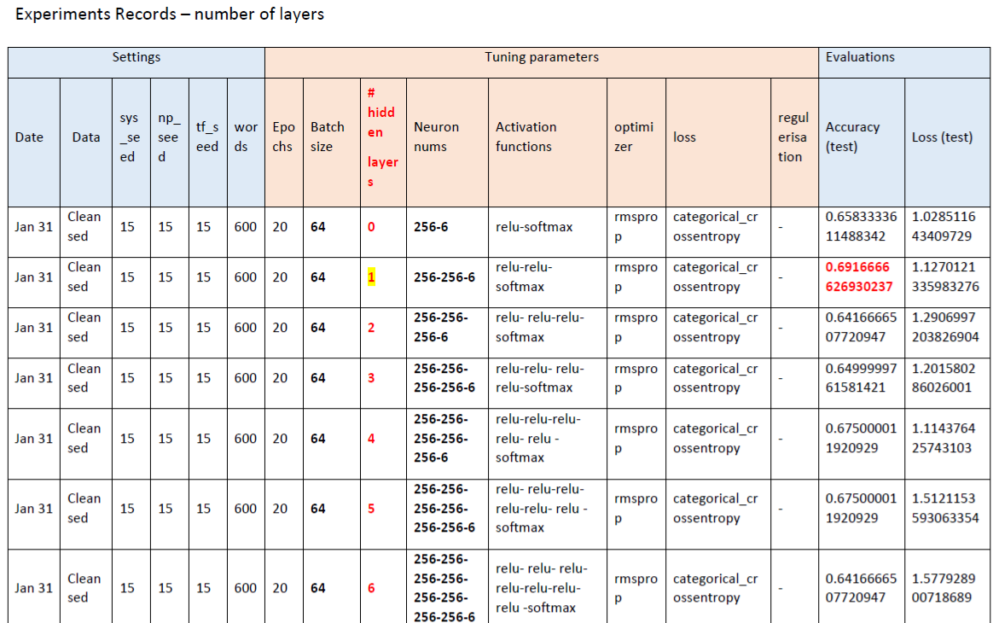

A later execution: 
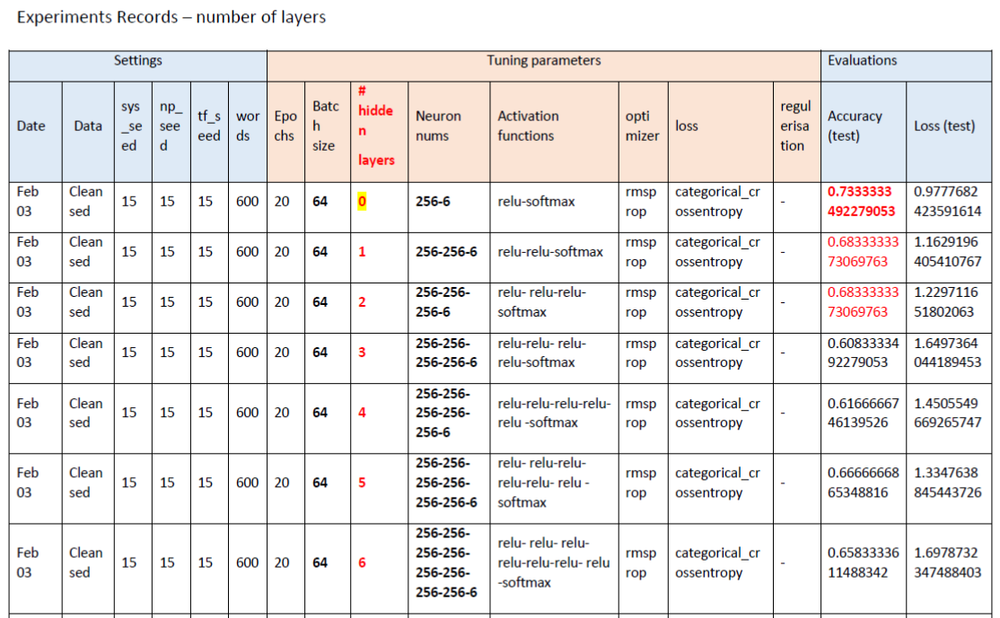

In [76]:
# Feb 03
result2 = []
for i in range(0, 7): 
    a = exp_num_layers(i, 256, 600, 128, 'relu', 15)
    result2.append(a[0])
print(result2)

Epoch 1/20
2/2 [==============================] - 0s 125ms/step - loss: 1.8085 - accuracy: 0.2266 - val_loss: 1.6367 - val_accuracy: 0.4062
Epoch 2/20
2/2 [==============================] - 0s 16ms/step - loss: 1.4110 - accuracy: 0.5052 - val_loss: 1.3624 - val_accuracy: 0.5104
Epoch 3/20
2/2 [==============================] - 0s 27ms/step - loss: 1.1711 - accuracy: 0.6432 - val_loss: 1.2552 - val_accuracy: 0.5938
Epoch 4/20
2/2 [==============================] - 0s 27ms/step - loss: 1.0384 - accuracy: 0.7109 - val_loss: 1.2053 - val_accuracy: 0.5938
Epoch 5/20
2/2 [==============================] - 0s 26ms/step - loss: 0.9132 - accuracy: 0.7760 - val_loss: 1.1730 - val_accuracy: 0.5833
Epoch 6/20
2/2 [==============================] - 0s 25ms/step - loss: 0.8384 - accuracy: 0.7995 - val_loss: 1.1369 - val_accuracy: 0.6146
Epoch 7/20
2/2 [==============================] - 0s 26ms/step - loss: 0.7382 - accuracy: 0.8490 - val_loss: 1.1119 - val_accuracy: 0.6250
Epoch 8/20
2/2 [==========

Epoch 15/20
2/2 [==============================] - 0s 24ms/step - loss: 0.5323 - accuracy: 0.8724 - val_loss: 1.0233 - val_accuracy: 0.5938
Epoch 16/20
2/2 [==============================] - 0s 24ms/step - loss: 0.4580 - accuracy: 0.8854 - val_loss: 1.0149 - val_accuracy: 0.6146
Epoch 17/20
2/2 [==============================] - 0s 24ms/step - loss: 0.4490 - accuracy: 0.8542 - val_loss: 1.0233 - val_accuracy: 0.6146
Epoch 18/20
2/2 [==============================] - 0s 26ms/step - loss: 0.4090 - accuracy: 0.8698 - val_loss: 1.0782 - val_accuracy: 0.5625
Epoch 19/20
2/2 [==============================] - 0s 24ms/step - loss: 0.5394 - accuracy: 0.8333 - val_loss: 1.3384 - val_accuracy: 0.5208
Epoch 20/20
4/4 [==============================] - 0s 1ms/step - loss: 1.0963 - accuracy: 0.6000
Epoch 1/20
2/2 [==============================] - 1s 138ms/step - loss: 1.7881 - accuracy: 0.1797 - val_loss: 1.7624 - val_accuracy: 0.3229
Epoch 2/20
2/2 [==============================] - 0s 30ms/step 

Group 2

An earlier execution: 
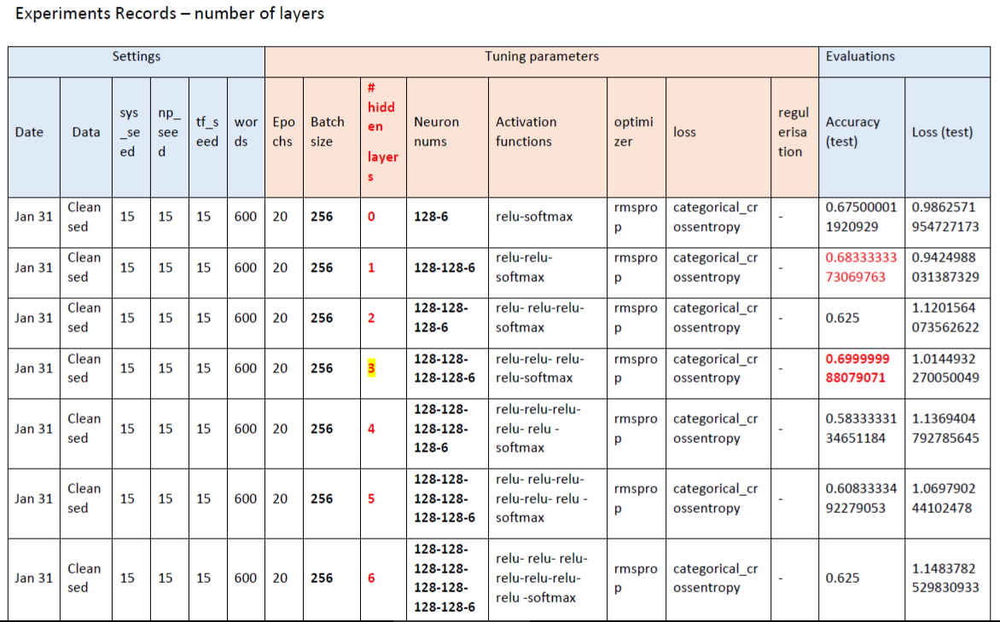

A later execution: 
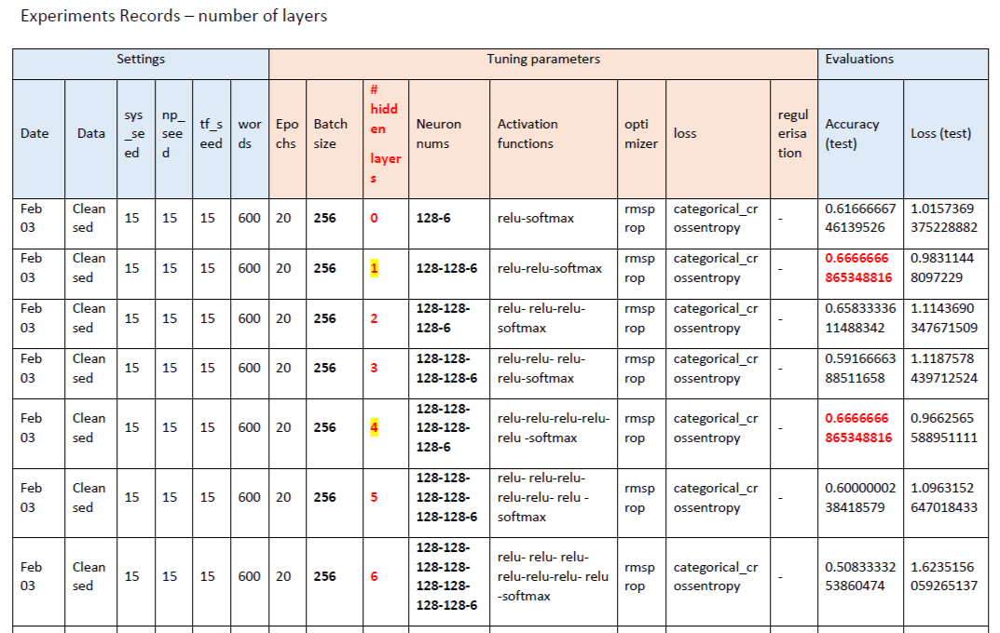

In [77]:
# Feb 03
result3 = []
for i in range(0, 7): 
    a = exp_num_layers(i, 128, 600, 128, 'relu', 15)
    result3.append(a[0])
print(result3)

Epoch 1/20
3/3 [==============================] - 0s 54ms/step - loss: 1.7335 - accuracy: 0.2578 - val_loss: 1.5959 - val_accuracy: 0.4375
Epoch 2/20
3/3 [==============================] - 0s 13ms/step - loss: 1.3166 - accuracy: 0.5208 - val_loss: 1.3422 - val_accuracy: 0.5417
Epoch 3/20
3/3 [==============================] - 0s 15ms/step - loss: 1.0934 - accuracy: 0.6849 - val_loss: 1.2277 - val_accuracy: 0.5729
Epoch 4/20
3/3 [==============================] - 0s 14ms/step - loss: 0.9351 - accuracy: 0.7708 - val_loss: 1.1489 - val_accuracy: 0.6146
Epoch 5/20
3/3 [==============================] - 0s 13ms/step - loss: 0.8535 - accuracy: 0.7760 - val_loss: 1.1622 - val_accuracy: 0.5938
Epoch 6/20
3/3 [==============================] - 0s 14ms/step - loss: 0.7365 - accuracy: 0.8229 - val_loss: 1.0798 - val_accuracy: 0.6250
Epoch 7/20
3/3 [==============================] - 0s 15ms/step - loss: 0.6484 - accuracy: 0.8672 - val_loss: 1.1047 - val_accuracy: 0.6354
Epoch 8/20
3/3 [===========

Epoch 15/20
3/3 [==============================] - 0s 25ms/step - loss: 0.3554 - accuracy: 0.9036 - val_loss: 1.2204 - val_accuracy: 0.6354
Epoch 16/20
3/3 [==============================] - 0s 15ms/step - loss: 0.3667 - accuracy: 0.8958 - val_loss: 0.9724 - val_accuracy: 0.5938
Epoch 17/20
3/3 [==============================] - 0s 16ms/step - loss: 0.1923 - accuracy: 0.9583 - val_loss: 1.0368 - val_accuracy: 0.6250
Epoch 18/20
3/3 [==============================] - 0s 15ms/step - loss: 0.1709 - accuracy: 0.9609 - val_loss: 1.1455 - val_accuracy: 0.6458
Epoch 19/20
3/3 [==============================] - 0s 15ms/step - loss: 0.1370 - accuracy: 0.9609 - val_loss: 1.5706 - val_accuracy: 0.6042
Epoch 20/20
4/4 [==============================] - 0s 2ms/step - loss: 1.3731 - accuracy: 0.6000
Epoch 1/20
3/3 [==============================] - 1s 74ms/step - loss: 1.7842 - accuracy: 0.2057 - val_loss: 1.7437 - val_accuracy: 0.3854
Epoch 2/20
3/3 [==============================] - 0s 21ms/step -

Group 3

An earlier execution: 
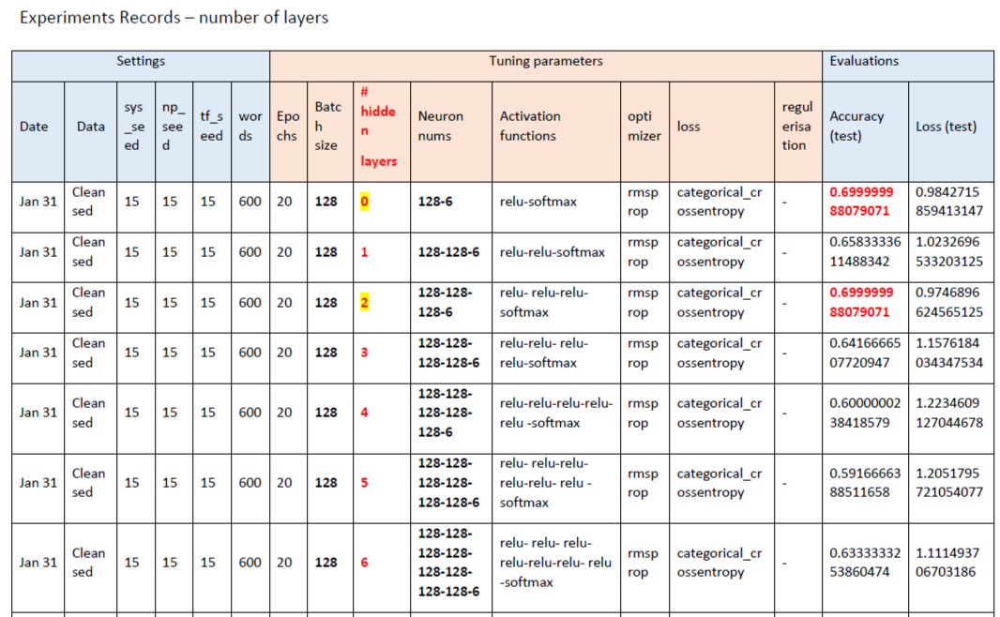

A later execution: 
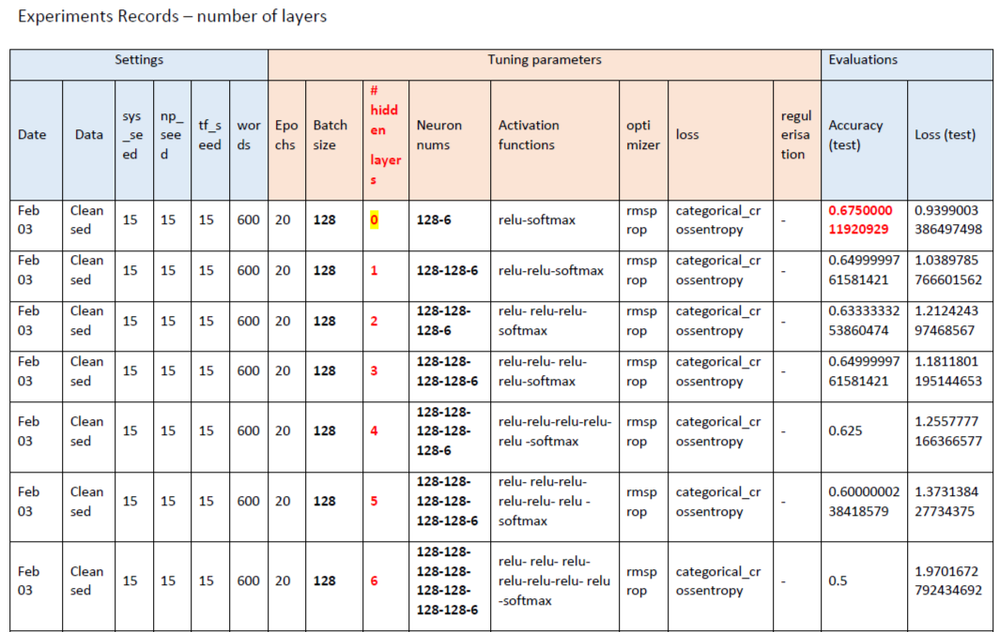

I have found that the best number of layers is unpredictable, varying from different controlled settings (I use 3 groups), and different operating date (two days). The best layer number covers all from 0 to 4. Therefore, this hyperparameter depends on the real settings of our model. 

### Controlled experiment - activation functions

Just like in a human brain neural network, we have a scheme for activating a specific neuron to let it function, we also have an activation function to activate a layer of neurons by its rule. In general, any candidate for an activation function should increase suddenly to show the 'activation'. 


In [89]:
# control experiment for the number of layers
def exp_act_func(act_list, num_layers_inner, batch_size, neuron, words, random_state): 
    '''  Controlled Experiment - Activation Functions
    
    Parameters: 
      act_list - a list of strings which are the activation functions. ['relu', 'relu', 'softmax']
      num_layers_inner - the number of inner layers. 
      batch_size - the batch size we want to set. 
      words - the number of words for the input_shape. 
      neuron - the number of neurons in each layer, in integer type.  
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    if len(act_list) != (num_layers_inner + 2): 
        print("You have to enter a matching activation function list and the number of inner layers. Check again. ")
    elif len(act_list) < 2: 
        print("You must have at least 2 layers; that's to say, you must have 2 activation functions. ")
    else: 
        # train the model: 
        model = models.Sequential()

        # just pick any parameters here to control the other variables: 
        model.add(layers.Dense(64, activation = act_list[0], input_shape = (words,)))  # the first element in act_list

        # the inner layers we need to control and test: 
        i = 0
        while i < num_layers_inner: 
            model.add(layers.Dense(neuron, activation = act_list[i+1]))  # add the 2nd element and more
            i+=1

        # the last layer: 
        model.add(layers.Dense(6, activation = act_list[-1]))  # the last element in act_list
        model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])

        # train-validation splitting: 
        # this time I use the cleansed dataset
        X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
            X_train2, Y_train2, test_size=0.20, random_state=random_state)  
        # we set a random state in order to repeat the experiment later

        history = model.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=batch_size, # input the batch size we want to set
                            epochs=20,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

        # use this model to evaluate the test set and show the results [loss, accuracy]: 
        results = model.evaluate(X_test2, Y_test2)
        combine = [results, history]

        # return the results list, and the useful 'history' variable to later draw plots: 
        return combine

In [90]:
# all the types of activation functions I can think of: 
all_act_list = ['relu', 'softmax', 'sigmoid', 'tanh', 'selu', 'softsign', 'hard_sigmoid', 'exponential']

In [92]:
# Feb 03
# First, we test the case of 3 layers in total, and we only have the experimental variable of the middle layer: 
act_result = []
for each in all_act_list: 
    input_list = ['relu', each, 'softmax']
    act_result.append(exp_act_func(act_list = input_list, 
                                   num_layers_inner = 1, 
                                   batch_size = 128, 
                                   neuron = 128, 
                                   words = 600, 
                                   random_state = 15)[0])
act_result

Train on 384 samples, validate on 96 samples
Epoch 1/20
384/384 [==============================] - 0s 543us/sample - loss: 1.7917 - accuracy: 0.2083 - val_loss: 1.6322 - val_accuracy: 0.4375
Epoch 2/20
384/384 [==============================] - 0s 23us/sample - loss: 1.5119 - accuracy: 0.5156 - val_loss: 1.4517 - val_accuracy: 0.5104
Epoch 3/20
384/384 [==============================] - 0s 23us/sample - loss: 1.2963 - accuracy: 0.6328 - val_loss: 1.3320 - val_accuracy: 0.5312
Epoch 4/20
384/384 [==============================] - 0s 21us/sample - loss: 1.1279 - accuracy: 0.6901 - val_loss: 1.2335 - val_accuracy: 0.5833
Epoch 5/20
384/384 [==============================] - 0s 21us/sample - loss: 0.9915 - accuracy: 0.7604 - val_loss: 1.1860 - val_accuracy: 0.5938
Epoch 6/20
384/384 [==============================] - 0s 29us/sample - loss: 0.9002 - accuracy: 0.7656 - val_loss: 1.1825 - val_accuracy: 0.6042
Epoch 7/20
384/384 [==============================] - 0s 21us/sample - loss: 0.7944 

384/384 [==============================] - 0s 23us/sample - loss: 0.4926 - accuracy: 0.9323 - val_loss: 1.0036 - val_accuracy: 0.6562
Epoch 12/20
384/384 [==============================] - 0s 18us/sample - loss: 0.4410 - accuracy: 0.9349 - val_loss: 1.0016 - val_accuracy: 0.6771
Epoch 13/20
384/384 [==============================] - 0s 21us/sample - loss: 0.3951 - accuracy: 0.9427 - val_loss: 1.0080 - val_accuracy: 0.6562
Epoch 14/20
384/384 [==============================] - 0s 23us/sample - loss: 0.3543 - accuracy: 0.9557 - val_loss: 1.0505 - val_accuracy: 0.6458
Epoch 15/20
384/384 [==============================] - 0s 21us/sample - loss: 0.3114 - accuracy: 0.9609 - val_loss: 1.0549 - val_accuracy: 0.6562
Epoch 16/20
384/384 [==============================] - 0s 21us/sample - loss: 0.3026 - accuracy: 0.9609 - val_loss: 0.9916 - val_accuracy: 0.6562
Epoch 17/20
384/384 [==============================] - 0s 21us/sample - loss: 0.2564 - accuracy: 0.9609 - val_loss: 1.0130 - val_accurac

[[1.0465116818745932, 0.65],
 [1.6607657194137573, 0.49166667],
 [0.9671117067337036, 0.675],
 [1.1139755964279174, 0.6333333],
 [1.0172423601150513, 0.6666667],
 [0.9269145607948304, 0.68333334],
 [0.9540115276972453, 0.69166666],
 [1.493983308474223, 0.6666667]]

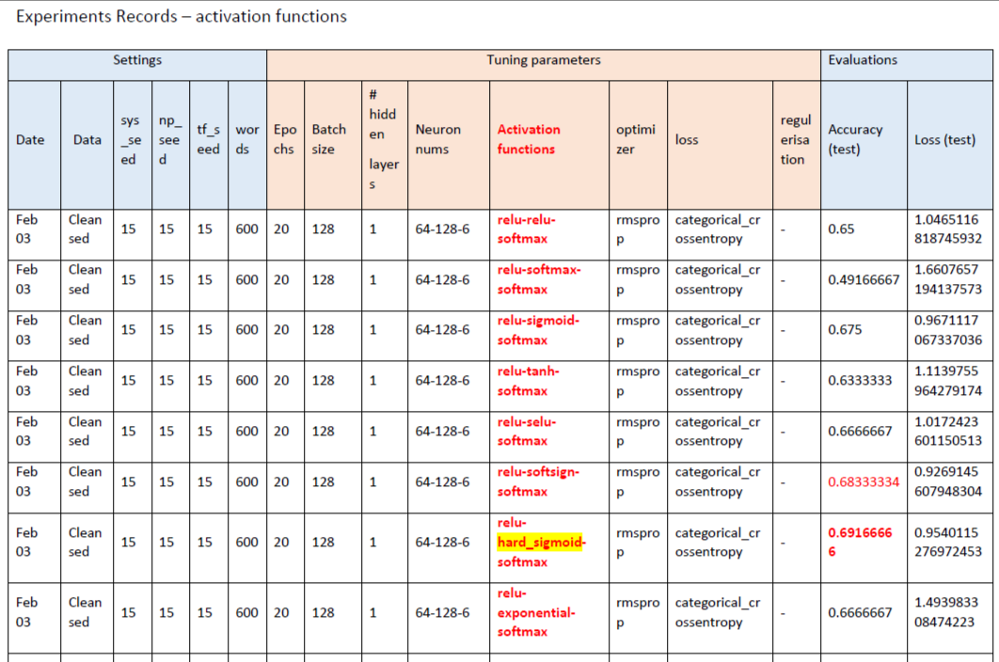

(Feb 03) It seems that relu-hard_sigmoid-softmax has the highest accuracy with 0.69; relu-softsign-softmax also performs well with 0.68; if we put softmax inside the middle layer, we get low accuracy; relu-sigmoid-softmax performs also rather high, with accuracy of 0.675. 

In [93]:
# Feb 03
# then, we test the case of 4 layers in total, and we change the middle 2 layers as having the same act func: 
act_result2 = []
for each in all_act_list: 
    input_list = ['relu', each, each, 'softmax']
    act_result2.append(exp_act_func(act_list = input_list, 
                                   num_layers_inner = 2, 
                                   batch_size = 128, 
                                   neuron = 128, 
                                   words = 600, 
                                   random_state = 15)[0])
act_result2

Train on 384 samples, validate on 96 samples
Epoch 1/20
384/384 [==============================] - 0s 787us/sample - loss: 1.7546 - accuracy: 0.2682 - val_loss: 1.5732 - val_accuracy: 0.3958
Epoch 2/20
384/384 [==============================] - 0s 41us/sample - loss: 1.5357 - accuracy: 0.4401 - val_loss: 1.5072 - val_accuracy: 0.3854
Epoch 3/20
384/384 [==============================] - 0s 43us/sample - loss: 1.3467 - accuracy: 0.5729 - val_loss: 1.3311 - val_accuracy: 0.4583
Epoch 4/20
384/384 [==============================] - 0s 23us/sample - loss: 1.1568 - accuracy: 0.6771 - val_loss: 1.2262 - val_accuracy: 0.5729
Epoch 5/20
384/384 [==============================] - 0s 31us/sample - loss: 0.9649 - accuracy: 0.7552 - val_loss: 1.2081 - val_accuracy: 0.5417
Epoch 6/20
384/384 [==============================] - 0s 23us/sample - loss: 0.8880 - accuracy: 0.7240 - val_loss: 1.1970 - val_accuracy: 0.5625
Epoch 7/20
384/384 [==============================] - 0s 29us/sample - loss: 0.8026 

Epoch 12/20
384/384 [==============================] - 0s 41us/sample - loss: 0.2805 - accuracy: 0.9557 - val_loss: 0.9931 - val_accuracy: 0.6250
Epoch 13/20
384/384 [==============================] - 0s 0s/sample - loss: 0.2340 - accuracy: 0.9557 - val_loss: 0.9998 - val_accuracy: 0.6354
Epoch 14/20
384/384 [==============================] - 0s 0s/sample - loss: 0.1968 - accuracy: 0.9688 - val_loss: 1.0598 - val_accuracy: 0.6250
Epoch 15/20
384/384 [==============================] - 0s 41us/sample - loss: 0.1676 - accuracy: 0.9688 - val_loss: 1.0799 - val_accuracy: 0.6458
Epoch 16/20
384/384 [==============================] - 0s 41us/sample - loss: 0.1577 - accuracy: 0.9688 - val_loss: 1.0620 - val_accuracy: 0.6250
Epoch 17/20
384/384 [==============================] - 0s 41us/sample - loss: 0.1312 - accuracy: 0.9688 - val_loss: 1.0989 - val_accuracy: 0.6146
Epoch 18/20
384/384 [==============================] - 0s 41us/sample - loss: 0.1214 - accuracy: 0.9688 - val_loss: 1.1878 - val

[[1.0755352258682251, 0.625],
 [1.7877373139063517, 0.29166666],
 [1.104865050315857, 0.6166667],
 [1.0579676866531371, 0.6666667],
 [1.2318978706995647, 0.64166665],
 [1.1883386691411337, 0.625],
 [1.1228162209192911, 0.6333333],
 [1.981887149810791, 0.55833334]]

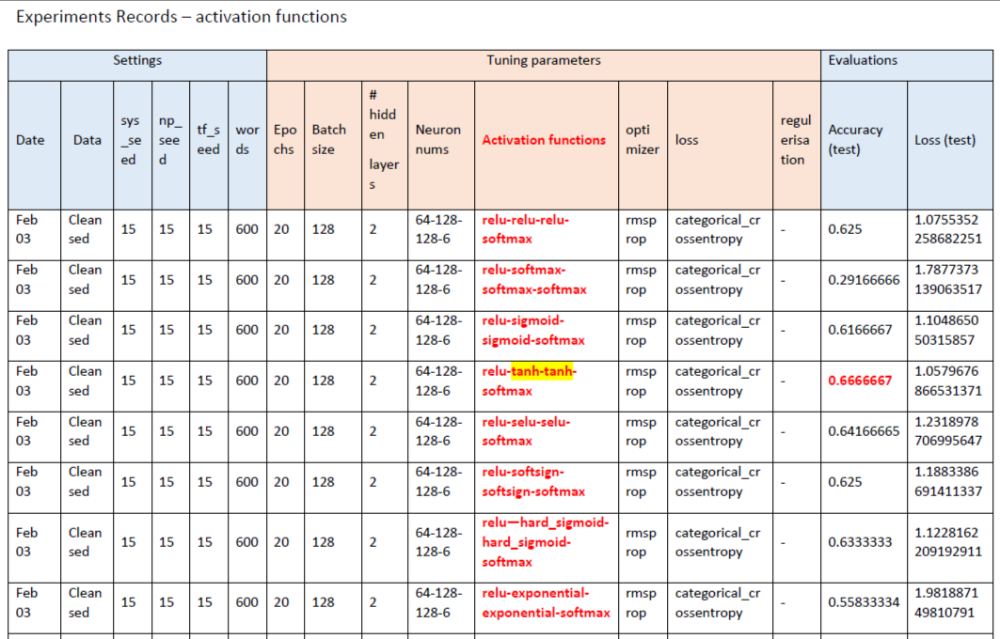

(Feb 03) This time, relu-tanh-tanh-softmax wins with accuracy=0.6667. Also, softmax cannot be put inside inner layers, as this time we have relu-softmax-softmax-softmax with accuracy=0.29. Selu also perfoms well. 

### Controlled experiment - neuron numbers

It is skillful to set all the proper neuron numbers in all the layers. No doubt, the final ourput layer should have the number of categories, which is 6 here in my project, but we should consider how to set hidden layer neurons, and the input layer neuron. 

We must follow a rule to set a gradually decreasing neuron numbers in the last several layers, to prevent from the 'bottle-neck effect'. 

It is almost a commonsense not to use a very small number as the number of neurons (such as 4 or 8), because it will underfitting since very few samples can go through our network. However, we should also avoid using a very big neuron number, since it will cause overfitting generated by the lack of training and the large amount of request for that layer. 

Replete has proposed some experiences on settling the neuron numbers [12]: 

    The number of hidden neurons should be between the size of the input layer and the size of the output layer.

    The number of hidden neurons should be 2/3 the size of the input layer plus 2/3 the size of the output layer.

    The number of hidden neurons should be less than twice the size of the input layer.
    
and he mentions that in Stackoverflow, someone has stated an experience formula: 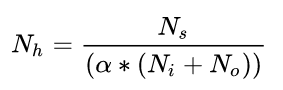
Where Ni is the neuron number in the input layer; No is the neuron number in the output layer; Ns is the sample size in the training set; alpha can be settled arbitrarily from 2 to 10. 

In [94]:
def exp_neuron_nums(neuron, act_list, batch_size, words, random_state): 
    '''  Controlled Experiment - Neuron Numbers
    
    Parameters: 
      neuron - a list of neuron numbers for each layer, starting from the first layer, 
              to the end of inner layer. The number of the output layer does not need to be settled. 
              e.g. [64, 128, 32]
      act_list - a list of strings which are the activation functions. ['relu', 'relu', 'softmax'] 
      batch_size - the batch size we want to set. 
      words - the number of words for the input_shape. 
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    if len(act_list) != len(neuron)+1: 
        print("Check your act_list length and neuron length. They must be equal. Should be: len(act_list) == len(neuron)+1")
    else: 
        # train the model: 
        model = models.Sequential()
        # the first input layer: 
        model.add(layers.Dense(neuron[0], activation = act_list[0], input_shape = (words,)))
        # the inner layers: 
        for i in range(1, len(neuron)): 
            model.add(layers.Dense(neuron[i], activation = act_list[i]))

        # the output layer: 
        model.add(layers.Dense(6, activation = act_list[-1]))
        model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])

        # train-validation splitting: 
        X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
            X_train2, Y_train2, test_size=0.20, random_state=random_state)  
        # we set a random state in order to repeat the experiment later

        history = model.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=512, # set a fixed batch size
                            epochs=15,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

        # use this model to evaluate the test set and show the results [loss, accuracy]: 
        results = model.evaluate(X_test2, Y_test2)
        combine = [results, history]

        # return the results list, and the useful 'history' variable to later draw plots: 
        return combine

In [95]:
numneu_result = []
# to avoid bottleneck effect, we must gradually decrease the neuron numbers in later layers: 
loop_list = [[32, 32, 32], 
             [32, 64, 64],
             [64, 64, 64], 
             [64, 64, 32],
             [64, 128, 128], 
             [64, 128, 64], 
             [128, 128, 256], 
             [128, 128, 128], 
             [128, 128, 64],
             [128, 256, 128],
             [128, 256, 64],
             [512, 256, 128],
             [512, 512, 256], 
             [512, 1024, 512], 
             [1024, 1024, 512], 
             [1024, 512, 256], 
             [1024, 512, 128]
            ]
act_list = ['relu', 'tanh', 'tanh', 'softmax']

In [96]:
# Feb 03
for each_neu_list in loop_list: 
    numneu_result.append(exp_neuron_nums(neuron = each_neu_list, 
                                      act_list = act_list, 
                                      batch_size = 128, 
                                      words = 600, 
                                      random_state = 15)[0])
numneu_result

Train on 384 samples, validate on 96 samples
Epoch 1/15
384/384 [==============================] - 0s 1ms/sample - loss: 1.8626 - accuracy: 0.1641 - val_loss: 1.7471 - val_accuracy: 0.2396
Epoch 2/15
384/384 [==============================] - 0s 16us/sample - loss: 1.7454 - accuracy: 0.2526 - val_loss: 1.6881 - val_accuracy: 0.2292
Epoch 3/15
384/384 [==============================] - 0s 18us/sample - loss: 1.6509 - accuracy: 0.3281 - val_loss: 1.6478 - val_accuracy: 0.3333
Epoch 4/15
384/384 [==============================] - 0s 18us/sample - loss: 1.5795 - accuracy: 0.4531 - val_loss: 1.6042 - val_accuracy: 0.3542
Epoch 5/15
384/384 [==============================] - 0s 18us/sample - loss: 1.5130 - accuracy: 0.5052 - val_loss: 1.5755 - val_accuracy: 0.3958
Epoch 6/15
384/384 [==============================] - 0s 21us/sample - loss: 1.4557 - accuracy: 0.5312 - val_loss: 1.5261 - val_accuracy: 0.4271
Epoch 7/15
384/384 [==============================] - 0s 21us/sample - loss: 1.4018 - 

384/384 [==============================] - 0s 23us/sample - loss: 1.0866 - accuracy: 0.7292 - val_loss: 1.2669 - val_accuracy: 0.6146
Epoch 7/15
384/384 [==============================] - 0s 23us/sample - loss: 0.9986 - accuracy: 0.7214 - val_loss: 1.3821 - val_accuracy: 0.4792
Epoch 8/15
384/384 [==============================] - 0s 23us/sample - loss: 0.9698 - accuracy: 0.7031 - val_loss: 1.2036 - val_accuracy: 0.6042
Epoch 9/15
384/384 [==============================] - 0s 23us/sample - loss: 0.9635 - accuracy: 0.6823 - val_loss: 1.3163 - val_accuracy: 0.5208
Epoch 10/15
384/384 [==============================] - 0s 21us/sample - loss: 0.8410 - accuracy: 0.7604 - val_loss: 1.0842 - val_accuracy: 0.6458
Epoch 11/15
384/384 [==============================] - 0s 34us/sample - loss: 0.6979 - accuracy: 0.8776 - val_loss: 1.1005 - val_accuracy: 0.6250
Epoch 12/15
384/384 [==============================] - 0s 23us/sample - loss: 0.6184 - accuracy: 0.8854 - val_loss: 1.0314 - val_accuracy: 

384/384 [==============================] - 0s 133us/sample - loss: 0.5303 - accuracy: 0.8099 - val_loss: 1.1574 - val_accuracy: 0.5625
Epoch 12/15
384/384 [==============================] - 0s 130us/sample - loss: 0.3737 - accuracy: 0.9036 - val_loss: 0.9682 - val_accuracy: 0.6250
Epoch 13/15
384/384 [==============================] - 0s 138us/sample - loss: 0.2793 - accuracy: 0.9583 - val_loss: 1.0977 - val_accuracy: 0.5938
Epoch 14/15
384/384 [==============================] - 0s 130us/sample - loss: 0.2236 - accuracy: 0.9609 - val_loss: 0.9667 - val_accuracy: 0.6146
Epoch 15/15
384/384 [==============================] - 0s 133us/sample - loss: 0.1810 - accuracy: 0.9688 - val_loss: 1.0998 - val_accuracy: 0.5625
Train on 384 samples, validate on 96 samples
Epoch 1/15
384/384 [==============================] - 1s 1ms/sample - loss: 1.8608 - accuracy: 0.1068 - val_loss: 2.4064 - val_accuracy: 0.3333
Epoch 2/15
384/384 [==============================] - 0s 107us/sample - loss: 2.3004 - a

[[1.281682046254476, 0.575],
 [1.2656379699707032, 0.5416667],
 [1.1398384332656861, 0.625],
 [1.1970116376876831, 0.55],
 [1.1849392811457315, 0.55],
 [1.1169984579086303, 0.55833334],
 [0.9293365836143493, 0.68333334],
 [1.320115900039673, 0.53333336],
 [1.1395802736282348, 0.6],
 [1.1106221596399943, 0.6166667],
 [1.1338408788045247, 0.56666666],
 [0.9334465821584066, 0.68333334],
 [0.9807055513064067, 0.65833336],
 [1.1604699532190959, 0.53333336],
 [0.9688995122909546, 0.65833336],
 [1.2143640756607055, 0.55],
 [1.0940533717473349, 0.55833334]]

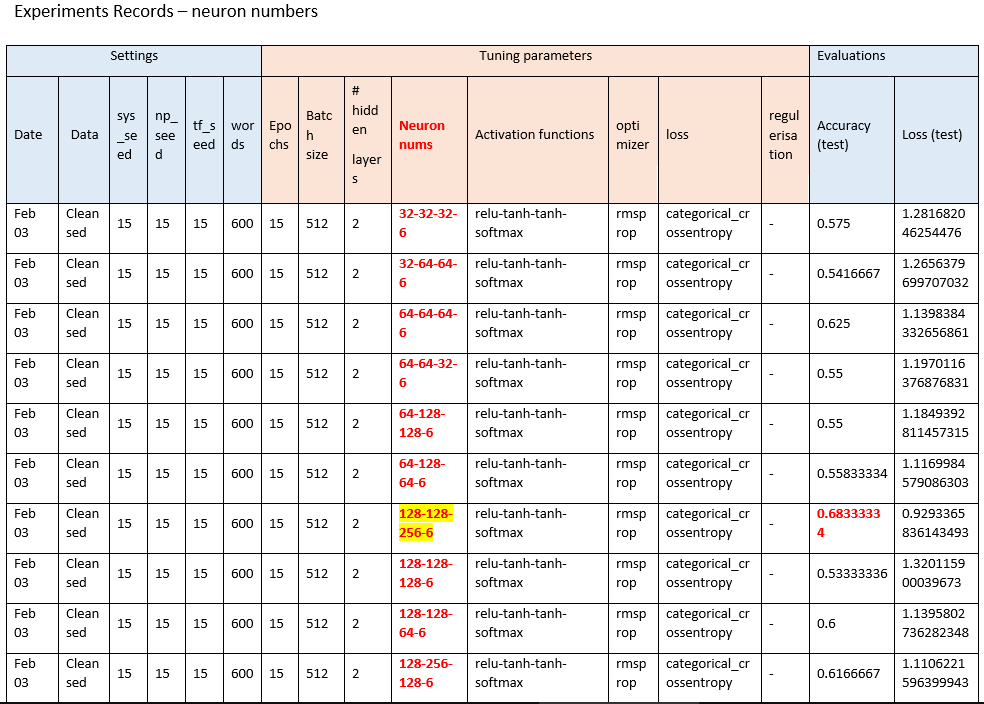

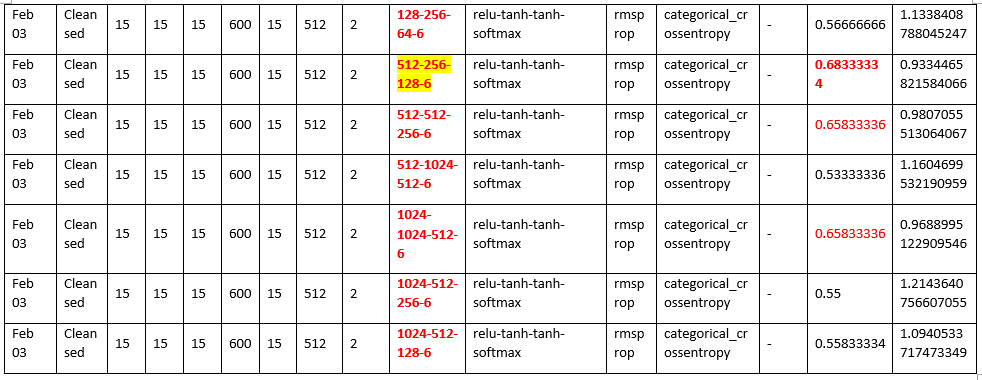


(Feb 03) It seems that, with the same settings, 128-128-256-6 neurons, and 512-256-128-6 neurons perfoms the best, with accuracy=0.68333334. The second best are 512-512-256-6 and 1024-1024-512-6. 

Less neurons or bottleneck effects(128-128-128-6) indeed cannot get a high score. 

### Controlled experiment - optimizers

The functionality of an optimizer is to minimise the loss function, by updating the calculating the neural network parameters that influence the model training. 

SGD uses gradient descent. Although it converges rather more slowly, it adds the momentum to speed up its convergence and to maximise the best solution [10]. The traditional gradient update algorithm is the most common and simplest parameter update strategy. The basic idea is: first set a learning rate λ, and the parameters move in the opposite direction of the gradient. 

AdaGrad adjusts the learning rate through parameters, and it can automatically adjust the learning rate from the model parameters. It can largely update the sparse parameters, and can slightly update the frequently-used parameters. It is suitable to deal with sparse data, but it has a disadvantage which is caused by premature or excessive reduction of the learning rate due to its cumulative gradient squared [10].

RMSProp is modified from the AdaGrad. For the problem that the gradient sum of squares is getting larger and larger, RMSProp replaces the gradient sum of squares with an exponentially weighted moving average [10].

Adam converges fast and is the usually used optimizer. It is in essence an RMSProp with a momentum term [10]. The main advantage of Adam is that after bias correction, the learning rate of each iteration has a certain range, so that the parameters are relatively stable [10]. 

In [112]:
def exp_optimizer(optim, act_list, num_layers_inner, batch_size, neuron, words, random_state): 
    '''  Controlled Experiment - Optimizers
    
    Parameters: 
      optim - the optimizer name in string. 
      act_list - a list of strings which are the activation functions. ['relu', 'relu', 'softmax']
      num_layers_inner - the number of inner layers. 
      batch_size - the batch size we want to set. 
      words - the number of words for the input_shape. 
      neuron - the number of neurons in each layer, in integer type.  
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    if len(act_list) != (num_layers_inner + 2): 
        print("You have to enter a matching activation function list and the number of inner layers. Check again. ")
    elif len(act_list) < 2: 
        print("You must have at least 2 layers; that's to say, you must have 2 activation functions. ")
    else: 
        # train the model: 
        model = models.Sequential()

        # just pick any parameters here to control the other variables: 
        model.add(layers.Dense(neuron[0], activation = act_list[0], input_shape = (words,)))  # the first element in act_list

        # the inner layers we need to control and test: 
        i = 0
        while i < num_layers_inner: 
            model.add(layers.Dense(neuron[i+1], activation = act_list[i+1]))  # add the 2nd element and more
            i+=1

        # the last layer: 
        model.add(layers.Dense(6, activation = act_list[-1]))  # the last element in act_list
        
        model.compile(optimizer = optim, loss = 'categorical_crossentropy', metrics = ['accuracy'])

        # train-validation splitting: 
        # this time I use the cleansed dataset
        X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
            X_train2, Y_train2, test_size=0.20, random_state=random_state)  
        # we set a random state in order to repeat the experiment later

        history = model.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=batch_size, # input the batch size we want to set
                            epochs=20,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

        # use this model to evaluate the test set and show the results [loss, accuracy]: 
        results = model.evaluate(X_test2, Y_test2)
        combine = [results, history]

        # return the results list, and the useful 'history' variable to later draw plots: 
        return combine

In [113]:
optimizers_choices = ['rmsprop', 'adam', 'sgd', 'adagrad', 'adamax', 'adadelta']

In [114]:
opt_result = []
for each in optimizers_choices: 
    opt_result.append(exp_optimizer(optim = each, 
                                    act_list = ['relu', 'tanh', 'tanh', 'softmax'], 
                                    num_layers_inner = 2, 
                                    batch_size = 128, 
                                    neuron = [512, 256, 128], 
                                    words = 600, 
                                    random_state = 15)[0])
opt_result

Train on 384 samples, validate on 96 samples
Epoch 1/20
384/384 [==============================] - 1s 2ms/sample - loss: 2.4162 - accuracy: 0.2396 - val_loss: 2.4415 - val_accuracy: 0.2188
Epoch 2/20
384/384 [==============================] - 0s 102us/sample - loss: 1.6832 - accuracy: 0.4245 - val_loss: 1.3155 - val_accuracy: 0.5521
Epoch 3/20
384/384 [==============================] - 0s 89us/sample - loss: 0.8520 - accuracy: 0.7995 - val_loss: 1.1036 - val_accuracy: 0.5938
Epoch 4/20
384/384 [==============================] - 0s 68us/sample - loss: 0.7564 - accuracy: 0.7708 - val_loss: 1.1896 - val_accuracy: 0.6042
Epoch 5/20
384/384 [==============================] - 0s 76us/sample - loss: 0.5503 - accuracy: 0.8411 - val_loss: 1.1498 - val_accuracy: 0.5417
Epoch 6/20
384/384 [==============================] - 0s 81us/sample - loss: 0.4026 - accuracy: 0.9115 - val_loss: 1.1571 - val_accuracy: 0.6250
Epoch 7/20
384/384 [==============================] - 0s 76us/sample - loss: 0.2771 -

384/384 [==============================] - 0s 63us/sample - loss: 1.9026 - accuracy: 0.1484 - val_loss: 1.9223 - val_accuracy: 0.1667
Epoch 12/20
384/384 [==============================] - 0s 57us/sample - loss: 1.9001 - accuracy: 0.1510 - val_loss: 1.9201 - val_accuracy: 0.1875
Epoch 13/20
384/384 [==============================] - 0s 63us/sample - loss: 1.8977 - accuracy: 0.1510 - val_loss: 1.9181 - val_accuracy: 0.1875
Epoch 14/20
384/384 [==============================] - 0s 63us/sample - loss: 1.8954 - accuracy: 0.1510 - val_loss: 1.9160 - val_accuracy: 0.1875
Epoch 15/20
384/384 [==============================] - 0s 63us/sample - loss: 1.8931 - accuracy: 0.1510 - val_loss: 1.9139 - val_accuracy: 0.1875
Epoch 16/20
384/384 [==============================] - 0s 57us/sample - loss: 1.8907 - accuracy: 0.1510 - val_loss: 1.9119 - val_accuracy: 0.1875
Epoch 17/20
384/384 [==============================] - 0s 63us/sample - loss: 1.8884 - accuracy: 0.1510 - val_loss: 1.9099 - val_accurac

[[1.137278159459432, 0.65833336],
 [1.2403667132059732, 0.7083333],
 [1.4351878404617309, 0.425],
 [1.663960321744283, 0.35833332],
 [1.0454886635144551, 0.69166666],
 [1.8860424121220907, 0.175]]

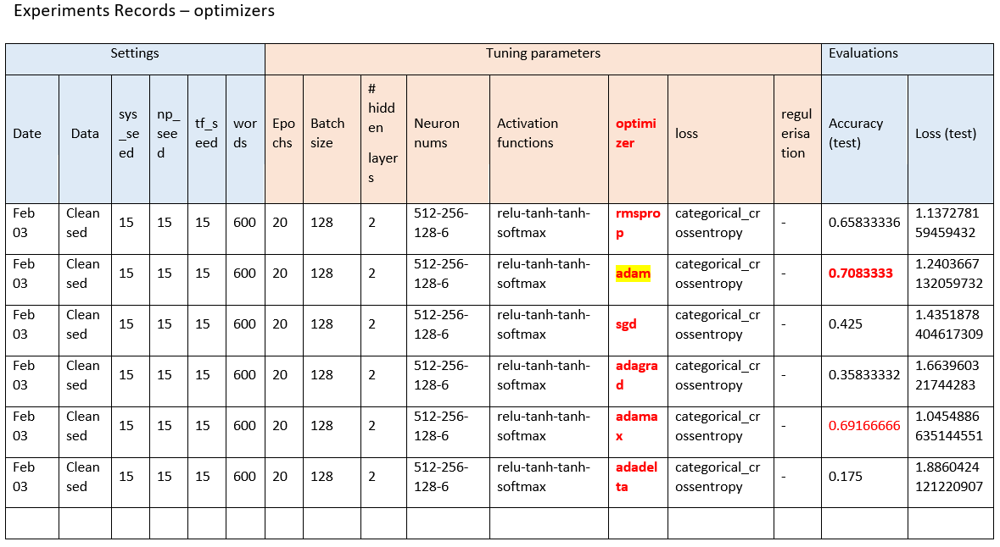

(Feb 03) From the results above, Adam performs really well, with accuracy of nearly 0.70. Adamax and RMSprop are both good to use. Never try to use AdaDelta or AdaGrad. SGD performs with a rather low score as well.  

### Controlled experiment - regularisation

Traditionally, we define a regularisation as a penalising term added in the loss function to increase the generalisation ability of the model. However, we have more regularisation strategies, such as Dropout, DropConnect, etc. To adapt to this change, Goodfellow and Bengio have defined regularisation as 'any modiﬁcation we make to alearning algorithm that is intended to reduce its generalization error but not itstraining error' [11]. 

There are 3 types of regularisers in keras. 

    kernel_regularizer: the old version is called 'weight_regularizer', which is to regularise the weight of that layer. 

    bias_regularizer: to regularise the bias of that layer. 

    activity_regularizer: to regularise the output of that layer. 

In most cases, kernel_regularizer is enough. If you want the input and output to be similar, then use bias_regularizer; if you want the output of that layer to be as small as possible, then use activity_regularizer. 

In [119]:
from tensorflow.keras.regularizers import *
from tensorflow.keras import models
from tensorflow.keras import layers

def exp_regularisation(reg_list, act_list, num_layers_inner, batch_size, neuron, optim, words, random_state): 
    '''  Controlled Experiment - Regularisation
    
    Parameters: 
      reg_list - a list of regularizers. 
      optim - the optimizer name in string. 
      act_list - a list of strings which are the activation functions. ['relu', 'relu', 'softmax']
      num_layers_inner - the number of inner layers. 
      batch_size - the batch size we want to set. 
      words - the number of words for the input_shape. 
      neuron - the number of neurons in each layer, in integer type.  
      random_state - the random state we need to make a record, in order to repeat the experiment. 
    
    Returns: 
      A list including 'results' list, and 'history' variable. 
      The 'results' contains the loss and accuracy. 
    
    '''
    if len(act_list) != (num_layers_inner + 2) or len(act_list) != len(reg_list) or len(reg_list) != (num_layers_inner + 2): 
        print("You have to enter a matching activation function list, number of inner layers, and regulation list. Check again. ")
        print("The rule: len(act_list)==len(reg_list)==(num_layers_inner + 2)")
    elif len(act_list) < 2 or len(reg_list) < 2: 
        print("You have to enter a matching activation function list, number of inner layers, and regulation list. Check again. ")
        print("The rule: len(act_list)==len(reg_list)==(num_layers_inner + 2)")
    else: 
        # train the model: 
        model = models.Sequential()

        # just pick any parameters here to control the other variables: 
        model.add(layers.Dense(neuron[0], activation=act_list[0], input_shape=(words,), kernel_regularizer=reg_list[0])) 
        # the inner layers we need to control and test: 
        i = 0
        while i < num_layers_inner: 
            model.add(layers.Dense(neuron[i+1], activation=act_list[i+1], kernel_regularizer=reg_list[i+1])) 
            i+=1

        # the last layer: 
        model.add(layers.Dense(6, activation=act_list[-1], kernel_regularizer=reg_list[-1])) 
        
        model.compile(optimizer=optim, loss='categorical_crossentropy', metrics=['accuracy'])

        # train-validation splitting: 
        # this time I use the cleansed dataset
        X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
            X_train2, Y_train2, test_size=0.20, random_state=random_state)  
        # we set a random state in order to repeat the experiment later

        history = model.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=batch_size, # input the batch size we want to set
                            epochs=20,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

        # use this model to evaluate the test set and show the results [loss, accuracy]: 
        results = model.evaluate(X_test2, Y_test2)
        combine = [results, history]

        # return the results list, and the useful 'history' variable to later draw plots: 
        return combine

In [120]:
reg_choices = [None, 
            l1(0.00001), l1(0.0001), l1(0.001), l1(0.01), l1(0.1), 
              l2(0.00001), l2(0.0001), l2(0.001), l2(0.01), l2(0.1),
              l1_l2(l1=0.00001, l2=0.00001), l1_l2(l1=0.0001, l2=0.0001), l1_l2(l1=0.001, l2=0.001), l1_l2(l1=0.1, l2=0.1), 
              l1_l2(l1=0.00001, l2=0.1), l1_l2(l1=0.1, l2=0.00001)]

In [122]:
# Feb 08
reg_result = []
for each in reg_choices: 
    reg_result.append(exp_regularisation(reg_list=[each, each, each, each],
                                    optim = 'adam', 
                                    act_list = ['relu', 'tanh', 'tanh', 'softmax'], 
                                    num_layers_inner = 2, 
                                    batch_size = 128, 
                                    neuron = [512, 256, 128], 
                                    words = 600, 
                                    random_state = 15)[0])
reg_result

Epoch 1/20
3/3 [==============================] - 1s 71ms/step - loss: 1.8467 - accuracy: 0.2109 - val_loss: 1.5558 - val_accuracy: 0.3542
Epoch 2/20
3/3 [==============================] - 0s 23ms/step - loss: 1.1997 - accuracy: 0.6094 - val_loss: 1.3647 - val_accuracy: 0.4896
Epoch 3/20
3/3 [==============================] - 0s 19ms/step - loss: 0.9066 - accuracy: 0.7500 - val_loss: 1.0969 - val_accuracy: 0.5938
Epoch 4/20
3/3 [==============================] - 0s 20ms/step - loss: 0.6209 - accuracy: 0.8568 - val_loss: 1.0031 - val_accuracy: 0.6146
Epoch 5/20
3/3 [==============================] - 0s 19ms/step - loss: 0.4543 - accuracy: 0.9062 - val_loss: 0.9243 - val_accuracy: 0.6250
Epoch 6/20
3/3 [==============================] - 0s 18ms/step - loss: 0.2892 - accuracy: 0.9453 - val_loss: 0.9431 - val_accuracy: 0.6458
Epoch 7/20
3/3 [==============================] - 0s 21ms/step - loss: 0.2011 - accuracy: 0.9635 - val_loss: 0.9893 - val_accuracy: 0.6771
Epoch 8/20
3/3 [===========

Epoch 14/20
3/3 [==============================] - 0s 21ms/step - loss: 533.0133 - accuracy: 0.1562 - val_loss: 487.7387 - val_accuracy: 0.1042
Epoch 15/20
3/3 [==============================] - 0s 20ms/step - loss: 466.1795 - accuracy: 0.1615 - val_loss: 424.2550 - val_accuracy: 0.1042
Epoch 16/20
3/3 [==============================] - 0s 21ms/step - loss: 404.4449 - accuracy: 0.1693 - val_loss: 365.9821 - val_accuracy: 0.1042
Epoch 17/20
3/3 [==============================] - 0s 21ms/step - loss: 347.9865 - accuracy: 0.1667 - val_loss: 313.3061 - val_accuracy: 0.1146
Epoch 18/20
3/3 [==============================] - 0s 19ms/step - loss: 297.0947 - accuracy: 0.1875 - val_loss: 265.8065 - val_accuracy: 0.1354
Epoch 19/20
3/3 [==============================] - 0s 21ms/step - loss: 251.3045 - accuracy: 0.1849 - val_loss: 223.5578 - val_accuracy: 0.1458
Epoch 20/20
4/4 [==============================] - 0s 3ms/step - loss: 186.6714 - accuracy: 0.2083
Epoch 1/20
3/3 [=====================

Epoch 11/20
3/3 [==============================] - 0s 20ms/step - loss: 1.0898 - accuracy: 0.9714 - val_loss: 2.1329 - val_accuracy: 0.6458
Epoch 12/20
3/3 [==============================] - 0s 19ms/step - loss: 1.0769 - accuracy: 0.9635 - val_loss: 2.1826 - val_accuracy: 0.6562
Epoch 13/20
3/3 [==============================] - 0s 19ms/step - loss: 1.0659 - accuracy: 0.9714 - val_loss: 2.1951 - val_accuracy: 0.6667
Epoch 14/20
3/3 [==============================] - 0s 19ms/step - loss: 1.0474 - accuracy: 0.9688 - val_loss: 2.1276 - val_accuracy: 0.6562
Epoch 15/20
3/3 [==============================] - 0s 20ms/step - loss: 1.0371 - accuracy: 0.9714 - val_loss: 2.1489 - val_accuracy: 0.6667
Epoch 16/20
3/3 [==============================] - 0s 19ms/step - loss: 1.0146 - accuracy: 0.9714 - val_loss: 2.1711 - val_accuracy: 0.6875
Epoch 17/20
3/3 [==============================] - 0s 19ms/step - loss: 1.0113 - accuracy: 0.9714 - val_loss: 2.1582 - val_accuracy: 0.6667
Epoch 18/20
3/3 [===

3/3 [==============================] - 0s 21ms/step - loss: 1693.2719 - accuracy: 0.1432 - val_loss: 1603.3805 - val_accuracy: 0.1458
Epoch 4/20
3/3 [==============================] - 0s 20ms/step - loss: 1559.9078 - accuracy: 0.1406 - val_loss: 1474.2305 - val_accuracy: 0.1250
Epoch 5/20
3/3 [==============================] - 0s 19ms/step - loss: 1432.8740 - accuracy: 0.1354 - val_loss: 1351.4209 - val_accuracy: 0.1146
Epoch 6/20
3/3 [==============================] - 0s 21ms/step - loss: 1312.0690 - accuracy: 0.1432 - val_loss: 1234.6772 - val_accuracy: 0.1771
Epoch 7/20
3/3 [==============================] - 0s 21ms/step - loss: 1197.3442 - accuracy: 0.1536 - val_loss: 1123.9926 - val_accuracy: 0.1979
Epoch 8/20
3/3 [==============================] - 0s 21ms/step - loss: 1088.5963 - accuracy: 0.1745 - val_loss: 1019.1116 - val_accuracy: 0.2188
Epoch 9/20
3/3 [==============================] - 0s 20ms/step - loss: 985.6824 - accuracy: 0.1927 - val_loss: 920.1393 - val_accuracy: 0.177

3/3 [==============================] - 0s 20ms/step - loss: 251.2692 - accuracy: 0.1927 - val_loss: 223.4086 - val_accuracy: 0.1771
Epoch 20/20
4/4 [==============================] - 0s 3ms/step - loss: 186.4034 - accuracy: 0.1917


[[1.2913317680358887, 0.6583333611488342],
 [1.4933713674545288, 0.6666666865348816],
 [2.9563088417053223, 0.6833333373069763],
 [7.496500015258789, 0.6583333611488342],
 [20.807106018066406, 0.1666666716337204],
 [186.67141723632812, 0.2083333283662796],
 [1.3007627725601196, 0.6916666626930237],
 [1.4108805656433105, 0.6833333373069763],
 [2.105928897857666, 0.6666666865348816],
 [3.848038673400879, 0.6916666626930237],
 [10.259035110473633, 0.4416666626930237],
 [1.4778742790222168, 0.6499999761581421],
 [2.9277451038360596, 0.6583333611488342],
 [7.606308937072754, 0.6916666626930237],
 [200.3531951904297, 0.19166666269302368],
 [10.308137893676758, 0.4749999940395355],
 [186.40341186523438, 0.19166666269302368]]

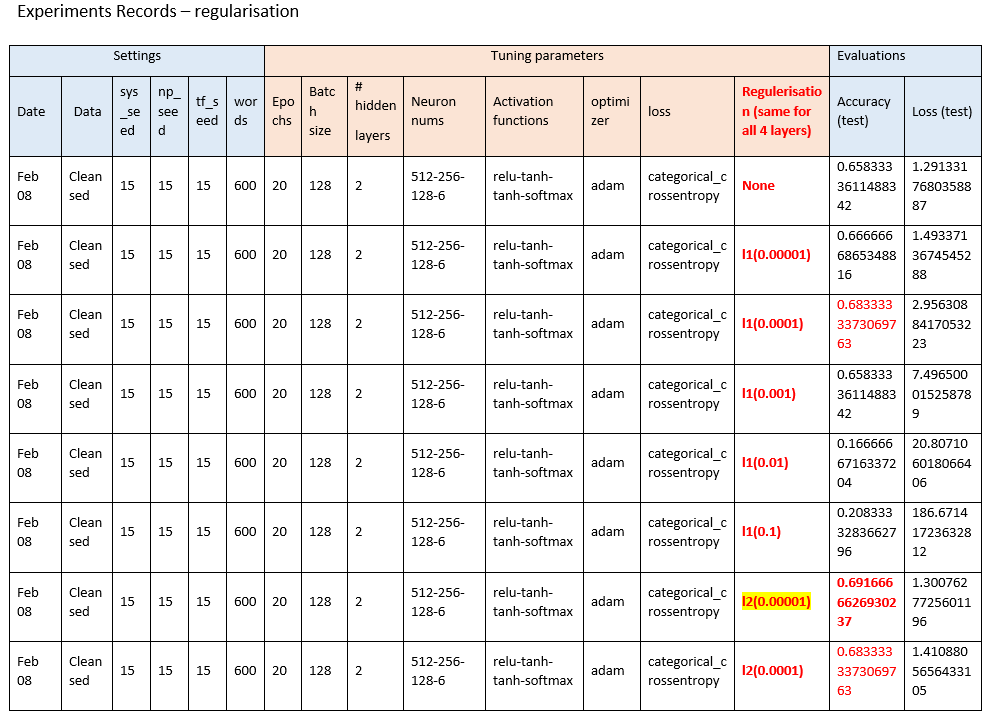

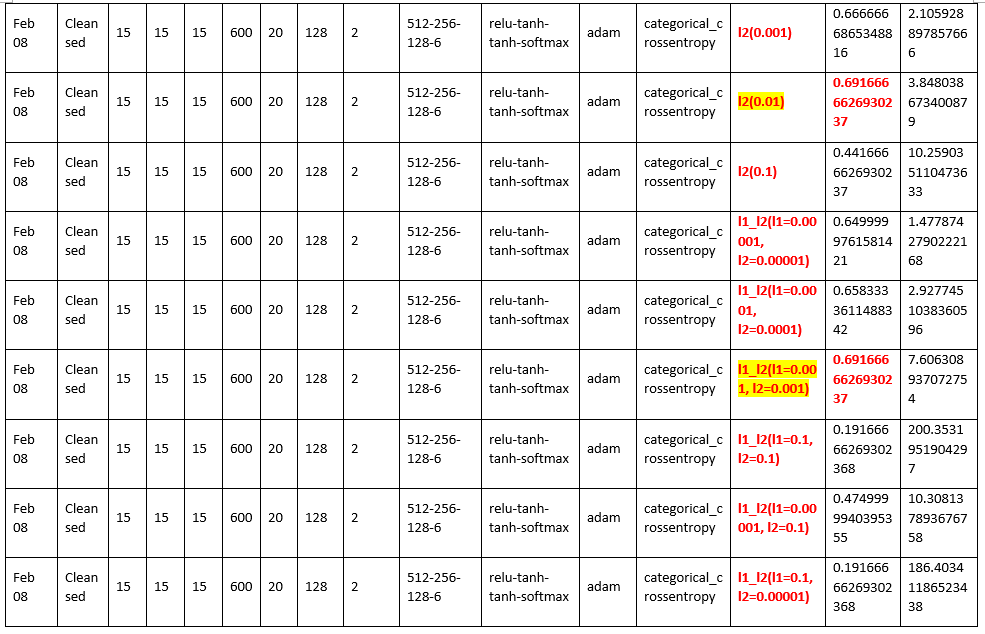

(Feb 08) We find that, there are three sets of regularizers perform the best, with test accuracy of 0.6916666626930237. They are: 

    all layers use l2(0.00001)
    
    all layers use l2(0.01)
    
    all layers use l1_l2(l1=0.001, l2=0.001)
    
 Notice that we should never use l1(0.01) or l1(0.1) or l1_l2(l1=0.1, l2=0.1) or l1_l2(l1=0.1, l2=0.00001) in all layers. L2 can be allowed to be big, but l1 can never be big. 


## Grid Search with GridsearchCV

Grid Search is a bruteforce method to search in a settled range for the best performing hyperparameters. It will loop through and execute every experiment settled in the searching grid. 

GridSearchCV is a method provided by Sci-Kit Learn. 

In [78]:
# Set the random seeds, to prevent from different results when each time running, and to control one 
# of the variables. 
import random
random.seed(15)
np.random.seed(15)
tf.random.set_seed(15)

### Try a Basic Model

In [103]:
def my_model(): 
    '''     Define a model for GridSearchCV to process
    
    Parameters: -
    
    Returns: a Neural Network model
    
    '''
        
    # train the model: 
    model = models.Sequential()
    # just pick any parameters here to control the other variables: 
    model.add(layers.Dense(64, activation = 'relu', input_shape = (600,)))
    model.add(layers.Dense(128, activation = 'relu'))
    model.add(layers.Dense(128, activation = 'relu'))
    model.add(layers.Dense(6, activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    return model
    

In [109]:
from sklearn.model_selection import GridSearchCV
# from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
import scikeras
from scikeras.wrappers import KerasClassifier, KerasRegressor

# SciKeras renamed the constructor argument build_fn to model
classifier = KerasClassifier(model = my_model)

# hyperparameters: 
hyperparameters = {
#     'neuron_num': [64, 128], 
#     'activation_func': ['relu', 'tanh'], 
    'batch_size': [64, 128, 256, 512], 
    'epochs': [10, 20, 40], 
    'optimizer': ['adam', 'rmsprop']    
}


In [110]:
# train-validation splitting: 
from sklearn.model_selection import train_test_split
# this time I use the cleansed dataset
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

grid_search_trial = GridSearchCV(estimator = classifier, param_grid = hyperparameters, scoring = 'accuracy', cv = 5)
# In sklearn, any machine learning model is an estimator. estimator.get_params()
grid_search_trial.get_params()

{'cv': 5,
 'error_score': nan,
 'estimator__model': <function __main__.my_model()>,
 'estimator__build_fn': None,
 'estimator__warm_start': False,
 'estimator__random_state': None,
 'estimator__optimizer': 'rmsprop',
 'estimator__loss': None,
 'estimator__metrics': None,
 'estimator__batch_size': None,
 'estimator__validation_batch_size': None,
 'estimator__verbose': 1,
 'estimator__callbacks': None,
 'estimator__validation_split': 0.0,
 'estimator__shuffle': True,
 'estimator__run_eagerly': False,
 'estimator__epochs': 1,
 'estimator__class_weight': None,
 'estimator': KerasClassifier(
 	model=<function my_model at 0x00000000472F3160>
 	build_fn=None
 	warm_start=False
 	random_state=None
 	optimizer=rmsprop
 	loss=None
 	metrics=None
 	batch_size=None
 	validation_batch_size=None
 	verbose=1
 	callbacks=None
 	validation_split=0.0
 	shuffle=True
 	run_eagerly=False
 	epochs=1
 	class_weight=None
 ),
 'n_jobs': None,
 'param_grid': {'batch_size': [64, 128, 256, 512],
  'epochs': [10, 

In [111]:
# run on Feb 01
grid_search_fit = grid_search_trial.fit(X_train_partial2, Y_train_partial2, verbose=0, validation_data=(X_val2, Y_val2))

best_parameters = grid_search_fit.best_params_
best_score = grid_search_fit.best_score_


1/1 [==============================] - 0s 47ms/step


In [112]:
print("Best hyperparameters are: " + str(best_parameters), "Best score is: ", best_score)

Best hyperparameters are: {'batch_size': 64, 'epochs': 40, 'optimizer': 'rmsprop'} Best score is:  0.596308954203691


In [114]:
means = grid_search_fit.cv_results_['mean_test_score']
stds = grid_search_fit.cv_results_['std_test_score']
params = grid_search_fit.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

0.554545 (0.042995) with: {'batch_size': 64, 'epochs': 10, 'optimizer': 'adam'}
0.544327 (0.042048) with: {'batch_size': 64, 'epochs': 10, 'optimizer': 'rmsprop'}
0.578025 (0.040972) with: {'batch_size': 64, 'epochs': 20, 'optimizer': 'adam'}
0.559809 (0.022542) with: {'batch_size': 64, 'epochs': 20, 'optimizer': 'rmsprop'}
0.562577 (0.075103) with: {'batch_size': 64, 'epochs': 40, 'optimizer': 'adam'}
0.596309 (0.032329) with: {'batch_size': 64, 'epochs': 40, 'optimizer': 'rmsprop'}
0.500103 (0.062618) with: {'batch_size': 128, 'epochs': 10, 'optimizer': 'adam'}
0.518250 (0.038188) with: {'batch_size': 128, 'epochs': 10, 'optimizer': 'rmsprop'}
0.562303 (0.061178) with: {'batch_size': 128, 'epochs': 20, 'optimizer': 'adam'}
0.549453 (0.013913) with: {'batch_size': 128, 'epochs': 20, 'optimizer': 'rmsprop'}
0.533869 (0.024800) with: {'batch_size': 128, 'epochs': 40, 'optimizer': 'adam'}
0.531271 (0.030318) with: {'batch_size': 128, 'epochs': 40, 'optimizer': 'rmsprop'}
0.479187 (0.0390

The above result is run on Feb 01. We see that the GridSearchCV can store the result and details for each experiment. 

### Try to Grid Search for Hyperparameters

In [68]:
def my_model2(act_func, neuron_num1, neuron_num2, loss_f, layers_num): 
    '''     Define a model for GridSearchCV to process
    
    Parameters: 
      act_func - a string, the activation function
      neuron_num1 - an integer, the neuron number for the input layer
      neuron_num2 - an integer, the neuron number for each of the hidden layer, here I set all hidden layers have the same neuron number
      loss_f - a string, the loss function
      layers_num - an integer, the number of layers excluding the output layer
    
    Returns: a Neural Network model
    
    '''
    
    # train the model: 
    model = models.Sequential()
    # just pick any parameters here to control the other variables: 
    model.add(layers.Dense(neuron_num1, activation = act_func, input_shape = (600,)))
    model.add(layers.Dense(neuron_num2, activation =act_func))
    model.add(layers.Dense(neuron_num2, activation =act_func))
    model.add(layers.Dense(6, activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = loss_f, metrics = ['accuracy'])
    
    return model

In [78]:
from sklearn.model_selection import GridSearchCV
# from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
import scikeras
from scikeras.wrappers import KerasClassifier, KerasRegressor

# SciKeras renamed the constructor argument build_fn to model
classifier2 = KerasClassifier(model = my_model2, act_func='relu', neuron_num1=32, 
                              neuron_num2=128, loss_f='categorical_crossentropy', 
                             layers_num=3)

# hyperparameters: 
hyperparameters2 = {
    'neuron_num1': [32, 64], 
    'neuron_num2': [128, 256, 512], 
    'act_func': ['relu', 'tanh', 'sigmoid', 'selu'], 
    'batch_size': [64, 128, 256, 512], 
    'epochs': [20, 40, 70], 
    'loss_f': ['categorical_crossentropy', 'mean_absolute_error'], 
    'optimizer': ['adam', 'rmsprop', 'sgd', 'adagrad']    
}


In [79]:
# train-validation splitting: 
from sklearn.model_selection import train_test_split
# this time I use the cleansed dataset
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

grid_search_trial2 = GridSearchCV(estimator = classifier2, param_grid = hyperparameters2, scoring = 'accuracy', cv = 2)
# In sklearn, any machine learning model is an estimator. estimator.get_params()

In [81]:
# run on Feb 01
grid_search_fit2 = grid_search_trial2.fit(X_train_partial2, Y_train_partial2, verbose=0, validation_data=(X_val2, Y_val2))

best_parameters2 = grid_search_fi2t.best_params_
best_score2 = grid_search_fit2.best_score_

print("Best hyperparameters are: " + str(best_parameters2), "Best score is: ", best_score2)

2/2 [==============================] - 0s 0s/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 31ms/step


3/3 [==============================] - 0s 8ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


3/3 [==============================] - 0s 0s/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


3/3 [==============================] - 0s 0s/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 31ms/step


NameError: name 'grid_search_fi2t' is not defined

In [82]:
best_parameters2 = grid_search_fit2.best_params_
best_score2 = grid_search_fit2.best_score_

print("Best hyperparameters are: " + str(best_parameters2), "Best score is: ", best_score2)

Best hyperparameters are: {'act_func': 'tanh', 'batch_size': 256, 'epochs': 20, 'loss_f': 'mean_absolute_error', 'neuron_num1': 64, 'neuron_num2': 128, 'optimizer': 'rmsprop'} Best score is:  0.5520833333333333


We see the best performing model searched only has an accuracy = 0.552, which is enough to beat the commonsense baseline, but cannot win the best-performing FNN that I have found. 

### Another Experiment to Grid Search for Hyperparameters

In [83]:
# Feb 02
def my_model3(act_func, neuron_num1, neuron_num2, num_layers, loss_f, layers_num): 
     '''     Define a model for GridSearchCV to process
    
    Parameters: 
      act_func - a string, the activation function
      neuron_num1 - an integer, the neuron number for the input layer
      neuron_num2 - an integer, the neuron number for each of the hidden layer, here I set all hidden layers have the same neuron number
      loss_f - a string, the loss function
      layers_num - an integer, the number of layers excluding the output layer
    
    Returns: a Neural Network model
    
    '''
        
    # train the model: 
    model = models.Sequential()
    # just pick any parameters here to control the other variables: 
    model.add(layers.Dense(neuron_num1, activation = act_func, input_shape = (600,)))
    
    # append identical inner layers: 
    i = 0 
    while i < num_layers: 
        model.add(layers.Dense(neuron_num2, activation =act_func))
        i += 1 
    
    # the output layer: 
    model.add(layers.Dense(6, activation = 'softmax'))  # must be 6 categories, should use softmax
    model.compile(optimizer = 'adam', loss = loss_f, metrics = ['accuracy'])
    
    return model

In [84]:
from sklearn.model_selection import GridSearchCV
# from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
import scikeras
from scikeras.wrappers import KerasClassifier, KerasRegressor

# SciKeras renamed the constructor argument build_fn to model
classifier3 = KerasClassifier(model = my_model3, act_func='relu', neuron_num1=32, 
                              neuron_num2=128, num_layers=0, loss_f='categorical_crossentropy', 
                             layers_num=3)

# hyperparameters: 
hyperparameters3 = {
    'neuron_num1': [32, 64], 
    'neuron_num2': [128, 256, 512], 
    'num_layers': [0, 1, 2, 3], 
    'act_func': ['relu', 'tanh', 'selu'], 
    'batch_size': [128, 256, 512], 
    'epochs': [20, 40, 60], 
    'loss_f': ['categorical_crossentropy', 'mean_absolute_error'], 
    'optimizer': ['adam', 'rmsprop', 'adamax']    
}

In [85]:
# train-validation splitting: 
from sklearn.model_selection import train_test_split
# this time I use the cleansed dataset
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

grid_search_trial3 = GridSearchCV(estimator = classifier3, param_grid = hyperparameters3, scoring = 'accuracy', cv = 2)
# In sklearn, any machine learning model is an estimator. estimator.get_params()

In [87]:
# run on Feb 02
grid_search_fit3 = grid_search_trial3.fit(X_train_partial2, Y_train_partial2, verbose=0, validation_data=(X_val2, Y_val2))

best_parameters3 = grid_search_fit3.best_params_
best_score3 = grid_search_fit3.best_score_

print("Best hyperparameters are: " + str(best_parameters3), "Best score is: ", best_score3)

2/2 [==============================] - 0s 16ms/step


Exception ignored in: <function UniquePtr.__del__ at 0x0000000037E55B80>
Traceback (most recent call last):
  File "c:\python\python38\lib\site-packages\tensorflow\python\framework\c_api_util.py", line 71, in __del__
    obj = self._obj
AttributeError: _obj


2/2 [==============================] - 0s 0s/step


2/2 [==============================] - 0s 0s/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


2/2 [==============================] - 0s 0s/step


2/2 [==============================] - 0s 0s/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


2/2 [==============================] - 0s 0s/step


2/2 [==============================] - 0s 0s/step


2/2 [==============================] - 0s 0s/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 62ms/step
Best hyperparameters are: {'act_func': 'relu', 'batch_size': 256, 'epochs': 60, 'loss_f': 'mean_absolute_error', 'neuron_num1': 64, 'neuron_num2': 256, 'num_layers': 0, 'optimizer': 'adam'} Best score is:  0.5625


In this experiment, Best hyperparameters are: {'act_func': 'relu', 'batch_size': 256, 'epochs': 60, 'loss_f': 'mean_absolute_error', 'neuron_num1': 64, 'neuron_num2': 256, 'num_layers': 0, 'optimizer': 'adam'} Best score is:  0.5625

We see this accuracy is exceeding much from the baseline, but cannot beat the best-performing FNN model that I have found. 

In [96]:
! nnictl hello

A hyperparameter optimization example has been created at "nni_hello_hpo" directory.
Please run "python nni_hello_hpo/main.py" to try it out.


## Repetition of the Best Performing Feed-Forward Neural Network Model(s)

### 1. 
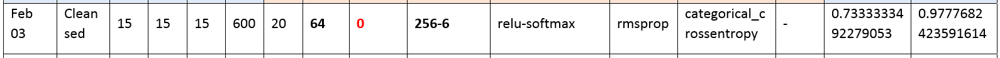

In [183]:
# We may firstly set a big epoch number, then adjust it; or we can just use the settled epoch number shown in my experiment, 
# since that epoch number is also what I have adjusted. Here I use the epoch number settled in my experiment directly. 
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high01 = models.Sequential()
model_high01.add(layers.Dense(256, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high01.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high01.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high01 = model_high01.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=64,
                    epochs=20,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))
history_dict = history_high01.history
history_dict.keys()

Epoch 1/20
6/6 [==============================] - 0s 27ms/step - loss: 1.6201 - accuracy: 0.3255 - val_loss: 1.4866 - val_accuracy: 0.4688
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1.0439 - accuracy: 0.6953 - val_loss: 1.1785 - val_accuracy: 0.5625
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 0.8200 - accuracy: 0.7708 - val_loss: 1.0669 - val_accuracy: 0.5938
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 0.6331 - accuracy: 0.8750 - val_loss: 1.0601 - val_accuracy: 0.5938
Epoch 5/20
6/6 [==============================] - 0s 6ms/step - loss: 0.5262 - accuracy: 0.9089 - val_loss: 1.0169 - val_accuracy: 0.5833
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 0.4226 - accuracy: 0.9453 - val_loss: 0.9748 - val_accuracy: 0.6146
Epoch 7/20
6/6 [==============================] - 0s 6ms/step - loss: 0.3533 - accuracy: 0.9505 - val_loss: 1.0783 - val_accuracy: 0.6250
Epoch 8/20
6/6 [=================

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

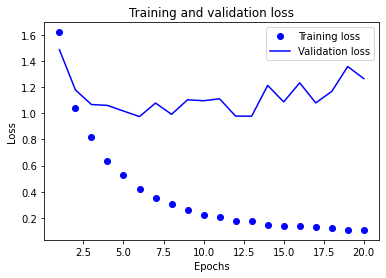

In [184]:
draw_train_val_loss_plot(history_high01)

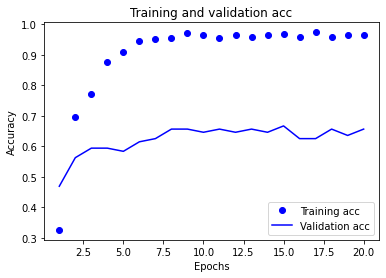

In [185]:
draw_train_val_acc(history_high01)

As at epoch=20, there is not obvious rising up on the validation loss curve, and no obvious decreasing on the validation accuracy curve, we can say that it is not overfitting yet. Of course there is a small rising up of the loss when epoch=14, but if we settle epoch=14, we will find an immature result in the training set because the test set accuracy is not high. Therefore, we just use epoch=20. 

In [186]:
# see the performance in the test set: 
results_high01 = model_high01.evaluate(X_test2, Y_test2)
results_high01

4/4 [==============================] - 0s 2ms/step - loss: 1.0253 - accuracy: 0.7083


[1.0253456830978394, 0.7083333134651184]

In [187]:
pred_high01 = model_high01.predict(X_test2)  # Let's get the predicted labels in one-hot arrays
pred_labels_high01 = np.argmax(pred_high01, axis = 1)  # these are the predicted labels for the test set. 

4/4 [==============================] - 0s 1ms/step


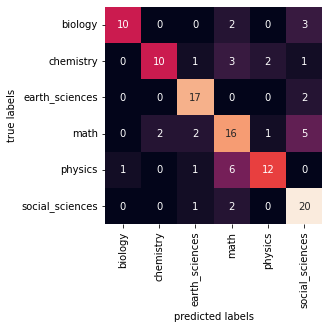

In [188]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_high01 = confusion_matrix(Y_test2.argmax(axis=1), pred_labels_high01)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_high01, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

We see from the limited mistakes, our model tends to classify other categories wrongly as math or social sciences. Overall the colour of the diagnal line and those of the other cells are distinct enough, and therefore this model performs well. 

In [189]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels_high01, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.91      0.67      0.77        15
      chemistry       0.83      0.59      0.69        17
 earth_sciences       0.77      0.89      0.83        19
           math       0.55      0.62      0.58        26
        physics       0.80      0.60      0.69        20
social_sciences       0.65      0.87      0.74        23

       accuracy                           0.71       120
      macro avg       0.75      0.71      0.72       120
   weighted avg       0.73      0.71      0.71       120



C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


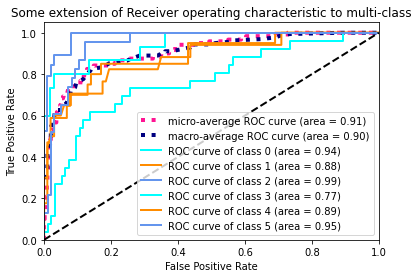

In [190]:
draw_ROC(6, Y_test2, pred_high01)

From the ROC curve above, we see that the avg AUC can achieve 0.91 or 0.90, which is a very high score. The statistical meaning is: given one positive sample and one negative sample, under 91% or 90% cases, the model will score higher for the positive sample than the negative sample.

It means that this model has achieved a very outstanding result in my specific classification task, and it means that just with some slight fine-tunings, this model can be widely adapted by other users.

In [119]:
# Feb 28, using K-Fold Cross Validation to rerun this model

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    num_words_input = 600
    model_high01 = models.Sequential()
    model_high01.add(layers.Dense(256, activation = 'relu', input_shape = (num_words_input, ))) # input 600
    model_high01.add(layers.Dense(6, activation = 'softmax'))
    # Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
    # activation function. 

    model_high01.compile(optimizer = 'rmsprop', 
                loss = 'categorical_crossentropy', 
                # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
                # because 'It minimizes the distance between the probability distributions output by 
                # the model and the true distribution of the targets'. 
                metrics = ['accuracy'])

    history_high01 = model_high01.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=64, # set a fixed batch size
                                epochs=20,  # we just set any fixed number for control
                                )
    scores = model_high01.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_high01.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

Epoch 1/20
7/7 [==============================] - 0s 3ms/step - loss: 1.6389 - accuracy: 0.3542
Epoch 2/20
7/7 [==============================] - 0s 3ms/step - loss: 1.0168 - accuracy: 0.7060
Epoch 3/20
7/7 [==============================] - 0s 2ms/step - loss: 0.7972 - accuracy: 0.7963
Epoch 4/20
7/7 [==============================] - 0s 3ms/step - loss: 0.6212 - accuracy: 0.8611
Epoch 5/20
7/7 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.9282
Epoch 6/20
7/7 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.9375
Epoch 7/20
7/7 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.9606
Epoch 8/20
7/7 [==============================] - 0s 2ms/step - loss: 0.2823 - accuracy: 0.9560
Epoch 9/20
7/7 [==============================] - 0s 2ms/step - loss: 0.2383 - accuracy: 0.9606
Epoch 10/20
7/7 [==============================] - 0s 2ms/step - loss: 0.2104 - accuracy: 0.9606
Epoch 11/20
7/7 [======================

7/7 [==============================] - 0s 3ms/step - loss: 0.2456 - accuracy: 0.9583
Epoch 10/20
7/7 [==============================] - 0s 3ms/step - loss: 0.2072 - accuracy: 0.9468
Epoch 11/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1812 - accuracy: 0.9583
Epoch 12/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1759 - accuracy: 0.9537
Epoch 13/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1537 - accuracy: 0.9583
Epoch 14/20
7/7 [==============================] - 0s 2ms/step - loss: 0.1383 - accuracy: 0.9606
Epoch 15/20
7/7 [==============================] - 0s 2ms/step - loss: 0.1287 - accuracy: 0.9606
Epoch 16/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1219 - accuracy: 0.9537
Epoch 17/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1183 - accuracy: 0.9537
Epoch 18/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1202 - accuracy: 0.9560
Epoch 19/20
7/7 [=========================

In [120]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

60.63% (+/- 4.79%)


Although it can achieve test set accuracy=0.733 on the hold-out set, it only achieves an average validation accuracy=0.606 using 10-fold cross validation, but it is still a good model. 

In [250]:
# what if we add some Dropout layers to improve the performance on the test set? 
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high01 = models.Sequential()
model_high01.add(layers.Dense(256, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high01.add(layers.Dropout(0.3))
model_high01.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high01.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high01 = model_high01.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=64,
                    epochs=20,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))
history_dict = history_high01.history
history_dict.keys()

Epoch 1/20
6/6 [==============================] - 0s 24ms/step - loss: 1.6804 - accuracy: 0.3203 - val_loss: 1.5111 - val_accuracy: 0.4583
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1.1389 - accuracy: 0.6484 - val_loss: 1.2550 - val_accuracy: 0.5625
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 0.8925 - accuracy: 0.7839 - val_loss: 1.1506 - val_accuracy: 0.5208
Epoch 4/20
6/6 [==============================] - 0s 6ms/step - loss: 0.7453 - accuracy: 0.8125 - val_loss: 1.1491 - val_accuracy: 0.5729
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 0.6487 - accuracy: 0.8542 - val_loss: 1.1093 - val_accuracy: 0.5729
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 0.5440 - accuracy: 0.8802 - val_loss: 1.0607 - val_accuracy: 0.5833
Epoch 7/20
6/6 [==============================] - 0s 7ms/step - loss: 0.4488 - accuracy: 0.9193 - val_loss: 1.1477 - val_accuracy: 0.6250
Epoch 8/20
6/6 [=================

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [251]:
# see the performance in the test set: 
results_high01 = model_high01.evaluate(X_test2, Y_test2)
results_high01

4/4 [==============================] - 0s 2ms/step - loss: 1.0336 - accuracy: 0.7083


[1.033578872680664, 0.7083333134651184]

The overall accuracy on the test set of 0.708 is a brilliant result, though it is not much improved from the not-droppedout version (a little bit lower). 

In [252]:
pred_high01 = model_high01.predict(X_test2)  # Let's get the predicted labels in one-hot arrays
pred_labels_high01 = np.argmax(pred_high01, axis = 1)  # these are the predicted labels for the test set. 

4/4 [==============================] - 0s 1ms/step


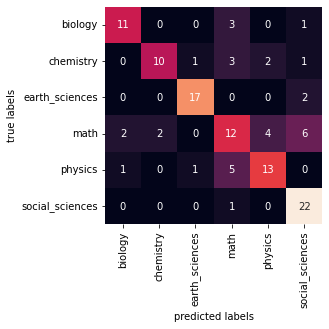

In [253]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_high01 = confusion_matrix(Y_test2.argmax(axis=1), pred_labels_high01)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_high01, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

Still, math is the most difficult category for our model to classify. Either it mis-classify math as other subjects, or other subjects are wrongly identified as math. Overall this model performs well. 

In [254]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels_high01, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.79      0.73      0.76        15
      chemistry       0.83      0.59      0.69        17
 earth_sciences       0.89      0.89      0.89        19
           math       0.50      0.46      0.48        26
        physics       0.68      0.65      0.67        20
social_sciences       0.69      0.96      0.80        23

       accuracy                           0.71       120
      macro avg       0.73      0.71      0.71       120
   weighted avg       0.71      0.71      0.70       120



Although we cannot repeat the exact outcome scores as in the experiment, this accuracy of 0.70 is acceptable. We see the math has a low recall score of 0.46, which means our model cannot find all the math-labelled articles completely. 

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


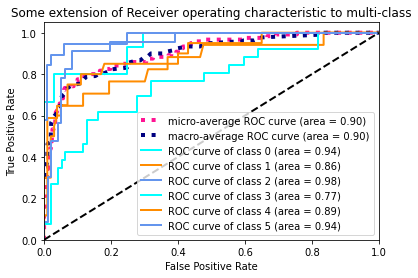

In [255]:
draw_ROC(6, Y_test2, pred_high01)

From the ROC curve above, we see that the avg AUC can achieve 0.90, which is a very high score. The statistical meaning is: given one positive sample and one negative sample, under 90% cases, the model will score higher for the positive sample than the negative sample.

It means that this model has achieved a very outstanding result in my specific classification task, and it means that just with some slight fine-tunings, this model can be widely adapted by other users.

Just notice that the AUC of class 3 (math) is only 0.77, which means on this category, the model cannot classify well, but is acceptable though. This has the same finding as what we see in the heatmap. 

In [121]:
# Feb 28, using K-Fold Cross Validation to rerun this added-dropout model

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    num_words_input = 600
    model_high01 = models.Sequential()
    model_high01.add(layers.Dense(256, activation = 'relu', input_shape = (num_words_input, ))) # input 600
    model_high01.add(layers.Dropout(0.3))
    model_high01.add(layers.Dense(6, activation = 'softmax'))
    # Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
    # activation function. 

    model_high01.compile(optimizer = 'rmsprop', 
                loss = 'categorical_crossentropy', 
                # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
                # because 'It minimizes the distance between the probability distributions output by 
                # the model and the true distribution of the targets'. 
                metrics = ['accuracy'])

    history_high01 = model_high01.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=64, # set a fixed batch size
                                epochs=20,  # we just set any fixed number for control
                                )
    scores = model_high01.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_high01.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval


Epoch 1/20
7/7 [==============================] - 0s 3ms/step - loss: 1.7208 - accuracy: 0.2894
Epoch 2/20
7/7 [==============================] - 0s 3ms/step - loss: 1.1361 - accuracy: 0.6250
Epoch 3/20
7/7 [==============================] - 0s 3ms/step - loss: 0.8936 - accuracy: 0.7454
Epoch 4/20
7/7 [==============================] - 0s 4ms/step - loss: 0.7105 - accuracy: 0.8333
Epoch 5/20
7/7 [==============================] - 0s 3ms/step - loss: 0.6252 - accuracy: 0.8519
Epoch 6/20
7/7 [==============================] - 0s 3ms/step - loss: 0.4957 - accuracy: 0.8958
Epoch 7/20
7/7 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.8912
Epoch 8/20
7/7 [==============================] - 0s 4ms/step - loss: 0.3835 - accuracy: 0.9306
Epoch 9/20
7/7 [==============================] - 0s 3ms/step - loss: 0.3131 - accuracy: 0.9468
Epoch 10/20
7/7 [==============================] - 0s 3ms/step - loss: 0.2813 - accuracy: 0.9537
Epoch 11/20
7/7 [======================

7/7 [==============================] - 0s 3ms/step - loss: 0.3252 - accuracy: 0.9421
Epoch 10/20
7/7 [==============================] - 0s 3ms/step - loss: 0.2760 - accuracy: 0.9398
Epoch 11/20
7/7 [==============================] - 0s 3ms/step - loss: 0.2475 - accuracy: 0.9583
Epoch 12/20
7/7 [==============================] - 0s 3ms/step - loss: 0.2168 - accuracy: 0.9630
Epoch 13/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1990 - accuracy: 0.9491
Epoch 14/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1845 - accuracy: 0.9583
Epoch 15/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1523 - accuracy: 0.9583
Epoch 16/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1484 - accuracy: 0.9583
Epoch 17/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1338 - accuracy: 0.9630
Epoch 18/20
7/7 [==============================] - 0s 3ms/step - loss: 0.1300 - accuracy: 0.9606
Epoch 19/20
7/7 [=========================

In [122]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

63.54% (+/- 6.67%)


We can see that, although the hold-out method has a similar result, using k-fold has apparently increased this model's performance. K-fold method is in fact a more convincing method, because it has utilised the dataset fully and can get an average result in different data samples. It can be demonstrated that, Dropout layers can indeed improve the generalisation ability of the same model. 

### 2. 
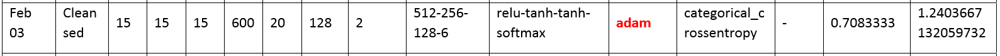

In [192]:
# Firstly, develop an overfitting model, then adjust the epoch number
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high02 = models.Sequential()
model_high02.add(layers.Dense(512, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high02.add(layers.Dense(256, activation = 'tanh')) 
model_high02.add(layers.Dense(128, activation = 'tanh')) 
model_high02.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high02.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high02 = model_high02.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=128,
                    epochs=40,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))
history_dict = history_high02.history
history_dict.keys()

Epoch 1/40
3/3 [==============================] - 1s 72ms/step - loss: 2.3792 - accuracy: 0.2318 - val_loss: 2.1645 - val_accuracy: 0.3229
Epoch 2/40
3/3 [==============================] - 0s 24ms/step - loss: 1.5897 - accuracy: 0.4505 - val_loss: 1.1907 - val_accuracy: 0.5729
Epoch 3/40
3/3 [==============================] - 0s 17ms/step - loss: 0.9455 - accuracy: 0.7474 - val_loss: 1.2577 - val_accuracy: 0.5000
Epoch 4/40
3/3 [==============================] - 0s 18ms/step - loss: 0.7356 - accuracy: 0.7630 - val_loss: 1.1361 - val_accuracy: 0.6146
Epoch 5/40
3/3 [==============================] - 0s 18ms/step - loss: 0.5539 - accuracy: 0.8542 - val_loss: 1.0856 - val_accuracy: 0.5729
Epoch 6/40
3/3 [==============================] - 0s 18ms/step - loss: 0.4058 - accuracy: 0.9115 - val_loss: 0.9283 - val_accuracy: 0.6562
Epoch 7/40
3/3 [==============================] - 0s 16ms/step - loss: 0.2693 - accuracy: 0.9583 - val_loss: 1.3408 - val_accuracy: 0.5625
Epoch 8/40
3/3 [===========

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

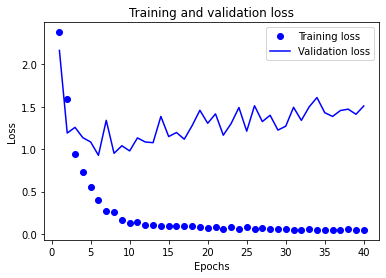

In [193]:
draw_train_val_loss_plot(history_high02)

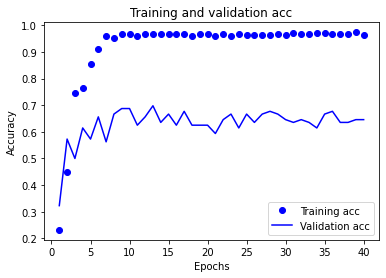

In [194]:
draw_train_val_acc(history_high02)

It is reasonable to choose the epoch=20, since when epoch=20, the validation accuracy is 0.6250 and the validation loss is 1.3059, while when epoch=21, the validation accuracy drops down quickly to 0.5938, and the validation loss rises to 1.4166. I have also tried to set the epoch=10 or 13 based on the validation accuracy and loss plots, but these numbers are too small to train my model fully and thus we get low accuracy on the test set. Now we just set epoch=20, and rerun the model. 

In [203]:
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high02 = models.Sequential()
model_high02.add(layers.Dense(512, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high02.add(layers.Dense(256, activation = 'tanh')) 
model_high02.add(layers.Dense(128, activation = 'tanh')) 
model_high02.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high02.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high02 = model_high02.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=128,
                    epochs=20,  
                    validation_data=(X_val2, Y_val2))
history_dict = history_high02.history
history_dict.keys()

Epoch 1/20
3/3 [==============================] - 1s 73ms/step - loss: 2.5568 - accuracy: 0.2057 - val_loss: 2.7006 - val_accuracy: 0.2917
Epoch 2/20
3/3 [==============================] - 0s 18ms/step - loss: 1.5953 - accuracy: 0.4714 - val_loss: 1.4560 - val_accuracy: 0.4792
Epoch 3/20
3/3 [==============================] - 0s 17ms/step - loss: 1.0661 - accuracy: 0.6068 - val_loss: 1.0958 - val_accuracy: 0.5729
Epoch 4/20
3/3 [==============================] - 0s 17ms/step - loss: 0.7162 - accuracy: 0.8307 - val_loss: 1.0841 - val_accuracy: 0.6250
Epoch 5/20
3/3 [==============================] - 0s 16ms/step - loss: 0.5525 - accuracy: 0.8698 - val_loss: 1.0667 - val_accuracy: 0.5729
Epoch 6/20
3/3 [==============================] - 0s 18ms/step - loss: 0.5350 - accuracy: 0.8542 - val_loss: 1.4944 - val_accuracy: 0.4688
Epoch 7/20
3/3 [==============================] - 0s 18ms/step - loss: 0.4529 - accuracy: 0.8776 - val_loss: 1.0101 - val_accuracy: 0.6146
Epoch 8/20
3/3 [===========

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

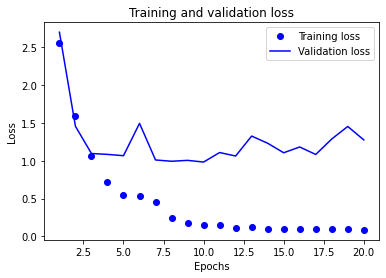

In [204]:
draw_train_val_loss_plot(history_high02)

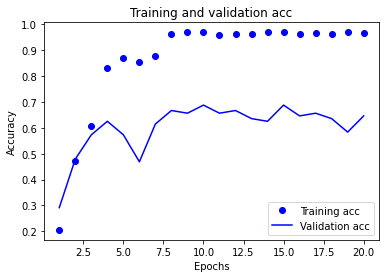

In [205]:
draw_train_val_acc(history_high02)

In [206]:
# see the performance in the test set: 
results_high02 = model_high02.evaluate(X_test2, Y_test2)
results_high02

4/4 [==============================] - 0s 2ms/step - loss: 0.9932 - accuracy: 0.6833


[0.9932346343994141, 0.6833333373069763]

In [207]:
pred_high02 = model_high02.predict(X_test2)  # Let's get the predicted labels. 
pred_labels_high02 = np.argmax(pred_high02, axis = 1)  # these are the predicted labels for the test set. 

4/4 [==============================] - 0s 2ms/step


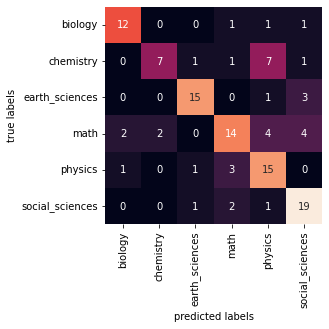

In [208]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_high02 = confusion_matrix(Y_test2.argmax(axis=1), pred_labels_high02)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_high02, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');


In [209]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels_high02, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.80      0.80      0.80        15
      chemistry       0.78      0.41      0.54        17
 earth_sciences       0.83      0.79      0.81        19
           math       0.67      0.54      0.60        26
        physics       0.52      0.75      0.61        20
social_sciences       0.68      0.83      0.75        23

       accuracy                           0.68       120
      macro avg       0.71      0.69      0.68       120
   weighted avg       0.70      0.68      0.68       120



C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


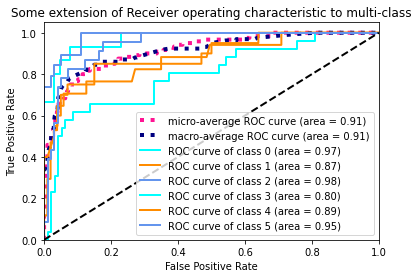

In [210]:
draw_ROC(6, Y_test2, pred_high02)

From the ROC curve above, we see that the avg AUC can achieve 0.91, which is a very high score. The statistical meaning is: given one positive sample and one negative sample, under 91% cases, the model will score higher for the positive sample than the negative sample. 

It means that this model has achieved a very outstanding result in my specific classification task, and it means that just with some slight fine-tunings, this model can be widely adapted by other users.

In [123]:
# Feb 28, using K-Fold Cross Validation to rerun this model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    num_words_input = 600
    model_high02 = models.Sequential()
    model_high02.add(layers.Dense(512, activation = 'relu', input_shape = (num_words_input, ))) # input 600
    model_high02.add(layers.Dense(256, activation = 'tanh')) 
    model_high02.add(layers.Dense(128, activation = 'tanh')) 
    model_high02.add(layers.Dense(6, activation = 'softmax'))
    # Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
    # activation function. 

    model_high02.compile(optimizer = 'rmsprop', 
                loss = 'categorical_crossentropy', 
                # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
                # because 'It minimizes the distance between the probability distributions output by 
                # the model and the true distribution of the targets'. 
                metrics = ['accuracy'])

    history_high02 = model_high02.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=128, # set a fixed batch size
                                epochs=20,  # we just set any fixed number for control
                                )
    scores = model_high02.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_high01.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval


Epoch 1/20
4/4 [==============================] - 0s 5ms/step - loss: 2.3071 - accuracy: 0.2338
Epoch 2/20
4/4 [==============================] - 0s 6ms/step - loss: 1.4109 - accuracy: 0.5093
Epoch 3/20
4/4 [==============================] - 0s 6ms/step - loss: 0.9137 - accuracy: 0.7153
Epoch 4/20
4/4 [==============================] - 0s 6ms/step - loss: 0.6329 - accuracy: 0.8287
Epoch 5/20
4/4 [==============================] - 0s 6ms/step - loss: 0.5850 - accuracy: 0.8148
Epoch 6/20
4/4 [==============================] - 0s 6ms/step - loss: 0.3452 - accuracy: 0.9190
Epoch 7/20
4/4 [==============================] - 0s 6ms/step - loss: 0.2205 - accuracy: 0.9606
Epoch 8/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1846 - accuracy: 0.9630
Epoch 9/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1547 - accuracy: 0.9630
Epoch 10/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1493 - accuracy: 0.9653
Epoch 11/20
4/4 [======================

4/4 [==============================] - 0s 6ms/step - loss: 0.1739 - accuracy: 0.9560
Epoch 10/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1199 - accuracy: 0.9606
Epoch 11/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1351 - accuracy: 0.9606
Epoch 12/20
4/4 [==============================] - 0s 6ms/step - loss: 0.2564 - accuracy: 0.9120
Epoch 13/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1288 - accuracy: 0.9606
Epoch 14/20
4/4 [==============================] - 0s 6ms/step - loss: 0.1020 - accuracy: 0.9630
Epoch 15/20
4/4 [==============================] - 0s 6ms/step - loss: 0.0974 - accuracy: 0.9653
Epoch 16/20
4/4 [==============================] - 0s 6ms/step - loss: 0.0912 - accuracy: 0.9583
Epoch 17/20
4/4 [==============================] - 0s 6ms/step - loss: 0.0905 - accuracy: 0.9630
Epoch 18/20
4/4 [==============================] - 0s 6ms/step - loss: 0.0912 - accuracy: 0.9630
Epoch 19/20
4/4 [=========================

In [124]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

60.21% (+/- 5.70%)


In [133]:
# Feb 28, what if we add some dropout layers? 
# using K-Fold Cross Validation to rerun this model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    num_words_input = 600
    model_high02 = models.Sequential()
    model_high02.add(layers.Dense(512, activation = 'relu', input_shape = (num_words_input, ))) # input 600
    model_high02.add(layers.Dropout(0.2)) 
    model_high02.add(layers.Dense(256, activation = 'tanh')) 
    model_high02.add(layers.Dropout(0.1))
    model_high02.add(layers.Dense(128, activation = 'tanh')) 
    model_high02.add(layers.Dense(6, activation = 'softmax'))
    # Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
    # activation function. 

    model_high02.compile(optimizer = 'rmsprop', 
                loss = 'categorical_crossentropy', 
                # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
                # because 'It minimizes the distance between the probability distributions output by 
                # the model and the true distribution of the targets'. 
                metrics = ['accuracy'])

    history_high02 = model_high02.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=128, # set a fixed batch size
                                epochs=20,  # we just set any fixed number for control
                                )
    scores = model_high02.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_high01.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

Epoch 1/20
4/4 [==============================] - 0s 9ms/step - loss: 2.4199 - accuracy: 0.2014
Epoch 2/20
4/4 [==============================] - 0s 7ms/step - loss: 1.3883 - accuracy: 0.5046
Epoch 3/20
4/4 [==============================] - 0s 7ms/step - loss: 0.9589 - accuracy: 0.7060
Epoch 4/20
4/4 [==============================] - 0s 7ms/step - loss: 0.7050 - accuracy: 0.8194
Epoch 5/20
4/4 [==============================] - 0s 7ms/step - loss: 0.5459 - accuracy: 0.8472
Epoch 6/20
4/4 [==============================] - 0s 7ms/step - loss: 0.3800 - accuracy: 0.9259
Epoch 7/20
4/4 [==============================] - 0s 8ms/step - loss: 0.3003 - accuracy: 0.9421
Epoch 8/20
4/4 [==============================] - 0s 7ms/step - loss: 0.3181 - accuracy: 0.8866
Epoch 9/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1912 - accuracy: 0.9537
Epoch 10/20
4/4 [==============================] - 0s 8ms/step - loss: 0.1444 - accuracy: 0.9699
Epoch 11/20
4/4 [======================

4/4 [==============================] - 0s 7ms/step - loss: 0.1803 - accuracy: 0.9606
Epoch 10/20
4/4 [==============================] - 0s 8ms/step - loss: 0.1303 - accuracy: 0.9630
Epoch 11/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1501 - accuracy: 0.9537
Epoch 12/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1583 - accuracy: 0.9514
Epoch 13/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1364 - accuracy: 0.9653
Epoch 14/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1190 - accuracy: 0.9699
Epoch 15/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1002 - accuracy: 0.9653
Epoch 16/20
4/4 [==============================] - 0s 7ms/step - loss: 0.0896 - accuracy: 0.9583
Epoch 17/20
4/4 [==============================] - 0s 7ms/step - loss: 0.1009 - accuracy: 0.9630
Epoch 18/20
4/4 [==============================] - 0s 7ms/step - loss: 0.0756 - accuracy: 0.9630
Epoch 19/20
4/4 [=========================

In [134]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

61.04% (+/- 6.85%)


### 3. 
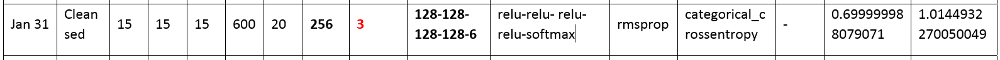

I will also try to add Dropout layers in between layers, to improve the performance on the test set. 

In [219]:
# Firstly, develop an overfitting model, then adjust the epoch number
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high03 = models.Sequential()
model_high03.add(layers.Dense(128, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.2)) 
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.1)) 
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.1))
model_high03.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high03.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high03 = model_high03.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=256,
                    epochs=40,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))
history_dict = history_high03.history
history_dict.keys()

Epoch 1/40
2/2 [==============================] - 1s 137ms/step - loss: 1.8010 - accuracy: 0.1745 - val_loss: 1.7412 - val_accuracy: 0.3646
Epoch 2/40
2/2 [==============================] - 0s 39ms/step - loss: 1.6995 - accuracy: 0.3906 - val_loss: 1.6268 - val_accuracy: 0.4167
Epoch 3/40
2/2 [==============================] - 0s 27ms/step - loss: 1.5628 - accuracy: 0.4688 - val_loss: 1.4948 - val_accuracy: 0.4688
Epoch 4/40
2/2 [==============================] - 0s 23ms/step - loss: 1.4332 - accuracy: 0.4635 - val_loss: 1.4250 - val_accuracy: 0.5000
Epoch 5/40
2/2 [==============================] - 0s 26ms/step - loss: 1.3481 - accuracy: 0.5182 - val_loss: 1.3433 - val_accuracy: 0.5000
Epoch 6/40
2/2 [==============================] - 0s 26ms/step - loss: 1.2424 - accuracy: 0.5573 - val_loss: 1.2953 - val_accuracy: 0.5417
Epoch 7/40
2/2 [==============================] - 0s 26ms/step - loss: 1.1227 - accuracy: 0.6146 - val_loss: 1.2499 - val_accuracy: 0.5521
Epoch 8/40
2/2 [==========

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

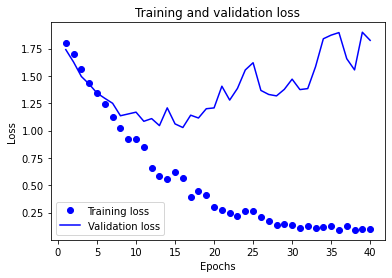

In [220]:
draw_train_val_loss_plot(history_high03)

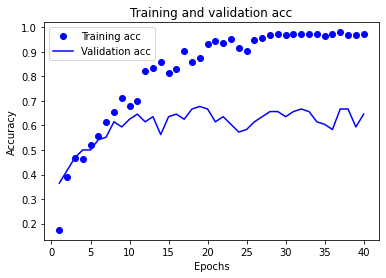

In [221]:
draw_train_val_acc(history_high03)

Now, it is reasonable to use epoch=20, because when epoch=20, the valdiation accuracy is 0.6667, and the validation loss is 1.2077, but when epoch=21, the validation accuracy drops down to 0.6146, and validation loss increases to 1.4061. 

In [222]:
from tensorflow.keras import models
from tensorflow.keras import layers

num_words_input = 600
model_high03 = models.Sequential()
model_high03.add(layers.Dense(128, activation = 'relu', input_shape = (num_words_input, ))) # input 600
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.2)) 
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.1)) 
model_high03.add(layers.Dense(128, activation = 'relu')) 
model_high03.add(layers.Dropout(0.1))
model_high03.add(layers.Dense(6, activation = 'softmax'))
# Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
# activation function. 

model_high03.compile(optimizer = 'rmsprop', 
              loss = 'categorical_crossentropy', 
              # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
              # because 'It minimizes the distance between the probability distributions output by 
              # the model and the true distribution of the targets'. 
              metrics = ['accuracy'])

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
    X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_high03 = model_high03.fit(X_train_partial2, 
                    Y_train_partial2,
                    batch_size=256,
                    epochs=20,  # we set a small epoch
                    validation_data=(X_val2, Y_val2))
history_dict = history_high03.history
history_dict.keys()

Epoch 1/20
2/2 [==============================] - 1s 165ms/step - loss: 1.8043 - accuracy: 0.1953 - val_loss: 1.7218 - val_accuracy: 0.3854
Epoch 2/20
2/2 [==============================] - 0s 27ms/step - loss: 1.6573 - accuracy: 0.3880 - val_loss: 1.5390 - val_accuracy: 0.4479
Epoch 3/20
2/2 [==============================] - 0s 30ms/step - loss: 1.5216 - accuracy: 0.4349 - val_loss: 1.4437 - val_accuracy: 0.3958
Epoch 4/20
2/2 [==============================] - 0s 25ms/step - loss: 1.4340 - accuracy: 0.4557 - val_loss: 1.3771 - val_accuracy: 0.4688
Epoch 5/20
2/2 [==============================] - 0s 24ms/step - loss: 1.2511 - accuracy: 0.5938 - val_loss: 1.2934 - val_accuracy: 0.4792
Epoch 6/20
2/2 [==============================] - 0s 26ms/step - loss: 1.1298 - accuracy: 0.6068 - val_loss: 1.2311 - val_accuracy: 0.5417
Epoch 7/20
2/2 [==============================] - 0s 25ms/step - loss: 0.9704 - accuracy: 0.7057 - val_loss: 1.1363 - val_accuracy: 0.5521
Epoch 8/20
2/2 [==========

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

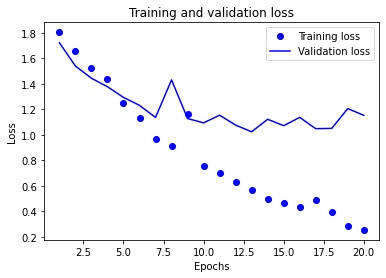

In [223]:
draw_train_val_loss_plot(history_high03)

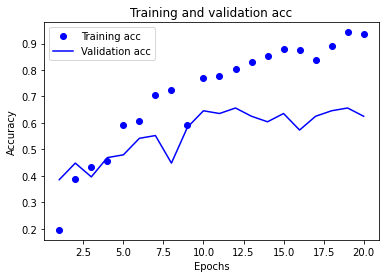

In [224]:
draw_train_val_acc(history_high03)

In [225]:
# see the performance in the test set: 
results_high03 = model_high03.evaluate(X_test2, Y_test2)
results_high03

4/4 [==============================] - 0s 2ms/step - loss: 1.0064 - accuracy: 0.7000


[1.0063551664352417, 0.699999988079071]

It is good to achieve the same accuracy on the test set as what we have experimented, though we have used Dropout layers, and are expecting it to perform even better. 

In [226]:
pred_high03 = model_high03.predict(X_test2)  # Let's get the predicted labels. 
pred_labels_high03 = np.argmax(pred_high03, axis = 1)  # these are the predicted labels for the test set. 

4/4 [==============================] - 0s 1ms/step


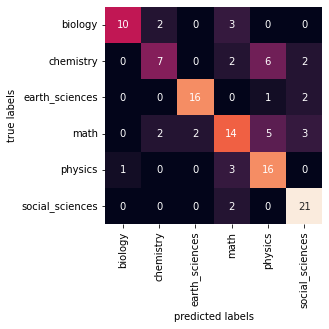

In [227]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_high03 = confusion_matrix(Y_test2.argmax(axis=1), pred_labels_high03)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_high03, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [228]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test2.argmax(axis=1), pred_labels_high03, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.91      0.67      0.77        15
      chemistry       0.64      0.41      0.50        17
 earth_sciences       0.89      0.84      0.86        19
           math       0.58      0.54      0.56        26
        physics       0.57      0.80      0.67        20
social_sciences       0.75      0.91      0.82        23

       accuracy                           0.70       120
      macro avg       0.72      0.70      0.70       120
   weighted avg       0.71      0.70      0.69       120



C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


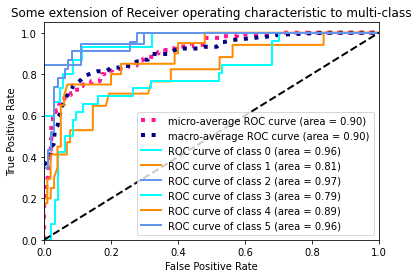

In [229]:
draw_ROC(6, Y_test2, pred_high03)

From the ROC curve above, we see that the avg AUC can achieve 0.90, which is a very high score. The statistical meaning is: given one positive sample and one negative sample, under 90% cases, the model will score higher for the positive sample than the negative sample. 

It means that this model has achieved a very outstanding result in my specific classification task, and it means that just with some slight fine-tunings, this model can be widely adapted by other users. 

In [137]:
# Feb 28, using K-Fold Cross Validation to rerun this model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    num_words_input = 600
    model_high03 = models.Sequential()
    model_high03.add(layers.Dense(128, activation = 'relu', input_shape = (num_words_input, ))) # input 600
    model_high03.add(layers.Dense(128, activation = 'relu')) 
    model_high03.add(layers.Dropout(0.2)) 
    model_high03.add(layers.Dense(128, activation = 'relu')) 
    model_high03.add(layers.Dropout(0.1)) 
    model_high03.add(layers.Dense(128, activation = 'relu')) 
    model_high03.add(layers.Dropout(0.1))
    model_high03.add(layers.Dense(6, activation = 'softmax'))
    # Notice that for multi-class classification task, the last layer should choose 'softmax' as the 
    # activation function. 

    model_high03.compile(optimizer = 'rmsprop', 
                loss = 'categorical_crossentropy', 
                # Notice that the Chollet book emphasizes that 'categorical_crossentropy' is always used
                # because 'It minimizes the distance between the probability distributions output by 
                # the model and the true distribution of the targets'. 
                metrics = ['accuracy'])

    history_high03 = model_high03.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=256, # set a fixed batch size
                                epochs=20,  # we just set any fixed number for control
                                )
    scores = model_high03.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_high01.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval


Epoch 1/20
2/2 [==============================] - 1s 0s/step - loss: 1.8206 - accuracy: 0.1898
Epoch 2/20
2/2 [==============================] - 0s 0s/step - loss: 1.7074 - accuracy: 0.3241
Epoch 3/20
2/2 [==============================] - 0s 21ms/step - loss: 1.5817 - accuracy: 0.4213
Epoch 4/20
2/2 [==============================] - 0s 7ms/step - loss: 1.4725 - accuracy: 0.4606
Epoch 5/20
2/2 [==============================] - 0s 6ms/step - loss: 1.3801 - accuracy: 0.5000
Epoch 6/20
2/2 [==============================] - 0s 6ms/step - loss: 1.1692 - accuracy: 0.6019
Epoch 7/20
2/2 [==============================] - 0s 8ms/step - loss: 1.0605 - accuracy: 0.6227
Epoch 8/20
2/2 [==============================] - 0s 7ms/step - loss: 1.0944 - accuracy: 0.6319
Epoch 9/20
2/2 [==============================] - 0s 6ms/step - loss: 0.9983 - accuracy: 0.6389
Epoch 10/20
2/2 [==============================] - 0s 7ms/step - loss: 0.7893 - accuracy: 0.7801
Epoch 11/20
2/2 [=======================

2/2 [==============================] - 0s 5ms/step - loss: 0.9543 - accuracy: 0.6736
Epoch 10/20
2/2 [==============================] - 0s 7ms/step - loss: 0.9314 - accuracy: 0.6852
Epoch 11/20
2/2 [==============================] - 0s 7ms/step - loss: 0.8002 - accuracy: 0.7407
Epoch 12/20
2/2 [==============================] - 0s 6ms/step - loss: 0.6298 - accuracy: 0.8264
Epoch 13/20
2/2 [==============================] - 0s 6ms/step - loss: 0.5520 - accuracy: 0.8403
Epoch 14/20
2/2 [==============================] - 0s 6ms/step - loss: 0.6474 - accuracy: 0.7685
Epoch 15/20
2/2 [==============================] - 0s 7ms/step - loss: 0.5691 - accuracy: 0.8380
Epoch 16/20
2/2 [==============================] - 0s 6ms/step - loss: 0.3837 - accuracy: 0.9005
Epoch 17/20
2/2 [==============================] - 0s 5ms/step - loss: 0.3806 - accuracy: 0.8981
Epoch 18/20
2/2 [==============================] - 0s 6ms/step - loss: 0.4077 - accuracy: 0.8704
Epoch 19/20
2/2 [=========================

In [138]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

59.38% (+/- 6.86%)


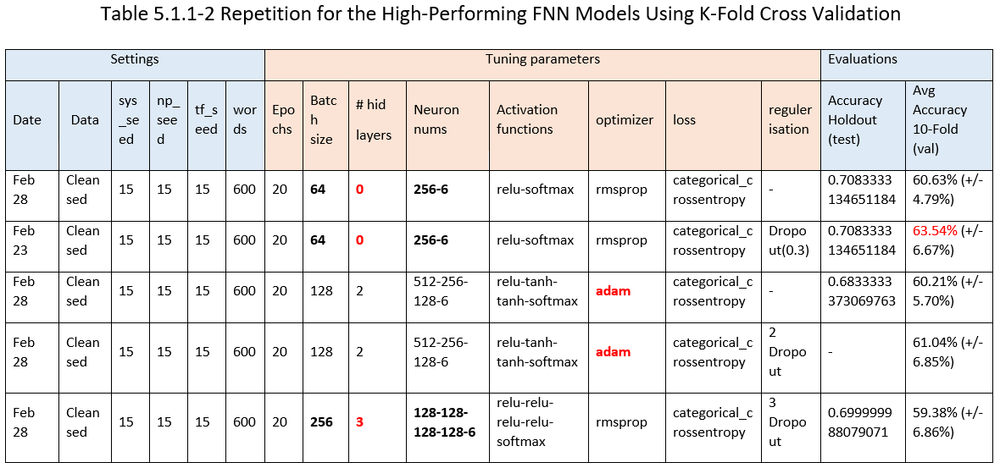

# Classification Using Classical NLP Models

The vectorization is a process where we numerically represent the outcome of the tokenization. Sometimes, this also involves with feature extraction, because we will give different weights to different words, which will be easier for the classifier to deal with. 

<b>Introduction for the three vectorizers I have chosen: </b>

1. TF-IDF: 

TF-IDF (Term Frequency-Inverse Document Frequency) is a method to represent the document using its own way to emphasise the keywords and to give lower weights to the stopwords. If we don't consider keywords (distinct words appearing in each document) and just classify based on all the words, then the classification would perhaps be misled by the large amount of stopwords. 

    e.g. A: 'I am a student who learns the neural network. '
    B: 'I am a student who learns the neural system in biology. '
    C: 'Machine learning includes the neural network. '
    
It is obvious that A and C should be in one subject, while B is another subject. However if we use general vectorisation method to give all words with the equal weights, we tend to classify A and B as one subject, since they have so many words in common. But if we selectively use the keywords like what TF-IDF does, we will get the correct answer. 

Drawback of TF-IDF: TF-IDF only comprehensively considers the importance of the word in the document and the degree of document differentiation; it does not consider the distribution of feature words between classes. The features selected by feature selection should appear more in a certain class, while other classes appear less, that is, to examine the differences in the frequency of documents of various types. If a feature word is evenly distributed among the categories, such a word basically does not contribute to the classification; but if a feature word is concentrated in a certain class and hardly appears in other classes, such a word does not contribute to the classification. It can well represent the characteristics of this class, but TF-IDF cannot distinguish between the two cases.

2. Count Vectorizer: 

Count Vectorizer is a common feature value calculation method, and is a text feature extraction method. For each training text, it only considers the frequency of each vocabulary in that training text. It can avoid the sparse representation given by one-hot encoding. 

Drawbacks of Count Vectorizer: It still has the sparse representation problem; it does not consider the order of words; it has not considered the relative importance of words to the document or class. 


3. Bigram: 

Bigram is an N-gram method, where we consider the continuous two words at each time, and construct the count vectors. 


## - Vectorizer: TF-IDF; Classifier: Support Vector Classifier

SVC: 

Support Vector Machine is to classify samples using some hyperplanes which can separate different groups of samples in higher dimensions. The nearest training samples to the hyperplanes are called 'support vectors'. It is designed at first for binary classification problems, and needs adaptation for multi-class classification problems. 



In [256]:
# convert to a numerical vector
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_TFIDFSVC = make_pipeline(TfidfVectorizer(), LinearSVC(random_state=0, tol=1e-5))

In [257]:
# Apply model to the training data, then predict labels for test data
model_TFIDFSVC.fit(X_train_pre2, Y_train_pre2)
labels_TFIDFSVC = model_TFIDFSVC.predict(X_test_pre2)

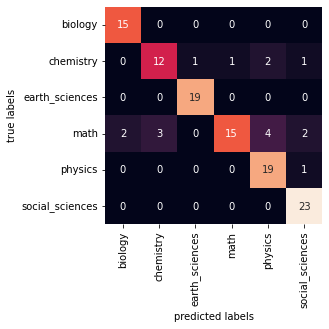

In [258]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_TFIDFSVC = confusion_matrix(Y_test_pre2, labels_TFIDFSVC)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_TFIDFSVC, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

From the heatmap above, we see that this model is a very good model, with just few cases mis-classified. Other categories are tend to be classified as physics mistakenly; and true math articles are tend to be classified as other subjects. 

In [118]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_TFIDFSVC, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.88      1.00      0.94        15
      chemistry       0.80      0.71      0.75        17
 earth_sciences       0.95      1.00      0.97        19
           math       0.94      0.58      0.71        26
        physics       0.76      0.95      0.84        20
social_sciences       0.85      1.00      0.92        23

       accuracy                           0.86       120
      macro avg       0.86      0.87      0.86       120
   weighted avg       0.87      0.86      0.85       120



Overall, this model is an outstanding model, since it gets an overall accuracy of 0.86. It is almost the highest among all models I have used. 

In [119]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_TFIDFSVC)
labels_TFIDFSVC_onehot = encoder.transform(labels_TFIDFSVC)
labels_TFIDFSVC_onehot = keras.utils.to_categorical(labels_TFIDFSVC_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


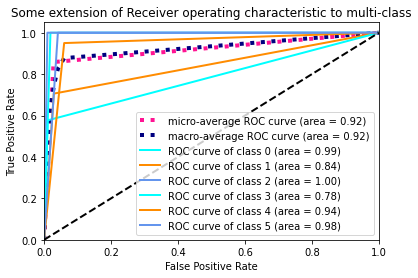

In [120]:
draw_ROC(6, Y_test2, labels_TFIDFSVC_onehot)

Using k-Fold Cross Validation: 

In [66]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_TFIDFSVC = make_pipeline(TfidfVectorizer(), LinearSVC(random_state=0, tol=1e-5))

In [68]:
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_TFIDFSVC, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.85416667 0.83333333 0.85416667 0.85416667 0.79166667]
The accuracy is: 0.84 (+/- 0.05)


From the executed 5-Fold Cross Validation, we see that the average accuracy is 0.84, with its 95% confidence internal of +/- 0.05. 0.84 is a high score which has exceeded the baseline 0.167 quite much. 

## - Vectorizer: Count Vectorizer; Classifier: Support Vector Classifier

In [121]:
# convert to a numerical vector
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_CVSVC = make_pipeline(CountVectorizer(), LinearSVC(random_state=0, tol=1e-5))

In [122]:
# Apply model to the training data, then predict labels for test data
model_CVSVC.fit(X_train_pre2, Y_train_pre2)
labels_CVSVC = model_TFIDFSVC.predict(X_test_pre2)

c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


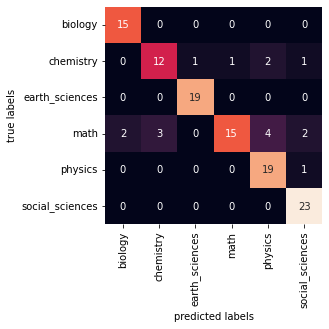

In [123]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_CVSVC = confusion_matrix(Y_test_pre2, labels_CVSVC)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_CVSVC, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [124]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_CVSVC, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.88      1.00      0.94        15
      chemistry       0.80      0.71      0.75        17
 earth_sciences       0.95      1.00      0.97        19
           math       0.94      0.58      0.71        26
        physics       0.76      0.95      0.84        20
social_sciences       0.85      1.00      0.92        23

       accuracy                           0.86       120
      macro avg       0.86      0.87      0.86       120
   weighted avg       0.87      0.86      0.85       120



We see that the accuracy=0.86 which is also very high, almost the highest among all models I have used. 

In [125]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_CVSVC)
labels_CVSVC_onehot = encoder.transform(labels_CVSVC)
labels_CVSVC_onehot = keras.utils.to_categorical(labels_CVSVC_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


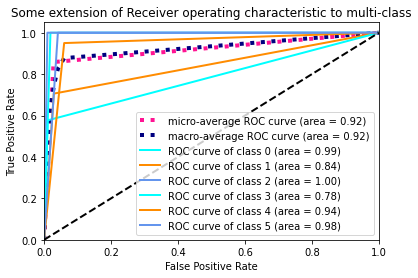

In [126]:
draw_ROC(6, Y_test2, labels_CVSVC_onehot)

Using k-Fold Cross Validation:

In [72]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_CVSVC = make_pipeline(CountVectorizer(), LinearSVC(max_iter=5000, random_state=0, tol=1e-5))
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_CVSVC, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Accuracy scores for these folds:  [0.80208333 0.71875    0.75       0.80208333 0.6875    ]
The accuracy is: 0.75 (+/- 0.09)


c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Now, I am not sure whether the k-Fold cross validation has been run without error, since there are error messages. I have increased the max_iter=20000 and it runs slowly but still get the same errors. 

The result is accuracy=0.75 which is a lot different from our previous result which is 0.86. 

It is still a question why the k-fold cross validation has a quite different result from the hold-out cross validation. 

## - Vectorizer: Bigram; Classifier: Support Vector Classifier

In [127]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_biSVC = make_pipeline(CountVectorizer(ngram_range = (2,2)), LinearSVC(random_state=0, tol=1e-5))

In [128]:
# Apply model to the training data, then predict labels for test data
model_biSVC.fit(X_train_pre2, Y_train_pre2)
labels_biSVC = model_biSVC.predict(X_test_pre2)

c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


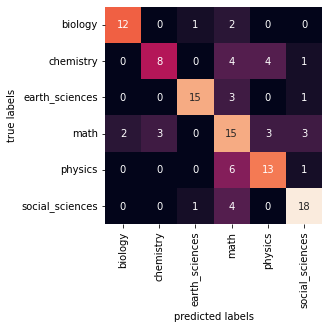

In [129]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_biSVC = confusion_matrix(Y_test_pre2, labels_biSVC)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_biSVC, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [130]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_biSVC, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.86      0.80      0.83        15
      chemistry       0.73      0.47      0.57        17
 earth_sciences       0.88      0.79      0.83        19
           math       0.44      0.58      0.50        26
        physics       0.65      0.65      0.65        20
social_sciences       0.75      0.78      0.77        23

       accuracy                           0.68       120
      macro avg       0.72      0.68      0.69       120
   weighted avg       0.70      0.68      0.68       120



From the above table, we see the total accuracy=0.68 which is not very high, compared with the previous two vectorizers also using SVC, though this model has surpassed the baseline 0.167 quite much. 

In [131]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_biSVC)
labels_biSVC_onehot = encoder.transform(labels_biSVC)
labels_biSVC_onehot = keras.utils.to_categorical(labels_biSVC_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


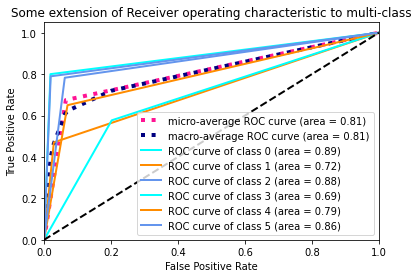

In [132]:
draw_ROC(6, Y_test2, labels_biSVC_onehot)

Using k-Fold Cross Validation: 

In [76]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline

model_biSVC = make_pipeline(CountVectorizer(ngram_range = (2,2)), LinearSVC(max_iter=20000, random_state=0, tol=1e-5))
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_biSVC, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\python\python38\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Accuracy scores for these folds:  [0.70833333 0.65625    0.65625    0.64583333 0.64583333]
The accuracy is: 0.66 (+/- 0.05)


Now that we have error messages even when I have re-settled the max_iter, I can't ensure that the outcome is reliable. It has shown to me the accuracy=0.66, which is similar to the previously run result using hold-out set. 

## - Vectorizer: TF-IDF; Classifier: Multinomial Naive Bayes

Naive Bayes Classifier is a type of probability model. The training process of any probability model is the process of parameter estimation [14]. For parameter estimation, the Bayesian school deems that the parameter is a random variable which itself can have a distribution; thus, we can assume the parameter is based on a prior distribution, and then calculate the posterior distribution based on observed data [14]. 

Naive Bayes adds an 'Attribute Conditional Independence Assumption': assume that each attribute influences independently to the classification result.  

To prevent from a case where the data in the test set is what we have never met in the training set and thus it cannot be calculated, we use 'smoothing' to estimate a probability value, such as Laplacian Smoothing and so on. 

it is worth to mention that, Bayes Classifier and Bayesian Learning are different, in that the former is doing point estimation using posterior probability, while the later is doing distribution estimation [14]. 

In [133]:
# convert to a numerical vector
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB    
from sklearn.pipeline import make_pipeline

model_TFIDFMNB = make_pipeline(TfidfVectorizer(), MultinomialNB())

In [134]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_TFIDFMNB.fit(X_train_pre2, Y_train_pre2)
labels_TFIDFMNB = model_TFIDFMNB.predict(X_test_pre2)

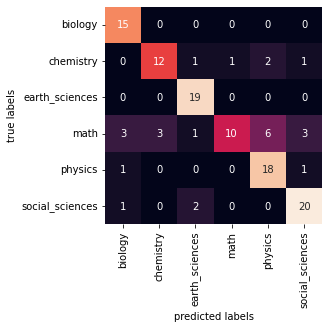

In [135]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_TFIDFMNB = confusion_matrix(Y_test_pre2, labels_TFIDFMNB)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_TFIDFMNB, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [136]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_TFIDFMNB, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.75      1.00      0.86        15
      chemistry       0.80      0.71      0.75        17
 earth_sciences       0.83      1.00      0.90        19
           math       0.91      0.38      0.54        26
        physics       0.69      0.90      0.78        20
social_sciences       0.80      0.87      0.83        23

       accuracy                           0.78       120
      macro avg       0.80      0.81      0.78       120
   weighted avg       0.80      0.78      0.76       120



In [137]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_TFIDFMNB)
labels_TFIDFMNB_onehot = encoder.transform(labels_TFIDFMNB)
labels_TFIDFMNB_onehot = keras.utils.to_categorical(labels_TFIDFMNB_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


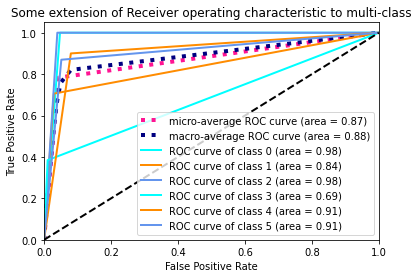

In [138]:
draw_ROC(6, Y_test2, labels_TFIDFMNB_onehot)

Using k-Fold Cross Validation: 

In [78]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB    
from sklearn.pipeline import make_pipeline

model_TFIDFMNB = make_pipeline(TfidfVectorizer(), MultinomialNB())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_TFIDFMNB, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.8125     0.75       0.69791667 0.71875    0.72916667]
The accuracy is: 0.74 (+/- 0.08)


This accuracy=0.74 is similar to what we have got using hold-out set, though it still has a relatively lower score. 0.74 has surpassed a lot from the baseline 0.167, so we can say this is a good model. 

## - Vectorizer: Count Vectorizer; Classifier: Multinomial Naive Bayes

In [139]:
# convert to a numerical vector
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB    
from sklearn.pipeline import make_pipeline

model_CVMNB = make_pipeline(CountVectorizer(), MultinomialNB())

In [140]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_CVMNB.fit(X_train_pre2, Y_train_pre2)
labels_CVMNB = model_CVMNB.predict(X_test_pre2)

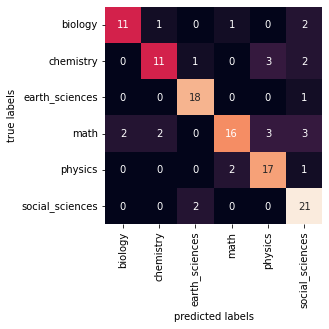

In [141]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_CVMNB = confusion_matrix(Y_test_pre2, labels_CVMNB)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_CVMNB, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [142]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_CVMNB, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.85      0.73      0.79        15
      chemistry       0.79      0.65      0.71        17
 earth_sciences       0.86      0.95      0.90        19
           math       0.84      0.62      0.71        26
        physics       0.74      0.85      0.79        20
social_sciences       0.70      0.91      0.79        23

       accuracy                           0.78       120
      macro avg       0.80      0.78      0.78       120
   weighted avg       0.79      0.78      0.78       120



In [143]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_CVMNB)
labels_CVMNB_onehot = encoder.transform(labels_CVMNB)
labels_CVMNB_onehot = keras.utils.to_categorical(labels_CVMNB_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


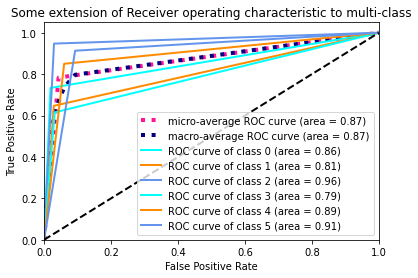

In [144]:
draw_ROC(6, Y_test2, labels_CVMNB_onehot)

Using K-Fold Cross Validation: 

In [80]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB    
from sklearn.pipeline import make_pipeline

model_CVMNB = make_pipeline(CountVectorizer(), MultinomialNB())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_CVMNB, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.73958333 0.78125    0.75       0.80208333 0.6875    ]
The accuracy is: 0.75 (+/- 0.08)


Again, my k-fold CV has given me a relatively lower score than the hold-out CV method, although in one fold we get an accuracy=0.802. However, the 0.75 is a very good score, demonstrating this is a proper model. 

## - Vectorizer: Bigram; Classifier: Multinomial Naive Bayes

In [145]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline

model_biMNB = make_pipeline(CountVectorizer(ngram_range = (2,2)), MultinomialNB())

In [146]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_biMNB.fit(X_train_pre2, Y_train_pre2)
labels_biMNB = model_biMNB.predict(X_test_pre2)

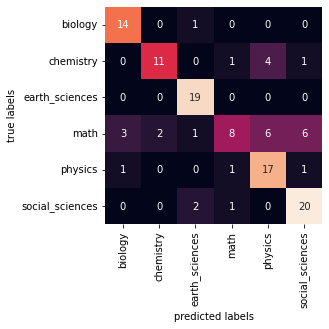

In [147]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_biMNB = confusion_matrix(Y_test_pre2, labels_biMNB)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_biMNB, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [148]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_biMNB, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.78      0.93      0.85        15
      chemistry       0.85      0.65      0.73        17
 earth_sciences       0.83      1.00      0.90        19
           math       0.73      0.31      0.43        26
        physics       0.63      0.85      0.72        20
social_sciences       0.71      0.87      0.78        23

       accuracy                           0.74       120
      macro avg       0.75      0.77      0.74       120
   weighted avg       0.75      0.74      0.72       120



In [149]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_biMNB)
labels_biMNB_onehot = encoder.transform(labels_biMNB)
labels_biMNB_onehot = keras.utils.to_categorical(labels_biMNB_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


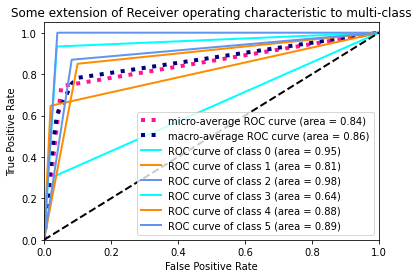

In [150]:
draw_ROC(6, Y_test2, labels_biMNB_onehot)

Using K-Fold Cross Validation: 

In [81]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB    
from sklearn.pipeline import make_pipeline

model_biMNB = make_pipeline(CountVectorizer(ngram_range = (2,2)), MultinomialNB())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_biMNB, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.71875    0.6875     0.70833333 0.70833333 0.6875    ]
The accuracy is: 0.70 (+/- 0.03)


Again, the k-fold result is slightly lower than the hold-out result. Bigram again has demonstrated that itself cannot be compared with the other two vectorizers, since both the other results are higher than its. 

## - Vectorizer: TF-IDF; Classifier: Random Forest

Random Forest is constructed based on many Decision Trees, but further presents a Bagging ensembled learning method, and adds the choice of random attributes in training for Decision Tree.  


In [83]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_TFIDFRF = make_pipeline(TfidfVectorizer(), RandomForestClassifier(n_estimators=100, random_state=15))

In [84]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_TFIDFRF.fit(X_train_pre2, Y_train_pre2)
labels_TFIDFRF = model_TFIDFRF.predict(X_test_pre2)

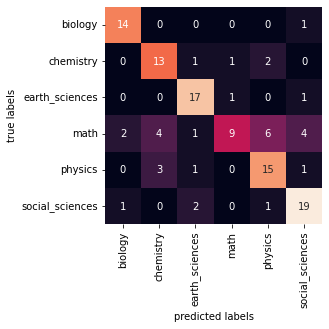

In [85]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_TFIDFRF = confusion_matrix(Y_test_pre2, labels_TFIDFRF)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_TFIDFRF, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [86]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_TFIDFRF, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.82      0.93      0.87        15
      chemistry       0.65      0.76      0.70        17
 earth_sciences       0.77      0.89      0.83        19
           math       0.82      0.35      0.49        26
        physics       0.62      0.75      0.68        20
social_sciences       0.73      0.83      0.78        23

       accuracy                           0.73       120
      macro avg       0.74      0.75      0.73       120
   weighted avg       0.74      0.72      0.71       120



The avg accuracy=0.73 is quite a high score. though lower than the SVC and MNB models. 

In [80]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_TFIDFRF)
labels_TFIDFRF_onehot = encoder.transform(labels_TFIDFRF)
labels_TFIDFRF_onehot = keras.utils.to_categorical(labels_TFIDFRF_onehot, 6)

In [82]:
labels_TFIDFRF_onehot[7]  # check

array([0., 0., 0., 0., 1., 0.], dtype=float32)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


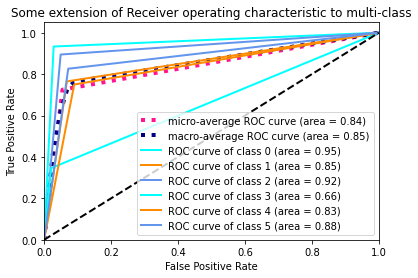

In [83]:
draw_ROC(6, Y_test2, labels_TFIDFRF_onehot)

Using K-Fold Cross Validation: 

In [82]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_TFIDFRF = make_pipeline(TfidfVectorizer(), RandomForestClassifier(n_estimators=100, random_state=15))
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_TFIDFRF, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.66666667 0.63541667 0.63541667 0.63541667 0.64583333]
The accuracy is: 0.64 (+/- 0.02)


0.64 is lower than the hold-out set method. It is a good model, since it is much higher than the baseline 0.167. 

## - Vectorizer: Count Vectorizer; Classifier: Random Forest

In [84]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_CVRF = make_pipeline(CountVectorizer(), RandomForestClassifier(n_estimators=100, random_state=15))

In [85]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_CVRF.fit(X_train_pre2, Y_train_pre2)
labels_CVRF = model_CVRF.predict(X_test_pre2)

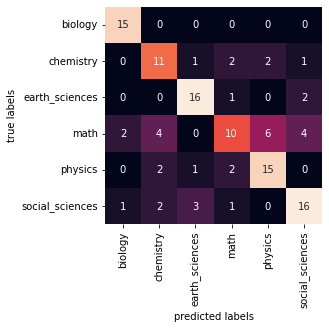

In [86]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_CVRF = confusion_matrix(Y_test_pre2, labels_CVRF)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_CVRF, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [87]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_CVRF, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.83      1.00      0.91        15
      chemistry       0.58      0.65      0.61        17
 earth_sciences       0.76      0.84      0.80        19
           math       0.62      0.38      0.48        26
        physics       0.65      0.75      0.70        20
social_sciences       0.70      0.70      0.70        23

       accuracy                           0.69       120
      macro avg       0.69      0.72      0.70       120
   weighted avg       0.68      0.69      0.68       120



In [88]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_CVRF)
labels_CVRF_onehot = encoder.transform(labels_CVRF)
labels_CVRF_onehot = keras.utils.to_categorical(labels_CVRF_onehot, 6)

In [89]:
labels_CVRF_onehot[7]  # check

array([0., 0., 0., 0., 1., 0.], dtype=float32)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


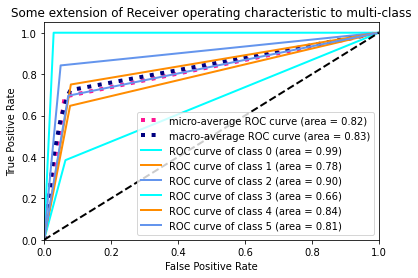

In [90]:
draw_ROC(6, Y_test2, labels_CVRF_onehot)

Using K-Fold Cross Validation: 

In [87]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_CVRF = make_pipeline(CountVectorizer(), RandomForestClassifier(n_estimators=100, random_state=15))
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_CVRF, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.67708333 0.65625    0.61458333 0.65625    0.65625   ]
The accuracy is: 0.65 (+/- 0.04)


We see, 0.65 is a rather good score, indicating this model is a good-performing model, but still is lower than the hold-out set score. 

## - Vectorizer: Bigram; Classifier: Random Forest

In [91]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_biRF = make_pipeline(CountVectorizer(ngram_range = (2,2)), RandomForestClassifier(n_estimators=100, random_state=15))

In [92]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_biRF.fit(X_train_pre2, Y_train_pre2)
labels_biRF = model_biRF.predict(X_test_pre2)

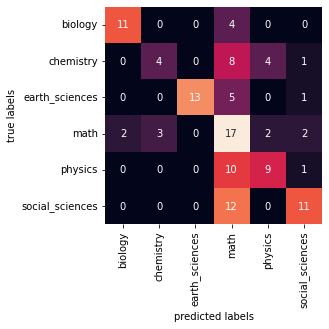

In [93]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_biRF = confusion_matrix(Y_test_pre2, labels_biRF)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_biRF, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [94]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_biRF, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.85      0.73      0.79        15
      chemistry       0.57      0.24      0.33        17
 earth_sciences       1.00      0.68      0.81        19
           math       0.30      0.65      0.41        26
        physics       0.60      0.45      0.51        20
social_sciences       0.69      0.48      0.56        23

       accuracy                           0.54       120
      macro avg       0.67      0.54      0.57       120
   weighted avg       0.64      0.54      0.56       120



In [95]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_biRF)
labels_biRF_onehot = encoder.transform(labels_biRF)
labels_biRF_onehot = keras.utils.to_categorical(labels_biRF_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


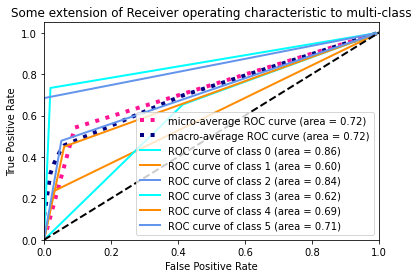

In [96]:
draw_ROC(6, Y_test2, labels_biRF_onehot)

Using K-Fold Cross Validation: 

In [88]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

model_biRF = make_pipeline(CountVectorizer(ngram_range = (2,2)), RandomForestClassifier(n_estimators=100, random_state=15))
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_biRF, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.55208333 0.5        0.4375     0.52083333 0.52083333]
The accuracy is: 0.51 (+/- 0.08)


The hold-out set avg accuracy=0.54, and the 5-fold CV avg accuracy=0.51, which are both not high, even not high enough than my common FNN models. 

## - Vectorizer: TF-IDF; Classifier: K-Nearest Neighbors

The K-Nearest Neighbors Classifier is based on the thought that, when deciding the class an unknown new data belongs to, we just observe its k nearest neighbours with given classes - if one class has the most points among these k points, then we just classify this new point into that class. It is a representative for the 'Lazy Learning', because it does not have an apparent training process - it's just calculating and then voting. It just stores the samples but does not train them; it waits until receives any test data to process everything [14]. 


In [98]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_TFIDFKN = make_pipeline(TfidfVectorizer(), KNeighborsClassifier())

In [99]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_TFIDFKN.fit(X_train_pre2, Y_train_pre2)
labels_TFIDFKN = model_TFIDFKN.predict(X_test_pre2)

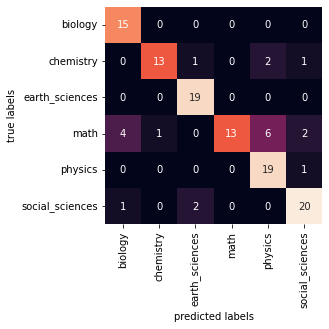

In [100]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_TFIDFKN = confusion_matrix(Y_test_pre2, labels_TFIDFKN)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_TFIDFKN, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [101]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_TFIDFKN, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.75      1.00      0.86        15
      chemistry       0.93      0.76      0.84        17
 earth_sciences       0.86      1.00      0.93        19
           math       1.00      0.50      0.67        26
        physics       0.70      0.95      0.81        20
social_sciences       0.83      0.87      0.85        23

       accuracy                           0.82       120
      macro avg       0.85      0.85      0.82       120
   weighted avg       0.86      0.82      0.82       120



In [102]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_TFIDFKN)
labels_TFIDFKN_onehot = encoder.transform(labels_TFIDFKN)
labels_TFIDFKN_onehot = keras.utils.to_categorical(labels_TFIDFKN_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


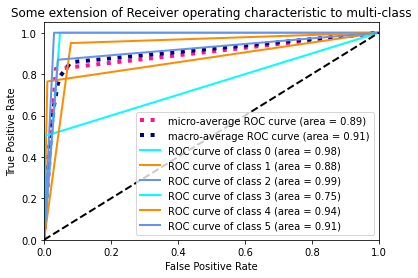

In [103]:
draw_ROC(6, Y_test2, labels_TFIDFKN_onehot)

Using K-Fold Cross Validation: 

In [89]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_TFIDFKN = make_pipeline(TfidfVectorizer(), KNeighborsClassifier())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_TFIDFKN, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.82291667 0.83333333 0.84375    0.8125     0.75      ]
The accuracy is: 0.81 (+/- 0.07)


This time, the k-fold result accuracy=0.81 is similar to the hold-out result accuracy=0.82, both are very high, the second highest among all the 12 models using k-fold method. 

## - Vectorizer: Count Vectorizer; Classifier: K-Nearest Neighbors

In [90]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_CVKN = make_pipeline(CountVectorizer(), KNeighborsClassifier())

In [91]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_CVKN.fit(X_train_pre2, Y_train_pre2)
labels_CVKN = model_CVKN.predict(X_test_pre2)

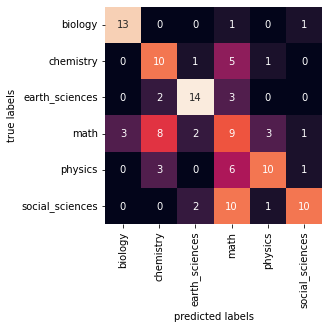

In [92]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_CVKN = confusion_matrix(Y_test_pre2, labels_CVKN)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_CVKN, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [93]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_CVKN, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       0.81      0.87      0.84        15
      chemistry       0.43      0.59      0.50        17
 earth_sciences       0.74      0.74      0.74        19
           math       0.26      0.35      0.30        26
        physics       0.67      0.50      0.57        20
social_sciences       0.77      0.43      0.56        23

       accuracy                           0.55       120
      macro avg       0.61      0.58      0.58       120
   weighted avg       0.60      0.55      0.56       120



In [94]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_CVKN)
labels_CVKN_onehot = encoder.transform(labels_CVKN)
labels_CVKN_onehot = keras.utils.to_categorical(labels_CVKN_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_3316/3659268063.py:50: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


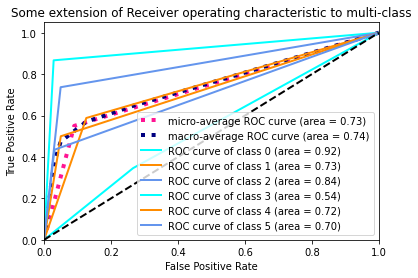

In [95]:
draw_ROC(6, Y_test2, labels_CVKN_onehot)

Using K-Fold Cross Validation: 

In [96]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_CVKN = make_pipeline(CountVectorizer(), KNeighborsClassifier())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_CVKN, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.63541667 0.65625    0.47916667 0.64583333 0.54166667]
The accuracy is: 0.59 (+/- 0.14)


This time, the k-fold method gets a slightly higher accuracy than the hold-out result, though they are both low, compared with other models. 

## - Vectorizer: Bigram; Classifier: K-Nearest Neighbors

In [109]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_biKN = make_pipeline(CountVectorizer(ngram_range = (2,2)), KNeighborsClassifier())

In [110]:
# Apply model to the training data, then predict labels for test data
# X_data = X_train_pre2.toarray()  # according to the error reported
model_biKN.fit(X_train_pre2, Y_train_pre2)
labels_biKN = model_biKN.predict(X_test_pre2)

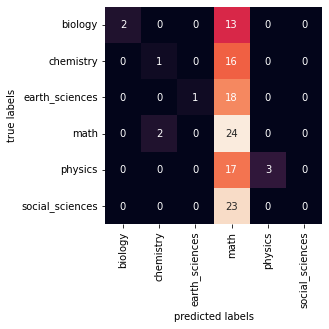

In [111]:
# Let's plot the confusion matrix: 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
mat_biKN = confusion_matrix(Y_test_pre2, labels_biKN)
# Notice here the Y_test is in one-hot encoding, and we should transform the format. 
sns.heatmap(mat_biKN, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=list(tags_to_index_dict.keys()), yticklabels=list(tags_to_index_dict.keys()))
            # the xticklabels should be a list, so I should convert the keys of BBC_categories into list
plt.xlabel('predicted labels')
plt.ylabel('true labels');

In [112]:
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
print(classification_report(Y_test_pre2, labels_biKN, 
                            target_names=list(tags_to_index_dict.keys())))
# Here we should also transform the format into Y_test.argmax(axis=1), which are the labels in numbers
# rather than one-hot encoding. 

                 precision    recall  f1-score   support

        biology       1.00      0.13      0.24        15
      chemistry       0.33      0.06      0.10        17
 earth_sciences       1.00      0.05      0.10        19
           math       0.22      0.92      0.35        26
        physics       1.00      0.15      0.26        20
social_sciences       0.00      0.00      0.00        23

       accuracy                           0.26       120
      macro avg       0.59      0.22      0.17       120
   weighted avg       0.54      0.26      0.18       120



c:\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [113]:
# transform the predicted result into one-hot encodng version, so that we can use the ROC function: 
encoder = LabelEncoder()
encoder.fit(labels_biKN)
labels_biKN_onehot = encoder.transform(labels_biKN)
labels_biKN_onehot = keras.utils.to_categorical(labels_biKN_onehot, 6)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


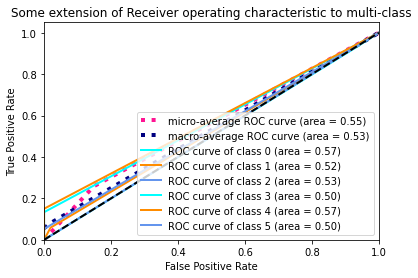

In [114]:
draw_ROC(6, Y_test2, labels_biKN_onehot)

Using K-Fold Cross Validation: 

In [97]:
# Now let's experiment for k-Fold Cross Validation, to overcome the shortage of my small dataset and potential drawback of hold-out set
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline

model_biKN = make_pipeline(CountVectorizer(ngram_range = (2,2)), KNeighborsClassifier())
from sklearn.model_selection import cross_val_score
# These splitters are with shuffle=False so the splits will be the same across calls: 
scores = cross_val_score(model_biKN, X_train_pre2, Y_train_pre2, cv=5)
print("Accuracy scores for these folds: ", scores)
# Also print its average accuracy, and its 95% confidence interval 
# Below code source: https://blog.csdn.net/aliceyangxi1987/article/details/73532651 [15]: 
print("The accuracy is: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()*2) )

Accuracy scores for these folds:  [0.20833333 0.17708333 0.20833333 0.19791667 0.22916667]
The accuracy is: 0.20 (+/- 0.03)


The ROC curves are almost overlapping with the diagonal line, and the AUC area is just above 0.5. Therefore, it is a very bad model, though it has passed a little bit of the commonsense baseline.

It's 'amazing' to see the Social Sciences precision and recall are both zero, and Chemistry and Earth Sciences both have a very low recall. 

For this model, I especially want to know why almost all the samples are mis-classified as 'math', as shown in the heatmap. I have checked my codes over and over, cannot find an error. Therefore, is it because of some internal settings by Bigram or KNN? Why these two can't be combined together? 

Summary: 
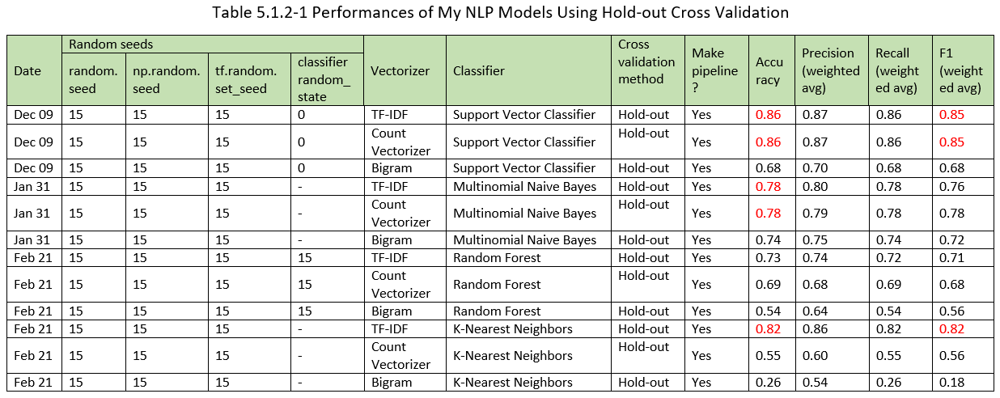

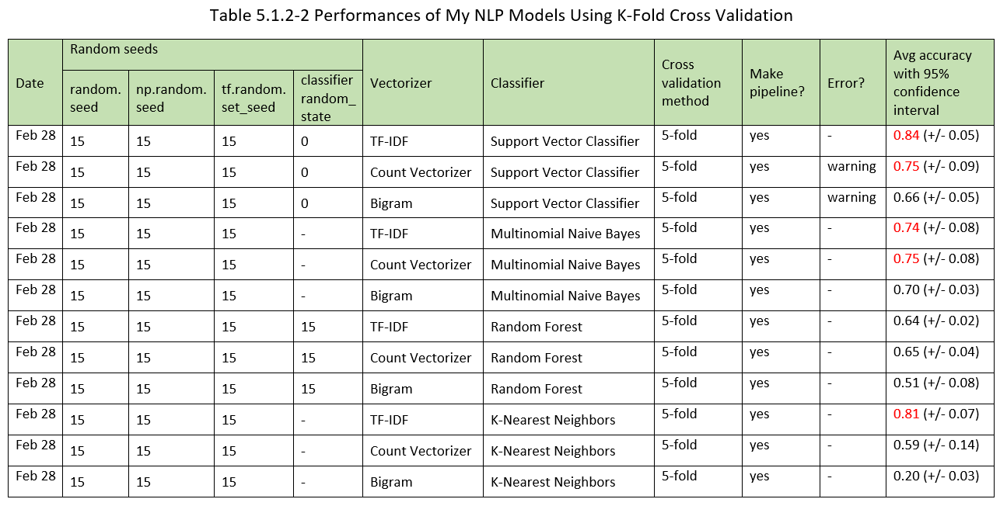

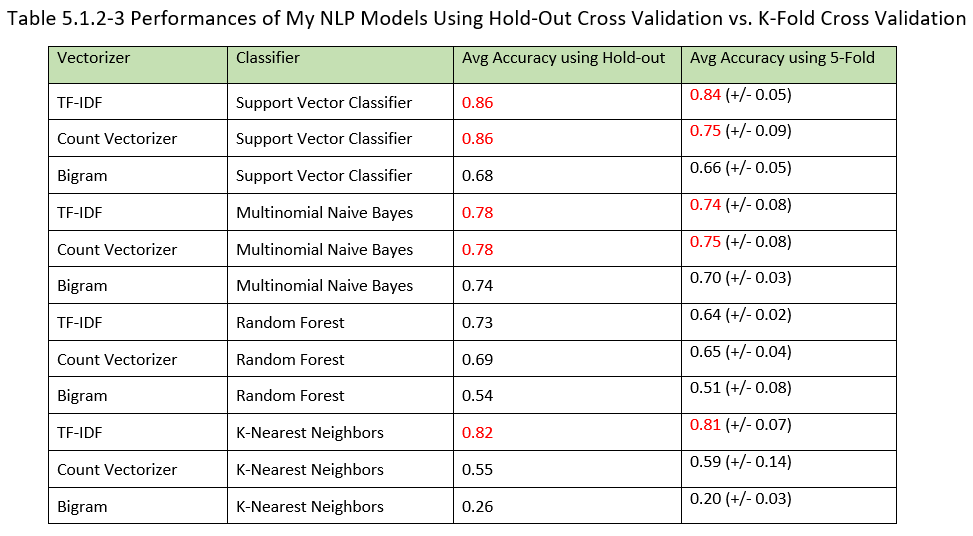

(1) Classifier: SVC is No.1, MNB is No.2, both are impressive. Random Forest provides just a passing performance; while KNN must combine with TF-IDF vectorizer to be outstanding.  

(2) Vectorizer: TF-IDF is always excellent with all classifiers; Count Vectorizer is almost the same but should not combine with KNN; Bigram performs always the worst, and should never combine with KNN. 

# Deep Neural Network (DNN) Models
## Convolutional Neural Network (CNN) 

I use 1D convnet, with Conv1D layers and MaxPooling1D layers inside my neural network models.  

### Pre-Trained Model Provided by Chollet

In [98]:
# This cell of codes is from Chollet's Ch. 6.4 [4]
# It's much quicker than RNN, though it's slower than the first method we have used. 
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

# The below settings are learned from Gupta, Majumder et al.'s book 'Practical Natural Language 
# Processing' Ch.4.5.1 [6] 

model_1DCNN.add(layers.Embedding(10000, 128, input_length=600))
model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(5))
model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
model_1DCNN.add(layers.MaxPooling1D(5))
model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
model_1DCNN.add(layers.GlobalMaxPooling1D())
model_1DCNN.add(layers.Dense(128, activation='relu'))
model_1DCNN.add(layers.Dense(6))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=128, # set a fixed batch size
                            epochs=15,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 600, 128)          1280000   
                                                                 
 conv1d (Conv1D)             (None, 595, 128)          98432     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 119, 128)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 114, 128)          98432     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 22, 128)          0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 17, 128)           9

In [99]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 22ms/step - loss: 5.7757 - accuracy: 0.2167


[5.775650978088379, 0.21666666865348816]

In [107]:
# The k-fold cross validation method: 
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

X = X_train_pre2
Y = Y_train_pre2
for train, validation in kfold.split(X, Y):   # train-validation splitting
    model_1DCNN = Sequential()

    # The below settings are learned from Gupta, Majumder et al.'s book 'Practical Natural Language 
    # Processing' Ch.4.5.1 [6] 

    model_1DCNN.add(layers.Embedding(10000, 128, input_length=600))
    model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
    # The above layer creates a convolution kernel that is convolved with the layer input over a single 
    # spatial (or temporal) dimension to produce a tensor of outputs.
    model_1DCNN.add(layers.MaxPooling1D(5))
    model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
    model_1DCNN.add(layers.MaxPooling1D(5))
    model_1DCNN.add(layers.Conv1D(128, 6, activation='relu'))
    model_1DCNN.add(layers.GlobalMaxPooling1D())
    model_1DCNN.add(layers.Dense(128, activation='relu'))
    model_1DCNN.add(layers.Dense(6))

    model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])
    model_1DCNN.summary()


    history_1DCNN = model_1DCNN.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=128, # set a fixed batch size
                                epochs=15,  # we just set any fixed number for control
                                )
    scores = model_1DCNN.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_1DCNN.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_17 (Embedding)    (None, 600, 128)          1280000   
                                                                 
 conv1d_35 (Conv1D)          (None, 595, 128)          98432     
                                                                 
 max_pooling1d_18 (MaxPoolin  (None, 119, 128)         0         
 g1D)                                                            
                                                                 
 conv1d_36 (Conv1D)          (None, 114, 128)          98432     
                                                                 
 max_pooling1d_19 (MaxPoolin  (None, 22, 128)          0         
 g1D)                                                            
                                                                 
 conv1d_37 (Conv1D)          (None, 17, 128)         

Total params: 1,592,582
Trainable params: 1,592,582
Non-trainable params: 0
_________________________________________________________________
Epoch 1/15
4/4 [==============================] - 2s 280ms/step - loss: 6.7805 - accuracy: 0.1736
Epoch 2/15
4/4 [==============================] - 1s 281ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 3/15
4/4 [==============================] - 1s 292ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 4/15
4/4 [==============================] - 1s 275ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 5/15
4/4 [==============================] - 1s 279ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 6/15
4/4 [==============================] - 1s 277ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 7/15
4/4 [==============================] - 1s 276ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 8/15
4/4 [==============================] - 1s 280ms/step - loss: 10.4842 - accuracy: 0.1736
Epoch 9/15
4/4 [==============================] - 1s 281ms/step - l

                                                                 
 dense_49 (Dense)            (None, 6)                 774       
                                                                 
Total params: 1,592,582
Trainable params: 1,592,582
Non-trainable params: 0
_________________________________________________________________
Epoch 1/15
4/4 [==============================] - 2s 313ms/step - loss: 7.8979 - accuracy: 0.1366
Epoch 2/15
4/4 [==============================] - 1s 290ms/step - loss: 10.8946 - accuracy: 0.1713
Epoch 3/15
4/4 [==============================] - 1s 294ms/step - loss: 10.8946 - accuracy: 0.1713
Epoch 4/15
4/4 [==============================] - 1s 288ms/step - loss: 10.8946 - accuracy: 0.1713
Epoch 5/15
4/4 [==============================] - 1s 287ms/step - loss: 10.8946 - accuracy: 0.1713
Epoch 6/15
4/4 [==============================] - 1s 287ms/step - loss: 10.8946 - accuracy: 0.1713
Epoch 7/15
4/4 [==============================] - 1s 288ms/step - l

In [108]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

16.67% (+/- 1.86%)


We see that after using 10-Fold Cross Validation, Chollet's model only bring to us exactly the performance of a random classifier. This model is not useful. 

### Pre-Trained Model Provided by Bilibili

In [86]:
# Feb 03 The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.3))
model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(256, activation='relu'))
model_1DCNN.add(layers.Dropout(0.2))
model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=25,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, 600, 128)          256000    
                                                                 
 conv1d_4 (Conv1D)           (None, 600, 256)          98560     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 200, 32)           24608     
                                                                 
 flatten_2 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_12 (Dropout)        (None, 6400)              0         
                                                     

In [87]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 31ms/step - loss: 1.2782 - accuracy: 0.5750


[1.2782318592071533, 0.574999988079071]

In [109]:
# Feb 28, using K-Fold Cross Validation for the previous model
# The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2,  Y_train_pre2):   # train-validation splitting

    model_1DCNN = Sequential()
    model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                     output_dim=128, 
                                     input_length=600))
    model_1DCNN.add(layers.Conv1D(256,    # output size
                                  3,     # conv core size
                                  padding='same', 
                                  activation='relu'))
    # The above layer creates a convolution kernel that is convolved with the layer input over a single 
    # spatial (or temporal) dimension to produce a tensor of outputs.
    model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
    model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
    model_1DCNN.add(layers.Flatten())
    model_1DCNN.add(layers.Dropout(0.3))
    model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
    model_1DCNN.add(layers.Dense(256, activation='relu'))
    model_1DCNN.add(layers.Dropout(0.2))
    model_1DCNN.add(layers.Dense(6, activation='softmax'))

    model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

    model_1DCNN.summary()

    # train-validation splitting
    X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
            X_train2, Y_train2, test_size=0.20, random_state=15)  
    # we set a random state in order to repeat the experiment later

    history_1DCNN = model_1DCNN.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=64, # set a fixed batch size
                                epochs=25,  # we just set any fixed number for control
                                )
    scores = model_1DCNN.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_1DCNN.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_27 (Embedding)    (None, 600, 128)          256000    
                                                                 
 conv1d_65 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_38 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_66 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_16 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_32 (Dropout)        (None, 6400)              0         
                                                     

7/7 [==============================] - 2s 216ms/step - loss: 0.1611 - accuracy: 0.9560
Epoch 15/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1294 - accuracy: 0.9560
Epoch 16/25
7/7 [==============================] - 2s 216ms/step - loss: 0.1466 - accuracy: 0.9514
Epoch 17/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1591 - accuracy: 0.9444
Epoch 18/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1117 - accuracy: 0.9583
Epoch 19/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1203 - accuracy: 0.9583
Epoch 20/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1394 - accuracy: 0.9537
Epoch 21/25
7/7 [==============================] - 2s 217ms/step - loss: 0.1428 - accuracy: 0.9491
Epoch 22/25
7/7 [==============================] - 2s 231ms/step - loss: 0.1089 - accuracy: 0.9537
Epoch 23/25
7/7 [==============================] - 2s 222ms/step - loss: 0.0922 - accuracy: 0.9676
Epoch 24/25
7/7 [=====

7/7 [==============================] - 2s 219ms/step - loss: 1.1454 - accuracy: 0.5787
Epoch 3/25
7/7 [==============================] - 2s 219ms/step - loss: 0.7010 - accuracy: 0.7407
Epoch 4/25
7/7 [==============================] - 2s 219ms/step - loss: 0.5450 - accuracy: 0.8333
Epoch 5/25
7/7 [==============================] - 2s 219ms/step - loss: 0.3578 - accuracy: 0.8866
Epoch 6/25
7/7 [==============================] - 2s 219ms/step - loss: 0.3043 - accuracy: 0.9259
Epoch 7/25
7/7 [==============================] - 2s 219ms/step - loss: 0.2273 - accuracy: 0.9398
Epoch 8/25
7/7 [==============================] - 2s 219ms/step - loss: 0.2365 - accuracy: 0.9282
Epoch 9/25
7/7 [==============================] - 2s 225ms/step - loss: 0.1895 - accuracy: 0.9468
Epoch 10/25
7/7 [==============================] - 2s 234ms/step - loss: 0.1926 - accuracy: 0.9537
Epoch 11/25
7/7 [==============================] - 2s 229ms/step - loss: 0.1651 - accuracy: 0.9560
Epoch 12/25
7/7 [============

                                                                 
 dense_73 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 2,044,966
Trainable params: 2,032,166
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/25
7/7 [==============================] - 2s 220ms/step - loss: 1.7967 - accuracy: 0.2940
Epoch 2/25
7/7 [==============================] - 2s 217ms/step - loss: 1.1161 - accuracy: 0.5926
Epoch 3/25
7/7 [==============================] - 2s 214ms/step - loss: 0.6874 - accuracy: 0.7593
Epoch 4/25
7/7 [==============================] - 2s 219ms/step - loss: 0.4232 - accuracy: 0.8704
Epoch 5/25
7/7 [==============================] - 2s 216ms/step - loss: 0.3755 - accuracy: 0.8889
Epoch 6/25
7/7 [==============================] - 2s 217ms/step - loss: 0.2984 - accuracy: 0.9074
Epoch 7/25
7/7 [==============================] - 2s 219ms/step - l

In [110]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

54.37% (+/- 3.54%)


In [102]:
# Feb 05 Adjusting the previous model. The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5]
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.3))
model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(256, activation='relu'))
model_1DCNN.add(layers.Dropout(0.2))
model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=25,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_21 (Embedding)    (None, 600, 128)          256000    
                                                                 
 conv1d_47 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_32 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_48 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_21 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_44 (Dropout)        (None, 6400)              0         
                                                     

In [103]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 30ms/step - loss: 1.2663 - accuracy: 0.6167


[1.2662925720214844, 0.6166666746139526]

In [104]:
Y_pred2 = model_1DCNN.predict(X_test2)

4/4 [==============================] - 0s 31ms/step


In [105]:
Y_pred2[5]

array([0.12341873, 0.14290495, 0.2356421 , 0.22325623, 0.11723346,
       0.15754452], dtype=float32)

In [106]:
Y_test2[5]   # have a check

array([0., 0., 1., 0., 0., 0.], dtype=float32)

In [116]:
# ROC Curve on multi-class classification: 
# Source: https://blog.csdn.net/xyz1584172808/article/details/81839230  by 闰土不用叉 [1]

import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

def draw_ROC(n_classes, Y_test2, Y_pred2): 
    '''   Draw the ROC and AUC for multi-class classification
    
    Parameters: 
      n_classes - an integer, how many categories in your classification
      Y_test2 - one-hot encoding for each entry, the test data of the target Y
      Y_pred2 - one-hot encoding for each entry, the predicted data for the target Y based on X_test2 and the model
    
    Returns: 
      None. Will display a plot containing the ROC curves for each of the category, and the avg ROC curves, and show AUC 
    '''
    
    if not n_classes==Y_test2.shape[1]: 
        print("Error in number of classes! ")
    else: 

        # Calculate the ROC for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(Y_test2[:, i], Y_pred2[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Compute micro-average ROC curve and ROC area (Method 2)
        fpr["micro"], tpr["micro"], _ = roc_curve(Y_test2.ravel(), Y_pred2.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        # Compute macro-average ROC curve and ROC area (Method 1)
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        # Plot all ROC curves
        lw=2
        plt.figure()
        plt.plot(fpr["micro"], tpr["micro"],
                 label='micro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["micro"]),
                 color='deeppink', linestyle=':', linewidth=4)

        plt.plot(fpr["macro"], tpr["macro"],
                 label='macro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["macro"]),
                 color='navy', linestyle=':', linewidth=4)

        colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
        for i, color in zip(range(n_classes), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=lw,
                     label='ROC curve of class {0} (area = {1:0.2f})'
                     ''.format(i, roc_auc[i]))

        plt.plot([0, 1], [0, 1], 'k--', lw=lw)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Some extension of Receiver operating characteristic to multi-class')
        plt.legend(loc="lower right")
        plt.show()


C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_3364/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


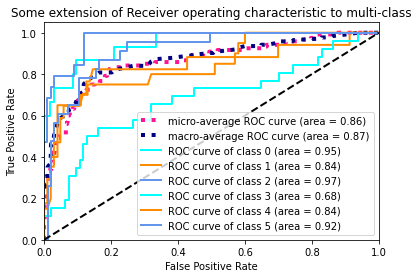

In [117]:
draw_ROC(6, Y_test2, Y_pred2)

In [100]:
import random
random.seed(15)
np.random.seed(15)
tf.random.set_seed(15)

In [105]:
# Febg 28, using K-Fold Cross Validation for the previous model
# The below settings and layers arrangement are adjusted from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5]
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

X = X_train_pre2
Y = Y_train_pre2
for train, validation in kfold.split(X, Y):   # train-validation splitting
    model_1DCNN = Sequential()

    model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                     output_dim=128, 
                                     input_length=600))
    model_1DCNN.add(layers.Conv1D(256,    # output size
                                  3,     # conv core size
                                  padding='same', 
                                  activation='relu'))
    # The above layer creates a convolution kernel that is convolved with the layer input over a single 
    # spatial (or temporal) dimension to produce a tensor of outputs.
    model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
    model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
    model_1DCNN.add(layers.Flatten())
    model_1DCNN.add(layers.Dropout(0.3))
    model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
    model_1DCNN.add(layers.Dense(256, activation='relu'))
    model_1DCNN.add(layers.Dropout(0.2))
    model_1DCNN.add(layers.Dense(6, activation='softmax'))

    model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

    model_1DCNN.summary()

    history_1DCNN = model_1DCNN.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=64, # set a fixed batch size
                                epochs=25,  # we just set any fixed number for control
                                )
    scores = model_1DCNN.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_1DCNN.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, 600, 128)          256000    
                                                                 
 conv1d_15 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_16 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_6 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_12 (Dropout)        (None, 6400)              0         
                                                      

Epoch 1/25
7/7 [==============================] - 2s 220ms/step - loss: 1.7663 - accuracy: 0.2847
Epoch 2/25
7/7 [==============================] - 2s 236ms/step - loss: 1.1950 - accuracy: 0.5347
Epoch 3/25
7/7 [==============================] - 2s 238ms/step - loss: 0.7985 - accuracy: 0.7153
Epoch 4/25
7/7 [==============================] - 2s 233ms/step - loss: 0.5612 - accuracy: 0.8032
Epoch 5/25
7/7 [==============================] - 2s 247ms/step - loss: 0.3655 - accuracy: 0.8912
Epoch 6/25
7/7 [==============================] - 2s 270ms/step - loss: 0.2914 - accuracy: 0.9190
Epoch 7/25
7/7 [==============================] - 2s 225ms/step - loss: 0.2185 - accuracy: 0.9444
Epoch 8/25
7/7 [==============================] - 2s 235ms/step - loss: 0.2168 - accuracy: 0.9352
Epoch 9/25
7/7 [==============================] - 2s 261ms/step - loss: 0.2043 - accuracy: 0.9375
Epoch 10/25
7/7 [==============================] - 2s 222ms/step - loss: 0.1822 - accuracy: 0.9468
Epoch 11/25
7/7 [==

                                                                 
 dropout_23 (Dropout)        (None, 256)               0         
                                                                 
 dense_25 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 2,044,966
Trainable params: 2,032,166
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/25
7/7 [==============================] - 2s 222ms/step - loss: 1.8827 - accuracy: 0.2616
Epoch 2/25
7/7 [==============================] - 2s 239ms/step - loss: 1.2005 - accuracy: 0.5880
Epoch 3/25
7/7 [==============================] - 2s 230ms/step - loss: 0.8381 - accuracy: 0.7060
Epoch 4/25
7/7 [==============================] - 2s 227ms/step - loss: 0.5058 - accuracy: 0.8380
Epoch 5/25
7/7 [==============================] - 2s 224ms/step - loss: 0.3266 - accuracy: 0.9074
Epoch 6/25
7/7 [=================

 flatten_13 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_26 (Dropout)        (None, 6400)              0         
                                                                 
 batch_normalization_13 (Bat  (None, 6400)             25600     
 chNormalization)                                                
                                                                 
 dense_28 (Dense)            (None, 256)               1638656   
                                                                 
 dropout_27 (Dropout)        (None, 256)               0         
                                                                 
 dense_29 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 2,044,966
Trainable params: 2,032,166
Non-trainable params: 12,800
_____________________________________________________________

                                                                 
 conv1d_33 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_17 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_34 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_15 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_30 (Dropout)        (None, 6400)              0         
                                                                 
 batch_normalization_15 (Bat  (None, 6400)             25600     
 chNormalization)                                                
                                                                 
 dense_32 

NameError: name 'numpy' is not defined

In [106]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

51.25% (+/- 3.51%)


We see that although this fine-tuned model has achieved accuracy=0.617 in the hold-out set, it soon shows its real ability in 10-fold cross validation, with the accuracy of only 0.513. 

### Pre-Trained Model Provided by the Book 'Python Deep Learning'

In [72]:
# Below settings are from the book 'Python深度学习' Section 4.7, Feb 05 [16]

from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential

model_CNN02 = Sequential()

model_CNN02.add(Embedding(input_dim = 600,     # size of the vocabulary
                          output_dim = 32,     # the dimension of word vector
                          input_length=600))    # the length of each list
model_CNN02.add(Conv1D(256, 3, padding='same', activation='relu'))
model_CNN02.add(MaxPooling1D(3, 3, padding='same'))
model_CNN02.add(Conv1D(32, 3, padding='same', activation='relu'))
model_CNN02.add(Flatten())
model_CNN02.add(Dropout(0.3))
model_CNN02.add(BatchNormalization())
model_CNN02.add(Dense(256, activation='relu'))
model_CNN02.add(Dropout(0.2))
model_CNN02.add(Dense(6, activation='softmax'))


model_CNN02.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_CNN02.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_CNN02 = model_CNN02.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=256, # set a fixed batch size
                            epochs=15,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2), 
#                            callbacks = [tensorboard_callback, reduce_lr]
                           )


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 600, 32)           19200     
                                                                 
 conv1d_10 (Conv1D)          (None, 600, 256)          24832     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_11 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_5 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_9 (Dropout)         (None, 6400)              0         
                                                      

In [73]:
results_CNN02 = model_CNN02.evaluate(X_test2, Y_test2)
results_CNN02

4/4 [==============================] - 0s 17ms/step - loss: 1.6251 - accuracy: 0.3167


[1.6251308917999268, 0.3166666626930237]

In [111]:
# Feb 28, let's use k-fold CV to re-run this model
# Below settings are from the book 'Python深度学习' Section 4.7, Feb 05 [16]
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    model_CNN02 = Sequential()

    model_CNN02.add(Embedding(input_dim = 600,     # size of the vocabulary
                              output_dim = 32,     # the dimension of word vector
                              input_length=600))    # the length of each list
    model_CNN02.add(Conv1D(256, 3, padding='same', activation='relu'))
    model_CNN02.add(MaxPooling1D(3, 3, padding='same'))
    model_CNN02.add(Conv1D(32, 3, padding='same', activation='relu'))
    model_CNN02.add(Flatten())
    model_CNN02.add(Dropout(0.3))
    model_CNN02.add(BatchNormalization())
    model_CNN02.add(Dense(256, activation='relu'))
    model_CNN02.add(Dropout(0.2))
    model_CNN02.add(Dense(6, activation='softmax'))


    model_CNN02.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    model_CNN02.summary()

    history_CNN02 = model_CNN02.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=256, # set a fixed batch size
                                epochs=15,  # we just set any fixed number for control
                                )
    scores = model_CNN02.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_CNN02.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_37 (Embedding)    (None, 600, 32)           19200     
                                                                 
 conv1d_85 (Conv1D)          (None, 600, 256)          24832     
                                                                 
 max_pooling1d_48 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_86 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_26 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_52 (Dropout)        (None, 6400)              0         
                                                     

                                                                 
 dense_79 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 1,734,438
Trainable params: 1,721,638
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/15
2/2 [==============================] - 2s 370ms/step - loss: 1.8114 - accuracy: 0.2106
Epoch 2/15
2/2 [==============================] - 1s 390ms/step - loss: 1.5019 - accuracy: 0.4352
Epoch 3/15
2/2 [==============================] - 1s 378ms/step - loss: 1.0960 - accuracy: 0.6574
Epoch 4/15
2/2 [==============================] - 1s 378ms/step - loss: 0.7864 - accuracy: 0.7338
Epoch 5/15
2/2 [==============================] - 1s 377ms/step - loss: 0.6237 - accuracy: 0.7755
Epoch 6/15
2/2 [==============================] - 1s 381ms/step - loss: 0.4508 - accuracy: 0.8472
Epoch 7/15
2/2 [==============================] - 1s 372ms/step - l

 dropout_66 (Dropout)        (None, 6400)              0         
                                                                 
 batch_normalization_33 (Bat  (None, 6400)             25600     
 chNormalization)                                                
                                                                 
 dense_88 (Dense)            (None, 256)               1638656   
                                                                 
 dropout_67 (Dropout)        (None, 256)               0         
                                                                 
 dense_89 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 1,734,438
Trainable params: 1,721,638
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/15
2/2 [==============================] - 2s 394ms/step - loss: 1.8562 - accuracy: 0.1620
Epoch 2/15
2/2 [=============

2/2 [==============================] - 1s 374ms/step - loss: 0.4697 - accuracy: 0.8495
Epoch 7/15
2/2 [==============================] - 1s 367ms/step - loss: 0.3079 - accuracy: 0.8843
Epoch 8/15
2/2 [==============================] - 1s 384ms/step - loss: 0.2096 - accuracy: 0.9329
Epoch 9/15
2/2 [==============================] - 1s 379ms/step - loss: 0.1724 - accuracy: 0.9537
Epoch 10/15
2/2 [==============================] - 1s 385ms/step - loss: 0.1574 - accuracy: 0.9444
Epoch 11/15
2/2 [==============================] - 1s 385ms/step - loss: 0.1047 - accuracy: 0.9630
Epoch 12/15
2/2 [==============================] - 1s 394ms/step - loss: 0.1077 - accuracy: 0.9514
Epoch 13/15
2/2 [==============================] - 1s 388ms/step - loss: 0.0707 - accuracy: 0.9722
Epoch 14/15
2/2 [==============================] - 1s 379ms/step - loss: 0.0923 - accuracy: 0.9606
Epoch 15/15
2/2 [==============================] - 1s 380ms/step - loss: 0.0776 - accuracy: 0.9745
accuracy: 47.92%
31.25% (

In [112]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

31.25% (+/- 9.13%)


### Fine Tuning on the Best Performing CNN So Far

In [76]:
# Feb 08 Adjusting the previous high score model. The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 

# Fine-tuning

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.3))
model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(256, activation='relu'))
model_1DCNN.add(layers.Dropout(0.2))

model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=28,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 600, 128)          256000    
                                                                 
 conv1d_10 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_11 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_5 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_10 (Dropout)        (None, 6400)              0         
                                                      

In [77]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 27ms/step - loss: 1.2261 - accuracy: 0.5917


[1.2260761260986328, 0.5916666388511658]

In [82]:
# Feb 08 Adjusting the previous high score model. The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 

# Fine-tuning

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.3))
model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(256, activation='relu'))
model_1DCNN.add(layers.Dropout(0.2))

model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=31,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 600, 128)          256000    
                                                                 
 conv1d_16 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_17 (Conv1D)          (None, 200, 32)           24608     
                                                                 
 flatten_8 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_16 (Dropout)        (None, 6400)              0         
                                                      

In [83]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 28ms/step - loss: 1.3253 - accuracy: 0.6333


[1.3252640962600708, 0.6333333253860474]

Now, the 0.633 accuracy is the best, among all the CNN and RNN. 
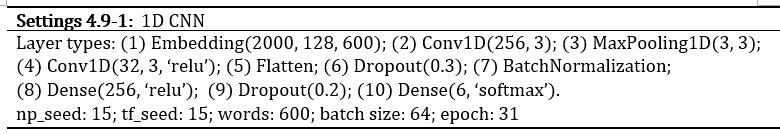

In [69]:
# Feb 21 Repeat the highest score CNN on Feb 08 Adjusting the previous high score model. The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5]

# Fine-tuning

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.3))
model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(256, activation='relu'))
model_1DCNN.add(layers.Dropout(0.2))

model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=31,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 600, 128)          256000    
                                                                 
 conv1d_2 (Conv1D)           (None, 600, 256)          98560     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 200, 256)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 200, 32)           24608     
                                                                 
 flatten_1 (Flatten)         (None, 6400)              0         
                                                                 
 dropout_2 (Dropout)         (None, 6400)              0         
                                                      

In [70]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 27ms/step - loss: 1.2168 - accuracy: 0.5833


[1.216833472251892, 0.5833333134651184]

In [71]:
Y_pred2 = model_1DCNN.predict(X_test2)

4/4 [==============================] - 0s 27ms/step


C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_4988/4237955017.py:38: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


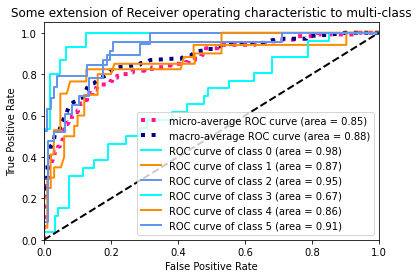

In [72]:
draw_ROC(6, Y_test2, Y_pred2)

(Feb 21) We see that somehow we cannot fetch the exact accuracy from the same model and the same hyperparameters. The operation today is just to draw the ROC curves. It is perhaps because of: the randomness of embedding layer; the randomness of regularisations; the randomness of optimisations, etc. 

In [113]:
# Feb 28, using K-Fold Cross Validation to repeat the previous accuracy=0.633 CNN model
# settings are from: https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    model_1DCNN = Sequential()

    model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                    output_dim=128, 
                                    input_length=600))
    model_1DCNN.add(layers.Conv1D(256,    # output size
                                3,     # conv core size
                                padding='same', 
                                activation='relu'))
    # The above layer creates a convolution kernel that is convolved with the layer input over a single 
    # spatial (or temporal) dimension to produce a tensor of outputs.
    model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
    model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
    model_1DCNN.add(layers.Flatten())
    model_1DCNN.add(layers.Dropout(0.3))
    model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
    model_1DCNN.add(layers.Dense(256, activation='relu'))
    model_1DCNN.add(layers.Dropout(0.2))

    model_1DCNN.add(layers.Dense(6, activation='softmax'))

    model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

    model_1DCNN.summary()

    history_1DCNN = model_1DCNN.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=64, # set a fixed batch size
                                epochs=31,  # we just set any fixed number for control
                                )
    scores = model_1DCNN.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_1DCNN.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval


Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_47 (Embedding)    (None, 600, 128)          256000    
                                                                 
 conv1d_105 (Conv1D)         (None, 600, 256)          98560     
                                                                 
 max_pooling1d_58 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_106 (Conv1D)         (None, 200, 32)           24608     
                                                                 
 flatten_36 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_72 (Dropout)        (None, 6400)              0         
                                                     

                                                                 
 dense_101 (Dense)           (None, 6)                 1542      
                                                                 
Total params: 2,044,966
Trainable params: 2,032,166
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/31
7/7 [==============================] - 3s 258ms/step - loss: 1.8683 - accuracy: 0.2593
Epoch 2/31
7/7 [==============================] - 2s 275ms/step - loss: 1.1306 - accuracy: 0.5972
Epoch 3/31
7/7 [==============================] - 2s 265ms/step - loss: 0.7318 - accuracy: 0.7269
Epoch 4/31
7/7 [==============================] - 2s 247ms/step - loss: 0.4929 - accuracy: 0.8264
Epoch 5/31
7/7 [==============================] - 2s 278ms/step - loss: 0.3420 - accuracy: 0.8958
Epoch 6/31
7/7 [==============================] - 2s 261ms/step - loss: 0.3146 - accuracy: 0.9005
Epoch 7/31
7/7 [==============================] - 2s 223ms/step - l

7/7 [==============================] - 2s 218ms/step - loss: 0.1850 - accuracy: 0.9444
Epoch 12/31
7/7 [==============================] - 2s 217ms/step - loss: 0.1936 - accuracy: 0.9468
Epoch 13/31
7/7 [==============================] - 2s 216ms/step - loss: 0.1817 - accuracy: 0.9491
Epoch 14/31
7/7 [==============================] - 2s 217ms/step - loss: 0.1927 - accuracy: 0.9468
Epoch 15/31
7/7 [==============================] - 2s 216ms/step - loss: 0.1729 - accuracy: 0.9514
Epoch 16/31
7/7 [==============================] - 2s 217ms/step - loss: 0.1841 - accuracy: 0.9444
Epoch 17/31
7/7 [==============================] - 2s 217ms/step - loss: 0.1531 - accuracy: 0.9514
Epoch 18/31
7/7 [==============================] - 2s 217ms/step - loss: 0.1453 - accuracy: 0.9444
Epoch 19/31
7/7 [==============================] - 2s 214ms/step - loss: 0.1595 - accuracy: 0.9421
Epoch 20/31
7/7 [==============================] - 2s 216ms/step - loss: 0.1379 - accuracy: 0.9468
Epoch 21/31
7/7 [=====

                                                                 
 dense_110 (Dense)           (None, 256)               1638656   
                                                                 
 dropout_89 (Dropout)        (None, 256)               0         
                                                                 
 dense_111 (Dense)           (None, 6)                 1542      
                                                                 
Total params: 2,044,966
Trainable params: 2,032,166
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/31
7/7 [==============================] - 2s 219ms/step - loss: 1.7490 - accuracy: 0.3148
Epoch 2/31
7/7 [==============================] - 2s 219ms/step - loss: 1.0654 - accuracy: 0.6250
Epoch 3/31
7/7 [==============================] - 2s 217ms/step - loss: 0.6583 - accuracy: 0.7662
Epoch 4/31
7/7 [==============================] - 2s 219ms/step - loss: 0.4301 - accuracy: 0.8472

In [114]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

53.12% (+/- 4.39%)


We see that although I have found a combination of hyperparameters in this CNN model with a high accuracy=0.633 using hold-out sets, this time using 10-fold cross validation has shown us this model's true ability, which is only accuracy=0.531. Perhaps in the hold-out sets, there are some data that can be easily classified are trained, but the k-fold is a more general method which can fully use the existing dataset. It is also perhaps because of the random states combined in the 0.633 model just happens to have a high performance, but that is a rare case. 

Though, 0.531 is slightly higher than the model which has not fine-tuned (0.513). 

In [100]:
# Feb 08 Adjusting the previous high score model. The below settings and layers arrangement is from: 
# https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5]

# Fine-tuning

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop

model_1DCNN = Sequential()

model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                 output_dim=128, 
                                 input_length=600))
model_1DCNN.add(layers.Conv1D(256,    # output size
                              3,     # conv core size
                              padding='same', 
                              activation='relu'))
# The above layer creates a convolution kernel that is convolved with the layer input over a single 
# spatial (or temporal) dimension to produce a tensor of outputs.
# model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
# model_1DCNN.add(layers.Conv1D(64, 3, padding='same', activation='relu'))
# model_1DCNN.add(layers.Dropout(0.2))

model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
model_1DCNN.add(layers.Conv1D(32, 2, padding='same', activation='tanh'))
model_1DCNN.add(layers.Flatten())
model_1DCNN.add(layers.Dropout(0.2))

model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
model_1DCNN.add(layers.Dense(128, activation='tanh'))
model_1DCNN.add(layers.Dropout(0.2))
model_1DCNN.add(layers.Dense(64, activation='tanh'))
model_1DCNN.add(layers.Dropout(0.1))

model_1DCNN.add(layers.Dense(6, activation='softmax'))

model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

model_1DCNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_1DCNN = model_1DCNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=40,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_20 (Embedding)    (None, 600, 128)          256000    
                                                                 
 conv1d_45 (Conv1D)          (None, 600, 256)          98560     
                                                                 
 max_pooling1d_31 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_46 (Conv1D)          (None, 200, 32)           16416     
                                                                 
 flatten_20 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_41 (Dropout)        (None, 6400)              0         
                                                     

In [101]:
results_1DCNN = model_1DCNN.evaluate(X_test2, Y_test2)
results_1DCNN

4/4 [==============================] - 0s 27ms/step - loss: 1.4099 - accuracy: 0.6167


[1.4099215269088745, 0.6166666746139526]

In [117]:
# Feb 28, using K-Fold Cross Validation to adjust the previous accuracy=0.633 CNN model
# settings are from: https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e [5] 

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15)  # set a random state
cvscores = []

for train, validation in kfold.split(X_train_pre2, Y_train_pre2):   # train-validation splitting
    model_1DCNN = Sequential()

    model_1DCNN.add(layers.Embedding(input_dim=2000,    # size of the vocabulary
                                    output_dim=256, 
                                    input_length=600))
    model_1DCNN.add(layers.Conv1D(256,    # output size
                                3,     # conv core size
                                padding='same', 
                                activation='relu'))
    # The above layer creates a convolution kernel that is convolved with the layer input over a single 
    # spatial (or temporal) dimension to produce a tensor of outputs.
    model_1DCNN.add(layers.MaxPooling1D(3, 3, padding='same'))
    model_1DCNN.add(layers.Conv1D(32, 3, padding='same', activation='relu'))
    model_1DCNN.add(layers.Flatten())
    model_1DCNN.add(layers.Dropout(0.2))
    model_1DCNN.add(layers.BatchNormalization())   # the layer of batch normalization
    model_1DCNN.add(layers.Dense(256, activation='relu'))
    model_1DCNN.add(layers.Dropout(0.2))

    model_1DCNN.add(layers.Dense(6, activation='softmax'))

    model_1DCNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

    model_1DCNN.summary()

    history_1DCNN = model_1DCNN.fit(X_train2[train], 
                                Y_train2[train],
                                batch_size=128, # set a fixed batch size
                                epochs=31,  # we just set any fixed number for control
                                )
    scores = model_1DCNN.evaluate(X_train2[validation], Y_train2[validation], verbose=0)
    print("%s: %.2f%%" % (model_1DCNN.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_67 (Embedding)    (None, 600, 256)          512000    
                                                                 
 conv1d_145 (Conv1D)         (None, 600, 256)          196864    
                                                                 
 max_pooling1d_78 (MaxPoolin  (None, 200, 256)         0         
 g1D)                                                            
                                                                 
 conv1d_146 (Conv1D)         (None, 200, 32)           24608     
                                                                 
 flatten_56 (Flatten)        (None, 6400)              0         
                                                                 
 dropout_112 (Dropout)       (None, 6400)              0         
                                                     

                                                                 
 dense_141 (Dense)           (None, 6)                 1542      
                                                                 
Total params: 2,399,270
Trainable params: 2,386,470
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/31
4/4 [==============================] - 3s 527ms/step - loss: 1.7893 - accuracy: 0.2338
Epoch 2/31
4/4 [==============================] - 2s 523ms/step - loss: 1.1043 - accuracy: 0.6204
Epoch 3/31
4/4 [==============================] - 2s 528ms/step - loss: 0.7727 - accuracy: 0.7153
Epoch 4/31
4/4 [==============================] - 2s 528ms/step - loss: 0.5337 - accuracy: 0.8171
Epoch 5/31
4/4 [==============================] - 2s 531ms/step - loss: 0.3768 - accuracy: 0.8773
Epoch 6/31
4/4 [==============================] - 2s 521ms/step - loss: 0.2937 - accuracy: 0.9259
Epoch 7/31
4/4 [==============================] - 2s 530ms/step - l

4/4 [==============================] - 2s 513ms/step - loss: 0.2343 - accuracy: 0.9514
Epoch 12/31
4/4 [==============================] - 2s 521ms/step - loss: 0.2127 - accuracy: 0.9468
Epoch 13/31
4/4 [==============================] - 2s 520ms/step - loss: 0.1810 - accuracy: 0.9537
Epoch 14/31
4/4 [==============================] - 2s 511ms/step - loss: 0.1486 - accuracy: 0.9560
Epoch 15/31
4/4 [==============================] - 2s 518ms/step - loss: 0.1868 - accuracy: 0.9537
Epoch 16/31
4/4 [==============================] - 2s 519ms/step - loss: 0.1980 - accuracy: 0.9468
Epoch 17/31
4/4 [==============================] - 2s 516ms/step - loss: 0.1728 - accuracy: 0.9468
Epoch 18/31
4/4 [==============================] - 2s 524ms/step - loss: 0.1621 - accuracy: 0.9537
Epoch 19/31
4/4 [==============================] - 2s 519ms/step - loss: 0.1375 - accuracy: 0.9560
Epoch 20/31
4/4 [==============================] - 2s 516ms/step - loss: 0.1836 - accuracy: 0.9514
Epoch 21/31
4/4 [=====

                                                                 
 dense_150 (Dense)           (None, 256)               1638656   
                                                                 
 dropout_129 (Dropout)       (None, 256)               0         
                                                                 
 dense_151 (Dense)           (None, 6)                 1542      
                                                                 
Total params: 2,399,270
Trainable params: 2,386,470
Non-trainable params: 12,800
_________________________________________________________________
Epoch 1/31
4/4 [==============================] - 3s 521ms/step - loss: 1.8057 - accuracy: 0.2500
Epoch 2/31
4/4 [==============================] - 2s 518ms/step - loss: 1.6506 - accuracy: 0.4537
Epoch 3/31
4/4 [==============================] - 2s 518ms/step - loss: 0.9737 - accuracy: 0.6435
Epoch 4/31
4/4 [==============================] - 2s 519ms/step - loss: 0.6120 - accuracy: 0.7917

In [118]:
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores))) # inside the parentheses is the 95% confidence interval

51.25% (+/- 5.45%)


Its accuracy is 51.25% with a 95% confidence interval in between (+/- 5.45%). 

## Recurrent Neural Network (RNN)
### Pre-Trained Model Provided by Chollet

In [64]:
# This cell of codes is from Chollet's Ch. 6.4 [4]
# It's much quicker than RNN, though it's slower than the first method we have used. 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.layers import Dense, Embedding

model_RNN01 = Sequential()

model_RNN01.add(Embedding(10000, 128, input_length=600))
model_RNN01.add(SimpleRNN(128))


model_RNN01.add(Dense(6, activation='sigmoid'))

model_RNN01.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])
model_RNN01.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_RNN01 = model_RNN01.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=64, # set a fixed batch size
                            epochs=25,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 600, 128)          1280000   
                                                                 
 simple_rnn (SimpleRNN)      (None, 128)               32896     
                                                                 
 dense (Dense)               (None, 6)                 774       
                                                                 
Total params: 1,313,670
Trainable params: 1,313,670
Non-trainable params: 0
_________________________________________________________________
Epoch 1/25
6/6 [==============================] - 2s 221ms/step - loss: 1.7955 - accuracy: 0.2057 - val_loss: 1.7483 - val_accuracy: 0.2188
Epoch 2/25
6/6 [==============================] - 1s 176ms/step - loss: 1.7382 - accuracy: 0.2526 - val_loss: 1.7432 - val_accuracy: 0.1875
Epoch 3/25
6/6 [==============

In [66]:
final_RNN01 = model_RNN01.evaluate(X_test2, Y_test2)
final_RNN01

4/4 [==============================] - 0s 31ms/step - loss: 1.7874 - accuracy: 0.2583


[1.7874038219451904, 0.25833332538604736]

The RNN model provided by Chollet is not a good model here for my task, since its accuracy 0.258 is not much better than the commonsense baseline 0.167. 

### Pre-Trained Model Provided by the Book 'TensorFlow Machine Learning Cookbook'

In [69]:
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  

In [107]:
import tensorflow.compat.v1 as tf
tf.disable_eager_execution()         # from TensorFlow 1.x to 2.x

# below codes source: Book - TensorFlow Machine Learning Cookbook, by Nick McClure [2]
def RNN02(epochs, batch_size, learning_rate, rnn_size, max_sequence_length, vocab_size, embedding_size): 
    ''' An RNN model mentioned by Nich McClure
    
    Parameters: 
      epochs - the epoch number in integer
      batch_size - an interger, the batch size
      learning_rate - a float number, the learning rate
      rnn_size - the RNN size
      max_sequence_length - an integer, how many data will be input each time
      vocab_size - an integer, how many different words do we consider in our model
      embedding_size - an integer, ???
    
    Returns: 
      None. This is the model. 
    
    '''
    tf.reset_default_graph()     # clear the calculation graph
    
    sess = tf.Session()
    dropout_keep_prob = tf.placeholder(tf.float32)
    x_data = tf.placeholder(tf.int32, [None, max_sequence_length])
    y_output = tf.placeholder(tf.int32, [None])
#     y_output = tf.placeholder(tf.int32, [6])
    
    embedding_mat = tf.Variable(tf.random_uniform([vocab_size, embedding_size], -1.0, 1.0))
    embedding_output = tf.nn.embedding_lookup(embedding_mat, x_data)
    
    #########################################################
    
    # model: 
    cell = tf.nn.rnn_cell.BasicRNNCell(num_units = rnn_size)
    output, state = tf.nn.dynamic_rnn(cell, embedding_output, dtype=tf.float32)
    output = tf.nn.dropout(output, dropout_keep_prob)
    output = tf.transpose(output, [1, 0, 2])
    last = tf.gather(output, int(output.get_shape()[0]) - 1)
    weight = tf.Variable(tf.truncated_normal([rnn_size, 6], stddev=0.1))
    bias = tf.Variable(tf.constant(0.1, shape=[6]))      # 6 classes output
    logits_out = tf.nn.softmax(tf.matmul(last, weight) + bias)
    
    losses = tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits_out, labels=y_output)
    loss = tf.reduce_mean(losses)
    
    accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(logits_out, 1), tf.cast(y_output, tf.int64)), tf.float32))
    
    # optimizer: 
    optimizer = tf.train.RMSPropOptimizer(learning_rate)
    train_step = optimizer.minimize(loss)
    init = tf.global_variables_initializer()
    sess.run(init)
    
    RNN02_train_loss = []
    RNN02_test_loss = []
    RNN02_train_accuracy = []
    RNN02_test_accuracy = []
    # start training: 
    for epoch in range(epochs): 
        # shuffle traning data: 
        shuffled_ix = np.random.permutation(np.arange(len(X_train_partial2)))
        RNN02_x_train = X_train_partial2[shuffled_ix]
        RNN02_y_train = Y_train_partial2[shuffled_ix]

        num_batches = int(len(X_train_partial2) / batch_size) + 1
        for i in range(num_batches): 
            # select training data: 
            min_ix = i * batch_size
            max_ix = np.min([len(RNN02_x_train), ((i+1)*batch_size)])
            RNN02_x_train_batch = RNN02_x_train[min_ix:max_ix]
            RNN02_y_train_batch = RNN02_y_train[min_ix:max_ix]
            # run the training step: 
            RNN02_train_dict = {x_data: RNN02_x_train_batch, y_output: RNN02_y_train_batch, dropout_keep_prob: 0.5}
            sess.run(train_step, feed_dict = RNN02_train_dict)
        # loss and accuracy: 
        temp_train_loss, temp_train_acc = sess.run([loss, accuracy], feed_dict = RNN02_train_dict)
        train_loss.append(temp_train_loss)
        train_accuracy.append(temp_train_acc)
        # run Evel step:
        test_dict = {x_data: X_val2, y_output: Y_val2, dropout_keep_prob: 1.0}
        temp_test_loss, temp_test_acc = sess.run([loss, accuracy], feed_dict = RNN02_train_dict)
        test_loss.append(temp_test_loss)
        test_accuracy.append(temp_test_acc)
        print('Epoch: {}, test loss: {:.2}, test accuracy: {:.2}'.format(epoch+1, temp_test_loss, temp_test_acc))

In [108]:
RNN02(epochs = 20, batch_size = 250, learning_rate = 0.0005, rnn_size=10, 
      max_sequence_length = 600, vocab_size = 600, embedding_size = 50)

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_5956/1388115102.py:20: UserWarning: `tf.nn.rnn_cell.BasicRNNCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.SimpleRNNCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.nn.rnn_cell.BasicRNNCell(num_units = rnn_size)


ValueError: Cannot feed value of shape (250, 6) for Tensor Placeholder_2:0, which has shape (None,)

I have not figured out how to run his model here, but it will be worthwhile to try later. 

### LSTM Layer Model Provided by Chollet

In [81]:
import random
random.seed(15)
np.random.seed(15)
tf.random.set_seed(15)

In [82]:
# this cell of codes is from Chollet's book Ch.6 [4]

from tensorflow import keras
from tensorflow.keras.layers import SimpleRNN
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout

model_RNN = Sequential()
# the embedding layer has the shape of (samples, input_length, 8): 
model_RNN.add(Embedding(600, 128))  
# model_RNN.add(SimpleRNN(64))
model_RNN.add(LSTM(64, activation='tanh', 
                             recurrent_activation='hard_sigmoid', 
                             use_bias=True, 
                             kernel_initializer='glorot_uniform', 
                             recurrent_initializer='orthogonal',
                             bias_initializer='zeros', 
                             unit_forget_bias=True, 
                             dropout=0.0, recurrent_dropout=0.0, 
                             return_sequences=True))
model_RNN.add(Dropout(0.4))
model_RNN.add(LSTM(64, activation='tanh'))
model_RNN.add(Dropout(0.4))

model_RNN.add(Dense(6, activation='softmax'))
              
model_RNN.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])
model_RNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_RNN = model_RNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=128, # set a fixed batch size
                            epochs=15,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2))

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, None, 128)         76800     
                                                                 
 lstm_10 (LSTM)              (None, None, 64)          49408     
                                                                 
 dropout_6 (Dropout)         (None, None, 64)          0         
                                                                 
 lstm_11 (LSTM)              (None, 64)                33024     
                                                                 
 dropout_7 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 6)                 390       
                                                                 
Total params: 159,622
Trainable params: 159,622
Non-tr

In [83]:
final_LSTM = model_RNN.evaluate(X_test2, Y_test2)
final_LSTM

4/4 [==============================] - 0s 98ms/step - loss: 1.7375 - accuracy: 0.2667


[1.7375144958496094, 0.2666666805744171]

Chollet's LSTM layer RNN model is not a good pre-trained model, as it only gets 0.267 accuracy, not much better than the commonsense baseline 0.167. 

### DropConnect Function and the Settings Provided by AWD-LSTM



In [75]:
# Source: https://blog.csdn.net/weixin_44106928/article/details/103083853, copyright: MarDino in CSDN forum [3]
from tensorflow import keras
import tensorflow.keras.layers

class DropConnect(layers.Layer):
    '''    The class for DropConnect     '''

    def __init__(self, drop_connect_rate=0., **kwargs):
        super(DropConnect, self).__init__(**kwargs)
        self.drop_connect_rate = float(drop_connect_rate)

    def call(self, inputs, training=None):

        def drop_connect():
            '''    The DropConnect function    '''
            keep_prob = 1.0 - self.drop_connect_rate

            # Compute drop_connect tensor
            batch_size = tf.shape(inputs)[0]
            random_tensor = keep_prob
            random_tensor += K.random_uniform([batch_size, 1, 1, 1], dtype=inputs.dtype)
            binary_tensor = tf.floor(random_tensor)
            output = (inputs / keep_prob) * binary_tensor
            return output

        return K.in_train_phase(drop_connect, inputs, training=training)


In [90]:
# trying to use the settings mentioned in AWD-LSTM

from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers import SGD

# def scheduler(epoch, lr):
#     lr = 30
#     if epoch < 10:
#         return lr
#     else:
#         return lr * tf.math.exp(-0.1)
    
sgd = SGD(learning_rate=1, weight_decay=0.0000012)

model_RNN = Sequential()

# model_RNN.add(Dropout(0.65))
# the embedding layer has the shape of (samples, input_length, 8): 
model_RNN.add(Embedding(600, 400))  
model_RNN.add(Dropout(0.1))

model_RNN.add(LSTM(200, activation='tanh', 
                             
                             dropout=0.0, recurrent_dropout=0.0, 
                             return_sequences=True))
model_RNN.add(Dropout(0.4))
model_RNN.add(SimpleRNN(200))
model_RNN.add(Dropout(0.2))

model_RNN.add(Dense(6, activation='softmax'))
              
model_RNN.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

model_RNN.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

history_RNN = model_RNN.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=80, # set a fixed batch size
                            epochs=15,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2), 
#                            callbacks = [tensorboard_callback, reduce_lr]
                           )

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, None, 400)         240000    
                                                                 
 dropout_29 (Dropout)        (None, None, 400)         0         
                                                                 
 lstm_11 (LSTM)              (None, None, 200)         480800    
                                                                 
 dropout_30 (Dropout)        (None, None, 200)         0         
                                                                 
 simple_rnn_9 (SimpleRNN)    (None, 200)               80200     
                                                                 
 dropout_31 (Dropout)        (None, 200)               0         
                                                                 
 dense_6 (Dense)             (None, 6)               

In [89]:
final_RNN = model_RNN.evaluate(X_test2, Y_test2)
final_RNN

4/4 [==============================] - 1s 346ms/step - loss: 3071.2744 - accuracy: 0.1667


[3071.2744140625, 0.1666666716337204]

The 0.167 accuracy is just the same as a random classifier. We can't use this model. 

Perhaps it is because I have not understood completely for each hyperparameter settled by AWD-LSTM: I just use their mentioned settings, and those settings are with abbreviations. Or, perhaps their model is indeed not a good pre-trained model. It should be verified later once I can use a GPU-equipped computer to actually run the AWD-LSTM model. 

### Pre-Trained Model Provided by the Book 'TensorFlow Learning From Zero'

In [86]:
# Below settings are from the book  TensorFlow从零开始学    Section 7.3

from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout
from tensorflow.keras.callbacks import LearningRateScheduler
import datetime

model_RNN04 = Sequential()
model_RNN04.add(Embedding(600, 16))

# model_RNN04.add(Embedding(input_dim = 600,     # size of the vocabulary
#                           output_dim = 16,     # the dimension of word vector
#                           input_length=600))    # the length of each list

model_RNN04.add(Bidirectional(LSTM(16)))   # bidirectional LSTM

# model_RNN04.add(LSTM(16))    # single-directional LSTM. LSTM expectes data to be in 3D. 
# model_RNN04.add(GRU(16))    # single-directional neural network
model_RNN04.add(Dropout(0.3))
model_RNN04.add(Dense(16, activation='relu'))
model_RNN04.add(Dense(6, activation='softmax'))

model_RNN04.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_RNN04.summary()

# train-validation splitting
X_train_partial2, X_val2, Y_train_partial2, Y_val2 = train_test_split(
        X_train2, Y_train2, test_size=0.20, random_state=15)  
# we set a random state in order to repeat the experiment later

# set the TensorBoard: 
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# expand dimension: 
# X_train_partial2 = X_train_partial2[:, None]

history_RNN04 = model_RNN04.fit(X_train_partial2, 
                            Y_train_partial2,
                            batch_size=128, # set a fixed batch size, this number is different from the quoted setting
                            epochs=40,  # we just set any fixed number for control
                            validation_data=(X_val2, Y_val2), 
                           callbacks = [tensorboard_callback]
                           )



Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_17 (Embedding)    (None, None, 16)          9600      
                                                                 
 bidirectional_10 (Bidirecti  (None, 32)               4224      
 onal)                                                           
                                                                 
 dropout_16 (Dropout)        (None, 32)                0         
                                                                 
 dense_20 (Dense)            (None, 16)                528       
                                                                 
 dense_21 (Dense)            (None, 6)                 102       
                                                                 
Total params: 14,454
Trainable params: 14,454
Non-trainable params: 0
_________________________________________________

In [87]:
final_RNN04 = model_RNN04.evaluate(X_test2, Y_test2)
final_RNN04

4/4 [==============================] - 0s 27ms/step - loss: 1.6849 - accuracy: 0.2500


[1.6848894357681274, 0.25]

The 0.25 accuracy is not much better than the commonsense baseline 0.167. It's a bad model. 

# Topic Modelling Latent Dirichlet Allocation (LDA) - Unsupervised Learning

Topic Modelling LDA is a type of unsupervised learning. These cells of codes are adapted from the CM3060-Natural Language Processing module [8]. 

In [87]:
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import CountVectorizer

In [88]:
# turn the documents into vectors
def create_count_vectorizer(documents):
    '''    Vectorization
    Parameters: 
      documents - a list of many strings, each is a data entry
      
    Returns: 
      a tuple, containing the Count Vectorizer, and the vectorized data
    '''
    count_vectorizer = CountVectorizer(max_features=1500)
    data = count_vectorizer.fit_transform(documents)
    return (count_vectorizer, data)

In [89]:
# create the LDA model (note that usually num_topics is unknown)
def create_and_fit_lda(data, num_topics):
    '''    Use LDA to fit the data
    Parameters: 
      data - the data that we want to aggregate into topics
      num_topics - how many topics do we want to use LDA to aggregate into
      
    Returns: 
      the LDA-fitted data
    '''
    lda = LDA(n_components = num_topics, n_jobs=-1)
    lda.fit(data)
    return lda

In [90]:
# identify & print the most common topic words
def get_most_common_words_for_topics(model, vectorizer, n_top_words):
    '''    Get the most common words for topics
    Parameters: 
      model - the model-fitted data, based on which machine learning model do we use, e.g. LDA, SVM, MNB, etc.
      vectorizer - the vectorizer created
      n_top_words - how many top words do we want to print for each topic generated
      
    Returns: 
      a dict, which contains the topic index, and its top words
    '''
    words = vectorizer.get_feature_names()
    word_dict = {}
    for topic_index, topic in enumerate(model.components_):
        this_topic_words = [words[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        word_dict[topic_index] = this_topic_words
    return word_dict
    
def print_topic_words(word_dict):
    '''    Print the topic words
    Parameters: 
      word_dict - a dict which contains the topic index and its top words
      
    Returns: 
      None. Will print the top words in that dict
    '''
    for key in word_dict.keys():
        print(f"Topic {key}")
        print("\t", word_dict[key])

In [91]:
documents = sci_X_regularised_united # a list of 600 strings, regularised. 

In [92]:
number_topics = 6

In [93]:
# create vectorizer & model, take a while
(vectorizer, data) = create_count_vectorizer(documents)
lda = create_and_fit_lda(data, number_topics)

In [94]:
# inspect the contents of the topics
# take a while
topic_words = get_most_common_words_for_topics(lda, vectorizer, 10)
print_topic_words(topic_words)

Topic 0
	 ['study', 'year', 'research', 'one', 'university', 'say', 'find', 'also', 'social', 'people']
Topic 1
	 ['cell', 'fig', 'expression', 'gene', 'study', 'also', 'show', 'result', 'group', 'level']
Topic 2
	 ['quantum', 'state', 'phase', 'fig', 'show', 'system', 'two', 'time', 'use', 'energy']
Topic 3
	 ['use', 'cell', '10', 'sample', 'min', 'flow', 'perform', 'mm', 'study', 'medium']
Topic 4
	 ['hurricane', 'storm', 'water', 'flood', 'change', 'increase', 'crystal', 'temperature', 'show', 'plasma']
Topic 5
	 ['data', 'use', 'model', 'method', 'fig', 'structure', 'magnetic', 'result', 'field', 'study']


(Oct 25)
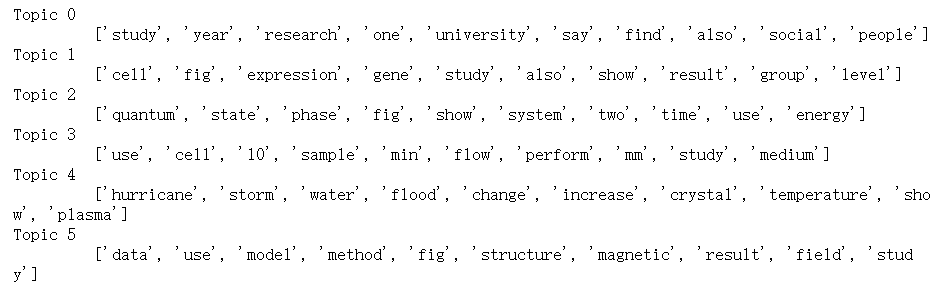

- It is not surprise that our LDA has classified the whole dataset based on a completely different mechanism from the scientific-subject-based rubric which we use, just because LDA takes into account for all of the words and it aggregates them based on general essay classification mechanism. It is rather like the categories shown in the 'Event Registry' searching website. 

- Topic 0: talks about the general administration issue within academic research area. 

- Topic 1: sounds like cell biology field. 

- Topic 2: sound like physics field. 

- Topic 3: Why this category is so similar to the Topic 1? It just shifts its attention a little bit to the biological experiment area. 

- Topic 4: talks about the weather, geographical subjects. 

- Topic 5: Again it's physics? Though a little bit for the experimental physics. 

In this report, I only discuss about the subject classification. However, <b>Latent Dirichlet Allocation gives us a different classification scheme - it has combined the subject, research method, and even social background together</b> as the classification rubric. It reminds me of some potential issues: 

(1) We cannot tell our machine 'to classify just based on the subject'; we show them each sample instead, and it learns and compares on its own from the samples within the group. It can never know the 'classification scheme should only be the subject'. Thus, if in our samples of one subject, there are larget amount of articles which have mentioned the 'experiment methods' (biased samples), then our machine might assume that the 'experiment methods'-related words should be the feature for that subject. But that should not be the case, since if we have a sample of that subject without mentioning experiment methods, then the machine would classify it as another subject. 

(2) We must figure out how to purify our classification scheme and tell this rule to our machine. For example, tell the machine, 'classify only based on subjects, but not experiment methods'. We might achieve this goal in TF-IDF vectoriser for instance, by constructing a word list which are related to experiment methods, and then delete the unique words which are in this word list from each of the subject samples. That is, to give a lower weight for the experiment-related words. 

# Summary of Models


In [3]:
import pandas as pd
data = {'Model': ['TF-IDF, Support Vector Classifier', 
                  'Count Vectorizer, Support Vector Classifier', 
                  'Bigram, Support Vector Classifier', 
                  'TF-IDF, Multinomial Naive Bayes', 
                  'Count Vectorizer, Multinomial Naive Bayes', 
                  'Bigram, Multinomial Naive Bayes', 
                  'TF-IDF, Random Forest', 
                  'Count Vectorizer, Random Forest', 
                  'Bigram, Random Forest', 
                  'TF-IDF, K-Nearest Neighbors', 
                  'Count Vectorizer, K-Nearest Neighbors', 
                  'Bigram, K-Nearest Neighbors', 
                  'FNN01_0HidLayer', 
                  'FNN01_0HidLayer_dropout', 
                  'FNN02_adam', 
                  'FNN02_adam_dropout', 
                  'FNN03_3HidLayers_dropout', 
                  'CNN01_blbl_25epoch', 
                  'CNN01_blbl_finetune_31epoch'], 
        'Accuracy using Holdout': [0.86, 
                                   0.86, 
                                   0.68, 
                                   0.78, 
                                   0.78, 
                                   0.74, 
                                   0.73, 
                                   0.69, 
                                   0.54, 
                                   0.82, 
                                   0.55, 
                                   0.26, 
                                   0.733, 
                                   0.708, 
                                   0.708, 
                                   None, 
                                   0.700, 
                                   0.575, 
                                   0.633], 
            'Accuracy using K-Fold': [0.84, 
                                     0.75, 
                                     0.66, 
                                     0.74, 
                                     0.75, 
                                     0.70, 
                                     0.64, 
                                     0.65, 
                                     0.51, 
                                     0.81, 
                                     0.59, 
                                     0.20, 
                                     0.606, 
                                     0.635, 
                                     0.602, 
                                     0.610, 
                                     0.594, 
                                     0.544, 
                                     0.531]}
sum_table = pd.DataFrame(data)
sum_table

,Model,Accuracy using Holdout,Accuracy using K-Fold
0,"TF-IDF, Support Vector Classifier",0.860,0.840
1,"Count Vectorizer, Support Vector Classifier",0.860,0.750
2,"Bigram, Support Vector Classifier",0.680,0.660
3,"TF-IDF, Multinomial Naive Bayes",0.780,0.740
4,"Count Vectorizer, Multinomial Naive Bayes",0.780,0.750
5,"Bigram, Multinomial Naive Bayes",0.740,0.700
6,"TF-IDF, Random Forest",0.730,0.640
7,"Count Vectorizer, Random Forest",0.690,0.650
8,"Bigram, Random Forest",0.540,0.510
9,"TF-IDF, K-Nearest Neighbors",0.820,0.810


The numerical values in the table is not visually understandable. We will draw some plots to show their performances now. 

In [5]:
import pandas as pd
data2 = {'Model': ['TF-IDF, Support Vector Classifier', 
                  'Count Vectorizer, Support Vector Classifier', 
                  'Bigram, Support Vector Classifier', 
                  'TF-IDF, Multinomial Naive Bayes', 
                  'Count Vectorizer, Multinomial Naive Bayes', 
                  'Bigram, Multinomial Naive Bayes', 
                  'TF-IDF, Random Forest', 
                  'Count Vectorizer, Random Forest', 
                  'Bigram, Random Forest', 
                  'TF-IDF, K-Nearest Neighbors', 
                  'Count Vectorizer, K-Nearest Neighbors', 
                  'Bigram, K-Nearest Neighbors', 
                  'FNN01_0HidLayer', 
                  'FNN01_0HidLayer_dropout', 
                  'FNN02_adam', 
                  'FNN02_adam_dropout', 
                  'FNN03_3HidLayers_dropout', 
                  'CNN01_blbl_25epoch', 
                  'CNN01_blbl_finetune_31epoch', 
                 'TF-IDF, Support Vector Classifier', 
                  'Count Vectorizer, Support Vector Classifier', 
                  'Bigram, Support Vector Classifier', 
                  'TF-IDF, Multinomial Naive Bayes', 
                  'Count Vectorizer, Multinomial Naive Bayes', 
                  'Bigram, Multinomial Naive Bayes', 
                  'TF-IDF, Random Forest', 
                  'Count Vectorizer, Random Forest', 
                  'Bigram, Random Forest', 
                  'TF-IDF, K-Nearest Neighbors', 
                  'Count Vectorizer, K-Nearest Neighbors', 
                  'Bigram, K-Nearest Neighbors', 
                  'FNN01_0HidLayer', 
                  'FNN01_0HidLayer_dropout', 
                  'FNN02_adam', 
                  'FNN02_adam_dropout', 
                  'FNN03_3HidLayers_dropout', 
                  'CNN01_blbl_25epoch', 
                  'CNN01_blbl_finetune_31epoch',], 
        'Method': ['holdout', 'holdout', 'holdout', 'holdout', 'holdout', 
                  'holdout', 'holdout', 'holdout', 'holdout', 'holdout', 
                  'holdout', 'holdout', 'holdout', 'holdout', 'holdout', 
                  'holdout', 'holdout', 'holdout', 'holdout', 
                  'k-fold', 'k-fold', 'k-fold', 'k-fold', 'k-fold', 
                  'k-fold', 'k-fold', 'k-fold', 'k-fold', 'k-fold', 
                  'k-fold', 'k-fold', 'k-fold', 'k-fold', 'k-fold', 
                  'k-fold', 'k-fold', 'k-fold', 'k-fold', ], 
            'Accuracy': [0.86, 
                                   0.86, 
                                   0.68, 
                                   0.78, 
                                   0.78, 
                                   0.74, 
                                   0.73, 
                                   0.69, 
                                   0.54, 
                                   0.82, 
                                   0.55, 
                                   0.26, 
                                   0.733, 
                                   0.708, 
                                   0.708, 
                                   None, 
                                   0.700, 
                                   0.575, 
                                   0.633, 
                                      0.84, 
                                     0.75, 
                                     0.66, 
                                     0.74, 
                                     0.75, 
                                     0.70, 
                                     0.64, 
                                     0.65, 
                                     0.51, 
                                     0.81, 
                                     0.59, 
                                     0.20, 
                                     0.606, 
                                     0.635, 
                                     0.602, 
                                     0.610, 
                                     0.594, 
                                     0.544, 
                                     0.531]}
sum_table2 = pd.DataFrame(data2)

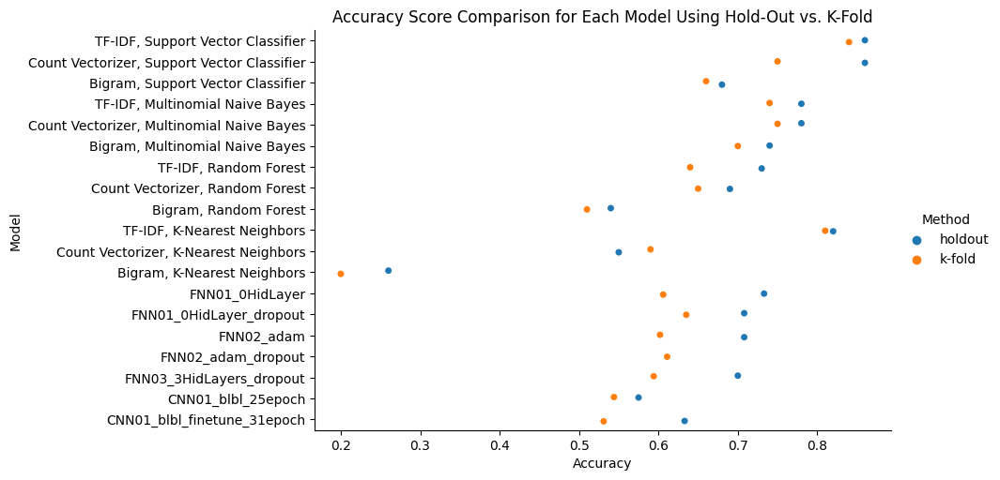

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
# control the width and height ratio of the plot using the 'aspect' attribute: 
cat_plot = sns.catplot(data=sum_table2, x='Accuracy', y='Model', hue='Method', aspect=2)
cat_plot.ax.set_title('Accuracy Score Comparison for Each Model Using Hold-Out vs. K-Fold')


plt.show()

From the plot above, we can conclude: 

- <b>18 out of all these 19 models are acceptable as a pre-trained model for later researches</b>, because all of them have an accuracy of above 0.50, which is much higher than the commonsense baseline 0.167. The exception is the model using 'Bigram Vectorizer with KNN Classifier' which has a very low accuracy, almost the same as the baseline. 

- Almost all the models perform somewhat worse using K-Fold Cross Validation than using Hold-Out Cross Validation. The exception is the 'Count Vectorizer with KNN Classifier' model. The reasons are perhaps: (1) K-Fold can utilise the dataset more comprehensively, and will get an average accruacy for all the training rounds, and thus it considers more cases; while Hold-Out only use the defined train-validation-test set by a set of defined random seeds, and thus it has more contingency. (2) The random seed used in Hold-Out sets (all are 15; NLP models' settings are 0) perhaps always support a higher performing score than the other random seeds, and thus it performs higher than the average. 

- <b>The best model is the 'TF-IDF Vectorizer with SVC Classifier' model</b>, with both the Hold-out accuracy and k-fold accuracy almost 0.9 (about 0.85). 

- There are two models which can be seen as the second-best: <b>the 'Count Vectorizer with SVC Classifier' model, and the 'TF-IDF Vectorizer with KNN Classifier' model</b>. The former has a very high accuracy using Hold-Out Cross Validation (0.86), but has an approximately 10-percentage-points lower accuracy using K-Fold Cross Validation (0.75). The latter has very close accuracies using both Hold-Out and K-Fold, which are about 0.82. 

- There are two models that can be said as the third-best: <b>the 'TF-IDF Vectorizer with MNB Classifier' model, and the 'Count Vectorizer with MNB Classifier' model</b>, with accuracy of above 0.75 for both their Hold-Out score and K-Fold score. 

- <b>The worst model is the 'Bigram Vectorizer with KNN Classifier' model</b>, with an accuracy of 0.20 using K-Fold and 0.26 using Hold-Out, only a little bit better than the commonsense baseline. We should avoid this model in any way. We can adopt each of the model (then fine-tune) other that this model, because all the others have achieved at least an accuracy of 0.50, which has surpassed quite much from the original baseline. 

- The best Neural Network models cannot compare with the best models mentioned above. The best Neural Network models in general can achieve an accuracy of 0.65, if we average each of their Hold-Out performance and its K-Fold performance. 

- <b>Among the Neural Networks, the best Fully-Connected Neural Networks win against the best CNN models I can construct so far</b>. 

- Among the Neural Networks, <b>using Dropout layers can have a slightly better accuracy than not using them</b>, based on K-Fold experiments rather than Hold-Outs, since Hold-Outs can be unstable or uncomprehensive. 

- Among the Neural Networks, <b>the complexity of layers is not a decisive factor for a high accuracy</b>. We have the model named 'FNN01_0HidLayer' which can get an accuracy=0.733 using Hold-Out sets, which is the highest among all the Fully-Connected Neural Networks I have experimented. Just added by one Dropout layer, this model again achieves the best accuracy=0.635 which is the highest K-Fold score in all of the Fully-Connected Neural Networks. 

- Among the NLP models, Bigram is the most unssuccessful vectorizer, among all the three vectorizers. 

- Among the NLP models, for the classifiers, <b>Support Vector Classifier is the best, followed by Multinomial Naive Bayes</b>. Random Forest can achieve an accuracy of above 0.65. While <b>KNN Classifier varies greatly for the accuracy values if combined with different vectorizers</b>: TF-IDF Vectorizer with KNN can achieve about 0.82, which is the second or third highest among all the models; wheras Bigram with KNN just perform not much better than a random classifier; Count Vectorizer with KNN can get a medium accuracy, which is almost the level of my best CNN model. 

# References for This Code Report


[1] Runtubiyongcha (闰土不用叉). 19 Aug 2018. Intro to ROC Principle and How to Use Python to realise ROC Bi-class and Multi-class Classification (ROC原理介绍及利用python实现二分类和多分类的ROC曲线). Retrieved from CSDN Forum, https://blog.csdn.net/xyz1584172808/article/details/81839230. 

[2] McClure, Nick. 2017. <i>Tensorflow Machine Learning Cookbook. Packt Publishing, S.L. 

[3] MarDino. 15 Nov 2017. The Differences Between DropConnect and Dropout (DropConnect与Dropout区别). Retrieved from CSDN Forum, https://blog.csdn.net/weixin_44106928/article/details/103083853. 
    
[4] Chollet, Francois. 2021. <i>Deep Learning with Python</i>. O'REILLY. 
    
[5] Alialili (阿力阿哩哩). 19 Mar 2020. CNN Convolutional Neural Network and Text Classification (CNN卷积神经网络与文本分类(keras)). Video. Retrieved from Bilibili, https://www.bilibili.com/video/BV1u7411d7zU/?share_source=copy_web&vd_source=296c14837e03501f00801a512d70f87e. 
    
[6] Vajjala, Sowmya, Anuj Gupta, Harshit Surana, and Bodhisattwa Majumder. 2020. <i>Practical Natural Language Processing - A Pragmatic Approach to Processing and Analyzing Language Data</i>. O'Reilly Media. 
    
[7] codehax41. 3 Jul 2019. BBC-Text-Classification. BBC using Keras.ipynb. https://github.com/codehax41/BBC-Text-Classification/blob/master/BBC%20using%20Keras.ipynb
    
[8] Russell-Rose, Tony. 2022. Topic modelling. Video. In <i>University of London BSc Computer Science, CM3060-Natural Language Processing module</i>, Week 6. https://www.coursera.org/learn/uol-cm3060-natural-language-processing/lecture/70J53. 

[9] Jain, Sanskar. 2019. kernelb49fc09b70 - Math Lectures. https://www.kaggle.com/code/sanskar27jain/kernelb49fc09b70. 

[10] CityD. 5 Apr 2022. Optimizers - SGD, Momentum, AdaGrad, RMSProp, Adam. Retrieved from CSDN Forum, https://blog.csdn.net/tcn760/article/details/123965374?spm=1001.2014.3001.5506. 
    
[11] Goodfellow et al. 2016. Chapter 7 Regularization for Deep Learning. <i>Deep Learning</i>. MIT Press. https://www.deeplearningbook.org/. 

[12] Replete. 11 May 2021. How to Determine the Number of Layers and the Number of Hidden Layer Neurons in a Neural Network (如何确定神经网络的层数和隐藏层神经元数量). Retrieved from CSDN Forum, https://blog.csdn.net/weixin_38906715/article/details/125675876?spm=1001.2014.3001.5506. 
    
[13] poowicat. 12 May 2022. Talking about the Influence of Batch_size on Model training in Deep Learning (浅谈深度学习中Batch_size的大小对模型训练的影响). Retrieved from CSDN Forum, https://blog.csdn.net/poowicat/article/details/124733413?spm=1001.2014.3001.5506. 
    
[14] Zhou, Zhihua (周志华). 2016. <i>Machine Learning (机器学习)</i>. Tsinghua University Press, Beijing. 
    
[15] Alice Xiaixuexi (Alice熹爱学习). 21 June 2017. Why We Use Cross Validation (为什么要用交叉验证). Retrieved from CSDN Forum, https://blog.csdn.net/aliceyangxi1987/article/details/73532651. 
    
[16] Wang, Zhili. 2021. <i>Python Deep Learning (Python深度学习)</i>. Tsinghua University Press, Beijing.

Please refer to my Final Report for the complete explanation for my whole project. Thank you. 